<a href="https://colab.research.google.com/github/Yuanranzhu/SINN/blob/main/FPU_chain_SINN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!hostname

gnode014.cluster


In [2]:
!nvidia-smi

Fri Mar 22 11:10:51 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.23.08              Driver Version: 545.23.08    CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA H100 PCIe               Off | 00000000:A8:00.0 Off |                    0 |
| N/A   27C    P0              47W / 350W |      4MiB / 81559MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [3]:
import itertools as it
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
import torch.fft
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sdeint
from toolbox import (
    make_loss,
    StatLoss,
    SINN,
    FPU
)
import time

In [4]:
torch.cuda.is_available()

True

In [5]:
device = torch.device('cuda')

In [6]:
print(torch.__version__)
print(torch.version.cuda)

2.0.1+cu118
11.8


In [7]:
seed = 1234
torch.set_default_dtype(torch.float)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)

In [8]:
%%time

######### Generating SINN training data by solving SDE
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.integrate import quad



###### Parameters 
mag=1              # Magnitude of the coupling
beta=1             # Inverse temperature 
alpha=1            
gamma=1            # Anharmonic potential U(x)=alpha/2* x^2  + gamma/4* x^4
N=100              # Total number of oscillators in the chain 
N_mid=int(N/2)     # Coordinate of the center CG-oscillator 
dt=0.01 
delta_t=0.5
batch = 400
sec_length = 400

Time = 5*delta_t*sec_length
print(Time)
length=int(Time/dt)+1
t = np.linspace(0,Time,length) # define time axis
gap=int(delta_t/dt)
t_store=t[0:-1:gap]



# (q49,q50)
q49_store = np.zeros([t_store.size+1,batch])    
q50_store = np.zeros([t_store.size+1,batch])

q=np.zeros((1,length)) 

p1=np.zeros((N,batch))
q1=np.zeros((N,batch))
p0=np.zeros((N,batch))
q0=np.zeros((N,batch))

# solve SDE

j=1
for i in range(1,length):
    q1=q0+dt*(p0-np.roll(p0,1,axis=0))
    p1=(1-mag*dt)*p0+dt*alpha*(np.roll(q0,-1,axis=0)-q0)+dt*gamma*(np.roll(q0,-1,axis=0)**3-q0**3)+np.sqrt(2*dt*gamma/beta)*np.random.randn(N,batch)
    if i % gap ==0:        
        q49_store[j,:]= np.sum(q1[0:N_mid,:], axis=0)
        q50_store[j,:]= np.sum(q1[0:N_mid,:], axis=0)
        j=j+1
    p0=p1
    q0=q1
                                
Toss=int(t_store.size/4)
q49_store=q49_store[Toss:-1,:] 
q50_store=q50_store[Toss:-1,:] 

1000.0
CPU times: user 9min 17s, sys: 8.89 ms, total: 9min 17s
Wall time: 9min 18s


Text(0.5, 1.0, 'Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$')

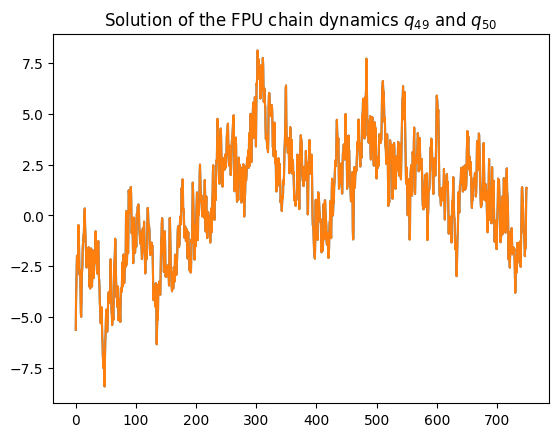

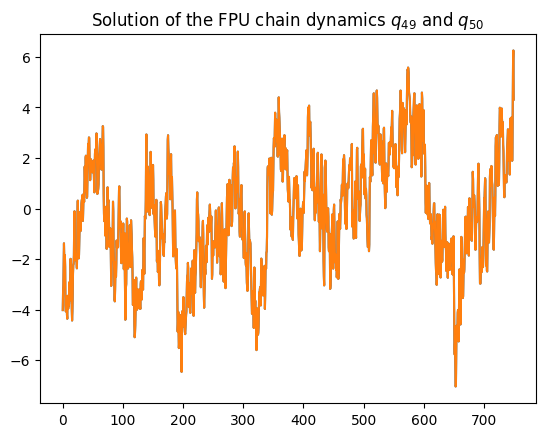

In [9]:
plt.figure(0)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

plt.figure(1)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,1])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,1])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

(400, 400) (400, 400) (400, 400)
(400, 400) (400, 400, 2)


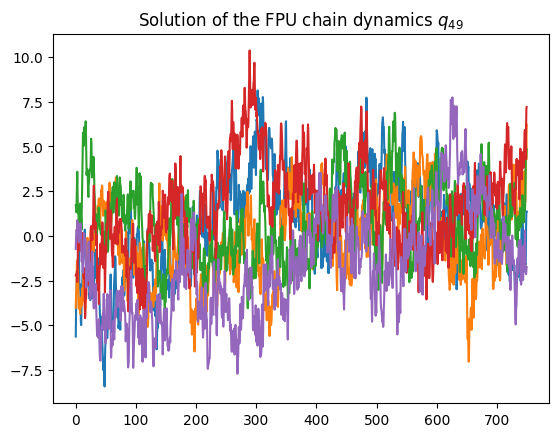

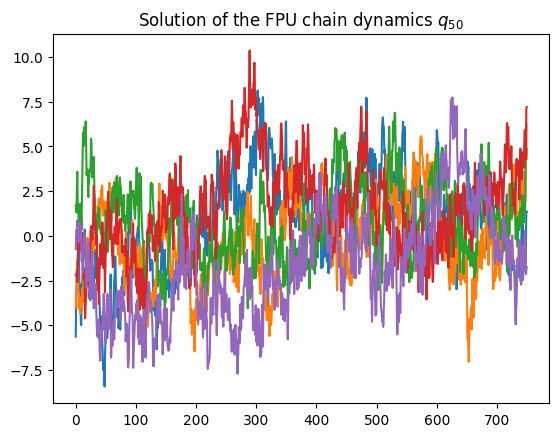

In [10]:
plt.figure(0)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$")

plt.figure(1)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{50}$")

###########################################   Construct the sample traj for the LSTM learning 
ini=np.random.randn(sec_length,batch)
Traj49 = q49_store[0:sec_length,:]
Traj50 = q50_store[0:sec_length,:]
print(ini.shape, Traj49.shape, Traj50.shape)

Traj = np.empty((sec_length,batch,2))
Traj[:,:,0] = Traj49
Traj[:,:,1] = Traj50
T=np.arange(len(Traj[:,1]))*delta_t
x=np.linspace(-5,5,sec_length)
print(ini.shape, Traj.shape)

In [11]:
# Reformulating data into Torch tensors 
# Input of SINN should be of the form (seq_len, batch, input_size)

ini = np.random.randn(2*sec_length,2*batch).astype(np.float32) 
input = torch.from_numpy(ini.reshape(2*sec_length, batch, 2)).to(device)
batch_validation = batch
val_set = torch.normal(0.0, 1.0, (2*sec_length, batch_validation, 2), device=device)


Traj = Traj.astype(np.float32) 
target = torch.from_numpy(Traj.reshape(sec_length, batch, 2)).to(device)
print('The torch input size is', input.size(), input.dtype)
print('The torch validation size is', val_set.size(), val_set.dtype)
print('The torch target size is', target.size(), target.dtype)

The torch input size is torch.Size([800, 400, 2]) torch.float32
The torch validation size is torch.Size([800, 400, 2]) torch.float32
The torch target size is torch.Size([400, 400, 2]) torch.float32


In [12]:
# Defining Loss functions
LAGS = 400
N = 400
loss_acf_fft = make_loss('acf[fft]', target, lags=LAGS, device=device)
loss_acf_sec_moment = make_loss('acf[fft]', target**2, lags=LAGS, device=device)
loss_acf_bruteforce = make_loss('acf[bruteforce]', target, lags=LAGS, device=device)
loss_acf_randbrute = make_loss('acf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_ccf_fft = make_loss('ccf[fft]', target, lags=LAGS, device=device)
loss_ccf_sec_moment = make_loss('ccf[fft]', target**2, lags=LAGS, device=device)
loss_ccf_bruteforce = make_loss('ccf[bruteforce]', target, lags=LAGS, device=device)
loss_ccf_randbrute = make_loss('ccf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_pdf_empirical1 = make_loss('pdf', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2 = make_loss('pdf6', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2D = make_loss('pdf2D', target, lower=-5, upper=5, n=N, bw=None, device=device)

torch.Size([400, 2])


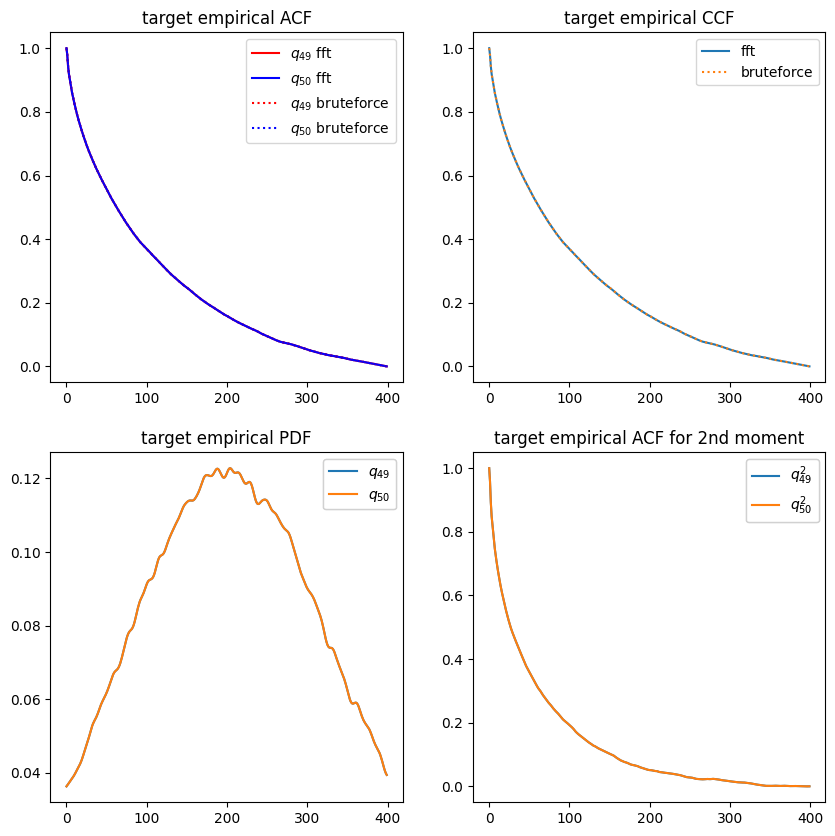

In [13]:
# Plotting target ACFs and PDF
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs[0,0].plot(loss_acf_fft._target.cpu()[...,0],'r', label=r'$q_{49}$ fft')
axs[0,0].plot(loss_acf_fft._target.cpu()[...,1],'b', label=r'$q_{50}$ fft')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,0],'r:', label= r'$q_{49}$ bruteforce')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,1], 'b:', label=r'$q_{50}$ bruteforce')
axs[0,0].legend()
axs[0,0].set_title('target empirical ACF')

axs[0,1].plot(loss_ccf_fft._target.cpu()[...,1:3], label='fft')
axs[0,1].plot(loss_ccf_bruteforce._target.cpu()[...,1:3],':',label='bruteforce')
# legend2 = axs[0,1].legend(iter(bf), ('q bf', 'p bf'), loc=1)
# axs[0,1].add_artist(legend2)
axs[0,1].legend()
axs[0,1].set_title('target empirical CCF')

x_grid=-np.linspace(-5,5,num=sec_length)
pdf = axs[1,0].plot(loss_pdf_empirical1._target.cpu())
legend3 = axs[1,0].legend(iter(pdf), (r'$q_{49}$',r'$q_{50}$'), loc=1)
axs[1,0].add_artist(legend3)
axs[1,0].set_title('target empirical PDF')


print(loss_acf_sec_moment._target.cpu().size())
sec_moment = axs[1,1].plot(loss_acf_sec_moment._target.cpu())
legend4 = axs[1,1].legend(iter(sec_moment), (r'$q_{49}^2$',r'$q_{50}^2$'),loc=1)
axs[1,1].set_title('target empirical ACF for 2nd moment')
axs[1,1].add_artist(legend4)

plt.show()

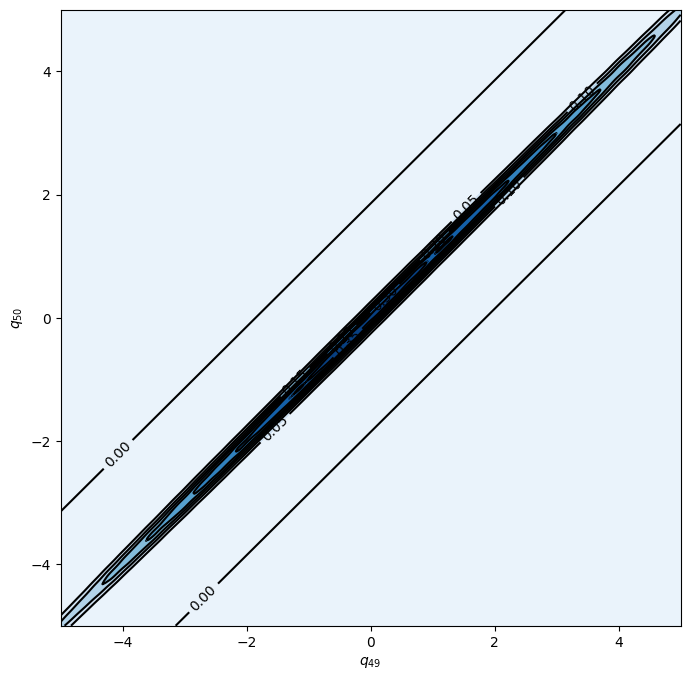

In [14]:
xmin, xmax = -5, 5
ymin, ymax = -5, 5

xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
fig = plt.figure(figsize=(8, 8))
ax = fig.gca()
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Contourf plot
cfset = ax.contourf(xx, yy, loss_pdf_empirical2D._target.cpu(), cmap='Blues')
## Or kernel density estimate plot instead of the contourf plot

# Contour plot
cset = ax.contour(xx, yy, loss_pdf_empirical2D._target.cpu(), colors='k')
# Label plot
ax.clabel(cset, inline=1, fontsize=10)
ax.set_xlabel(r'$q_{49}$')
ax.set_ylabel(r'$q_{50}$')

plt.show()

Text(0.5, 1.0, 'target empirical PDF')

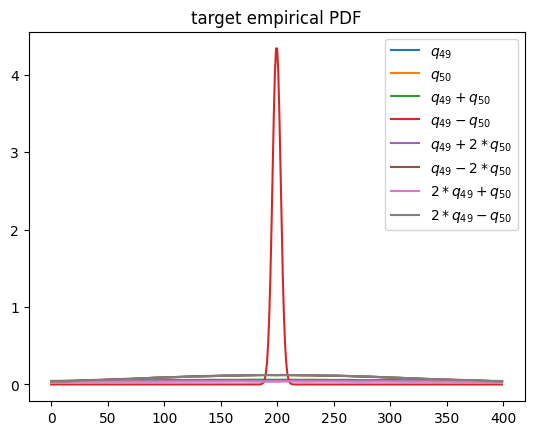

In [15]:
x_grid=-np.linspace(-5,5,num=sec_length)
plt.plot(loss_pdf_empirical1._target.cpu()[...,0],label=r'$q_{49}$')
plt.plot(loss_pdf_empirical1._target.cpu()[...,1],label=r'$q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,0],label=r'$q_{49}+q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,1],label=r'$q_{49}-q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,2],label=r'$q_{49}+2*q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,3],label=r'$q_{49}-2*q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,4],label=r'$2*q_{49}+q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,5],label=r'$2*q_{49}-q_{50}$')
plt.legend()
plt.title('target empirical PDF')

In [16]:
class Model:
    def __init__(self, net):

        self.x_acf_s = None
        self.x_ccf_s = None
        self.x_pdf_s = None
        self.x_pdf2_s = None
        self.x_acf2_s = None
        self.s_collect = []

        self.net = net

        self.T_error=[]
        self.V_error=[]
        self.T_ccf=[]
        self.V_ccf=[]
        self.T_pdf=[]
        self.V_pdf=[]
        self.T_pdf2=[]
        self.V_pdf2=[]
        self.T_acf=[]
        self.V_acf=[]
        self.T_acf2=[]
        self.V_acf2=[]
        self.Step=[]
        self.iter = 0
        self.time = 0

    def train_U(self, x):
        return self.net(x)

    def predict_U(self, x):
        return self.train_U(x)

    def likelihood_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        loss = torch.reciprocal(2. * self.x_acf_s ** 2) * loss_acf.detach()      \
               + torch.reciprocal(2. * self.x_ccf_s ** 2) * loss_ccf.detach()    \
               + torch.reciprocal(2. * self.x_pdf_s ** 2) * loss_pdf.detach()    \
               + torch.reciprocal(2. * self.x_pdf2_s ** 2) * loss_pdf2.detach()  \
               + torch.reciprocal(2. * self.x_acf2_s ** 2) * loss_acf2.detach()  \
               + torch.log(self.x_acf_s * self.x_ccf_s * self.x_pdf_s * self.x_pdf2_s * self.x_acf2_s)
        return loss

    def true_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        return torch.reciprocal(2. * self.x_acf_s.detach() ** 2) * loss_acf + torch.reciprocal(2. * self.x_ccf_s.detach() ** 2) * loss_ccf + torch.reciprocal(2. * self.x_pdf_s.detach() ** 2) * loss_pdf + torch.reciprocal(2. * self.x_pdf2_s.detach() ** 2) * loss_pdf2 + torch.reciprocal(2. * self.x_acf2_s.detach() ** 2) * loss_acf2


    def run_baseline(self):
        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        for step in range(20000):
            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val)+ loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break

        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')



    def run_AW(self):
        self.x_acf_s = nn.Parameter(self.x_acf_s, requires_grad=True)
        self.x_ccf_s = nn.Parameter(self.x_ccf_s, requires_grad=True)
        self.x_pdf_s = nn.Parameter(self.x_pdf_s, requires_grad=True)
        self.x_pdf2_s = nn.Parameter(self.x_pdf2_s, requires_grad=True)
        self.x_acf2_s = nn.Parameter(self.x_acf2_s, requires_grad=True)


        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        optimizer_adam_weight = optim.Adam([self.x_acf_s] + [self.x_ccf_s] + [self.x_pdf_s] + [self.x_pdf2_s] + [self.x_acf2_s],
                                                     lr=1e-3)

        for step in range(20000):
            self.s_collect.append([self.iter, self.x_acf_s.item(), self.x_ccf_s.item(), self.x_pdf_s.item(), self.x_pdf2_s.item(), self.x_acf2_s.item()])

            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val) + loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break
            optimizer_adam_weight.zero_grad()
            loss = self.likelihood_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam_weight.step()
            
        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')


    def train(self):
        self.x_acf_s = torch.tensor(2.).float()
        self.x_ccf_s = torch.tensor(2.).float()
        self.x_pdf_s = torch.tensor(2.).float()
        self.x_pdf2_s = torch.tensor(2.).float()
        self.x_acf2_s = torch.tensor(2.).float()
        start_time = time.time()
        if model_type == 0:
            self.run_baseline()
        elif model_type == 1:
            self.run_AW()
        elapsed = time.time() - start_time
        self.time = elapsed
        print('Training time: %.2f' % elapsed)
        avg_time = elapsed/self.iter
        print('Training time per iteration: %.2f' % avg_time)
        print('Number of Iterations:%d' %self.iter)

In [17]:
### Defining SINN model
net = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension

In [18]:
model = Model(net=net)

In [19]:
model_type = 1

In [20]:
model.train()

[0]-th step loss: 0.7978, 0.7881, acf: 0.10110, ccf: 0.10199, pdf: 0.29269, pdf2: 0.24783, acf2: 0.04449
[50]-th step loss: 0.2283, 0.2970, acf: 0.03376, ccf: 0.03376, pdf: 0.13204, pdf2: 0.08643, acf2: 0.01098
[100]-th step loss: 0.3069, 0.3032, acf: 0.03651, ccf: 0.03651, pdf: 0.10220, pdf2: 0.05903, acf2: 0.06896
[150]-th step loss: 0.0621, 0.0591, acf: 0.00255, ccf: 0.00255, pdf: 0.03642, pdf2: 0.01664, acf2: 0.00100
[200]-th step loss: 0.0479, 0.0493, acf: 0.00255, ccf: 0.00255, pdf: 0.03095, pdf2: 0.01264, acf2: 0.00057
[250]-th step loss: 0.0472, 0.0417, acf: 0.00208, ccf: 0.00208, pdf: 0.02630, pdf2: 0.01068, acf2: 0.00059
[300]-th step loss: 0.0371, 0.0378, acf: 0.00144, ccf: 0.00144, pdf: 0.02424, pdf2: 0.00956, acf2: 0.00109
[350]-th step loss: 0.0466, 0.0342, acf: 0.00305, ccf: 0.00305, pdf: 0.01723, pdf2: 0.00704, acf2: 0.00382
[400]-th step loss: 0.0313, 0.0283, acf: 0.00192, ccf: 0.00192, pdf: 0.01575, pdf2: 0.00654, acf2: 0.00222
[450]-th step loss: 0.0608, 0.0254, acf:

[3850]-th step loss: 0.0276, 0.0248, acf: 0.00015, ccf: 0.00015, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01245
[3900]-th step loss: 0.0316, 0.0288, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01659
[3950]-th step loss: 0.0264, 0.0237, acf: 0.00035, ccf: 0.00035, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01096
[4000]-th step loss: 0.0262, 0.0266, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01443
[4050]-th step loss: 0.0287, 0.0268, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01465
[4100]-th step loss: 0.0244, 0.0246, acf: 0.00017, ccf: 0.00017, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01217
[4150]-th step loss: 0.0241, 0.0264, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01424
[4200]-th step loss: 0.0295, 0.0264, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01425
[4250]-th step loss: 0.0289, 0.0265, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01429
[4300]-th step loss: 0.0243,

[7650]-th step loss: 0.0258, 0.0276, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01550
[7700]-th step loss: 0.0261, 0.0278, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01563
[7750]-th step loss: 0.0250, 0.0263, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01418
[7800]-th step loss: 0.0255, 0.0272, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01508
[7850]-th step loss: 0.0289, 0.0275, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01537
[7900]-th step loss: 0.0294, 0.0280, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01582
[7950]-th step loss: 0.0256, 0.0262, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01402
[8000]-th step loss: 0.0240, 0.0251, acf: 0.00011, ccf: 0.00011, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01280
[8050]-th step loss: 0.0306, 0.0313, acf: 0.00024, ccf: 0.00024, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01876
[8100]-th step loss: 0.0266,

[11450]-th step loss: 0.0279, 0.0277, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01552
[11500]-th step loss: 0.0292, 0.0273, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01517
[11550]-th step loss: 0.0268, 0.0234, acf: 0.00041, ccf: 0.00041, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01050
[11600]-th step loss: 0.0288, 0.0250, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01274
[11650]-th step loss: 0.0295, 0.0276, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01548
[11700]-th step loss: 0.0287, 0.0262, acf: 0.00008, ccf: 0.00008, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01396
[11750]-th step loss: 0.0249, 0.0265, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01435
[11800]-th step loss: 0.0260, 0.0265, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01433
[11850]-th step loss: 0.0272, 0.0281, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01596
[11900]-th step los

[15250]-th step loss: 0.0241, 0.0262, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00381, acf2: 0.01407
[15300]-th step loss: 0.0250, 0.0263, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01418
[15350]-th step loss: 0.0324, 0.0296, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01730
[15400]-th step loss: 0.0281, 0.0291, acf: 0.00008, ccf: 0.00008, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01688
[15450]-th step loss: 0.0261, 0.0282, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01608
[15500]-th step loss: 0.0237, 0.0274, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01521
[15550]-th step loss: 0.0280, 0.0266, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01449
[15600]-th step loss: 0.0289, 0.0293, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01706
[15650]-th step loss: 0.0325, 0.0272, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01511
[15700]-th step los

[19050]-th step loss: 0.0262, 0.0268, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01465
[19100]-th step loss: 0.0330, 0.0291, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01679
[19150]-th step loss: 0.0290, 0.0295, acf: 0.00011, ccf: 0.00011, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01724
[19200]-th step loss: 0.0309, 0.0271, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01500
[19250]-th step loss: 0.0264, 0.0272, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00382, acf2: 0.01506
[19300]-th step loss: 0.0255, 0.0281, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01591
[19350]-th step loss: 0.0260, 0.0273, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01515
[19400]-th step loss: 0.0234, 0.0261, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01397
[19450]-th step loss: 0.0270, 0.0261, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01401
[19500]-th step los

In [21]:
def draw_loss(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot",fontsize=15) 
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'r',label='Training error')
    plt.plot(model.Step, model.V_error,'b--',label='Validation error')
#     plt.loglog(model.Step, model.T_error,'r',label='Training error')
#     plt.loglog(model.Step, model.V_error,'b--',label='Validation error')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)

In [22]:
def draw_errors(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot for loss functions w/o coeff",fontsize=15)
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'k',label='Training error')
    plt.plot(model.Step, model.V_error,'k--')
    plt.plot(model.Step, model.T_acf,'r',label='acf error')
    plt.plot(model.Step, model.V_acf,'r--')
    plt.plot(model.Step, model.T_ccf,'b',label='ccf error')
    plt.plot(model.Step, model.V_ccf,'b--')
    plt.plot(model.Step, model.T_pdf,'y',label='pdf error')
    plt.plot(model.Step, model.V_pdf,'y--')
    plt.plot(model.Step, model.T_pdf2,'m',label='pdf2 error')
    plt.plot(model.Step, model.V_pdf2,'m--')
    plt.plot(model.Step, model.T_acf2,'g',label='acf2 error')
    plt.plot(model.Step, model.V_acf2,'g--')
    
#     plt.loglog(model.Step, model.T_error,'k',label='Training error')
#     plt.loglog(model.Step, model.V_error,'k--')
#     plt.loglog(model.Step, model.T_acf,'r',label='acf error')
#     plt.loglog(model.Step, model.V_acf,'r--')
#     plt.loglog(model.Step, model.T_ccf,'b',label='ccf error')
#     plt.loglog(model.Step, model.V_ccf,'b--')
#     plt.loglog(model.Step, model.T_pdf,'y',label='pdf error')
#     plt.loglog(model.Step, model.V_pdf,'y--')
#     plt.loglog(model.Step, model.T_pdf2,'m',label='pdf2 error')
#     plt.loglog(model.Step, model.V_pdf2,'m--')
#     plt.loglog(model.Step, model.T_acf2,'g',label='acf2 error')
#     plt.loglog(model.Step, model.V_acf2,'g--')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15, bbox_to_anchor=(1.1, 1.05))

In [23]:
def draw_adaptive_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
#     plt.yscale('log')
    plt.plot(s_collect[:, 0], s_collect[:, 1], 'r-', label=r'$\epsilon_{acf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 2], 'b-', label='$\epsilon_{ccf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 3], 'y-', label='$\epsilon_{pdf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 4], 'm-', label='$\epsilon_{pdf2}$')
    plt.plot(s_collect[:, 0], s_collect[:, 5], 'g-', label='$\epsilon_{acf2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$s$')
#     plt.xscale('log')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

In [24]:
def draw_epoch_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
    plt.yscale('log')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 1]**2), 'r-', label=r'$\frac{1}{2\epsilon_{acf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 2]**2), 'b-', label=r'$\frac{1}{2\epsilon_{ccf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 3]**2), 'y-', label=r'$\frac{1}{2\epsilon_{pdf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 4]**2), 'm-', label=r'$\frac{1}{2\epsilon_{pdf2}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 5]**2), 'g-', label=r'$\frac{1}{2\epsilon_{acf2}^2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$\omega$')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

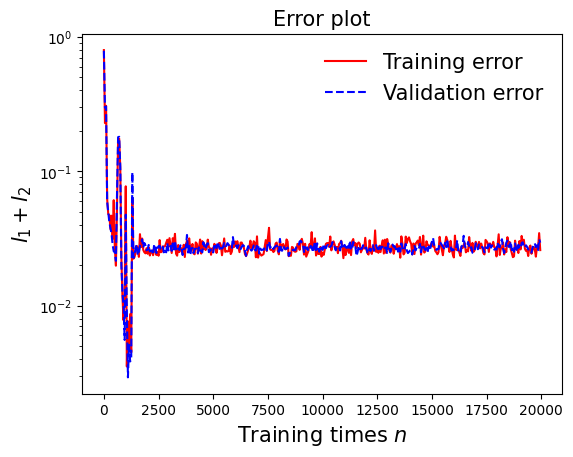

In [25]:
draw_loss(model)

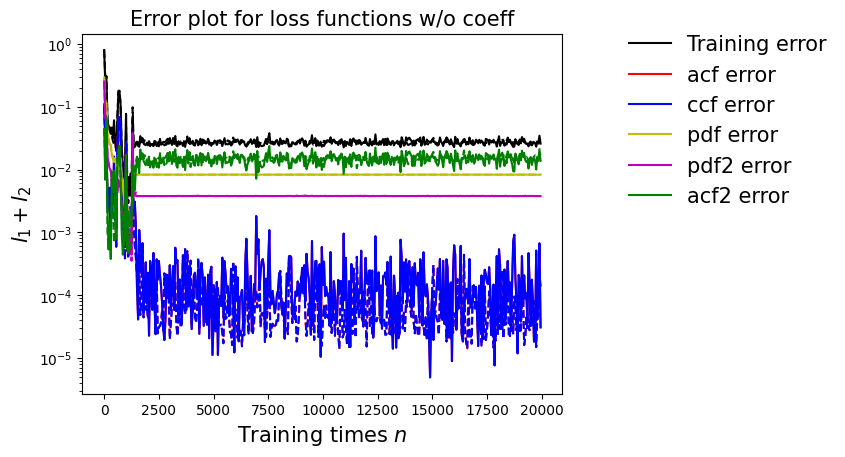

In [26]:
draw_errors(model)

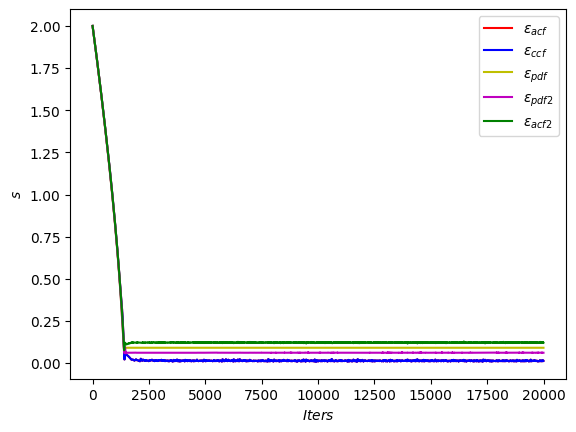

In [27]:
draw_adaptive_w(model)

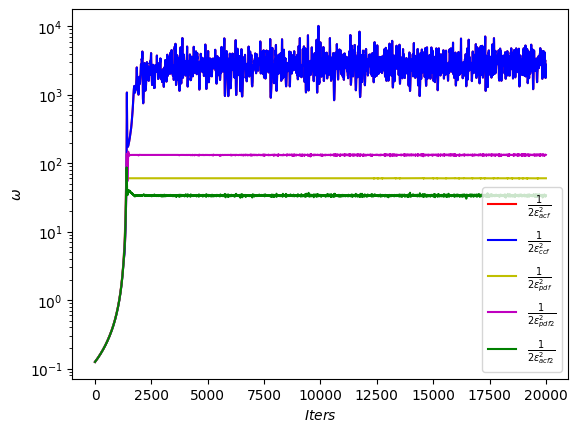

In [28]:
draw_epoch_w(model)

## Test 1: plot the sample path generated by SINN and the exact sample path 

In [29]:
def test1(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    # Test 1: plot the sample path generated by SINN and the exact sample path 
    skip = 0

    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.plot(T[skip:]-T[skip], Traj[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$\tilde{q}_1(t)$ and $\tilde{q}_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.plot(T[skip:]-T[skip], prediction[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_1(t)$ and $q_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF

In [30]:
def test2(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF  
    acf_p=StatLoss.acf(Pred[-sec_length:,:,:])
    acf_t=StatLoss.acf(target)
    corr_p1=acf_p.detach().cpu().numpy()
    corr_t1=acf_t.detach().cpu().numpy()
    ccf_p=StatLoss.ccf(Pred[-sec_length:,:,:])
    ccf_t=StatLoss.ccf(target)
    corr_p2=ccf_p.detach().cpu().numpy()
    corr_t2=ccf_t.detach().cpu().numpy()
    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_1$',fontsize=15)    
    plt.plot(T, corr_t1[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_2$',fontsize=15)          
    plt.plot(T, corr_t1[...,-1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,-1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized CCF',fontsize=15)    
    plt.plot(T, corr_t2[:,:],'r')        # correlation function of the target 
    plt.plot(T, corr_p2[:,:], 'b--')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.ylim(-0.05,0.05)

## Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  

In [31]:
def test3(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  
    rho_data =  StatLoss.gauss_kde(target, -5, 5, 400, None).cpu()
    rho_input = StatLoss.gauss_kde(ran_input, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    rho_data2 =  StatLoss.gauss_kde6(target, -5, 5, 400, None).cpu()
    rho_prediction2 = StatLoss.gauss_kde6(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()


    x=np.linspace(-5, 5, 400)
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function",fontsize=15)    
    plt.plot(x, rho_data.numpy()[...,0],label=r'Exact PDF of $q_{49}$')    # target PDF
    plt.plot(x, rho_data.numpy()[...,1],label=r'Exact PDF of $q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction.numpy()[...,0], ':',label=r'PDF of the output $q_{49}$')  # PDF after the training 
    plt.plot(x, rho_prediction.numpy()[...,1], ':',label=r'PDF of the output $q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,0],label=r'Exact PDF of $q_{49}+q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,1],label=r'Exact PDF of $q_{49}-q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,0], ':',label=r'PDF of the output $q_{49}+q_{50}$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,1], ':',label=r'PDF of the output $q_{49}-q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,2],label=r'Exact PDF of $q_{49}+2q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,3],label=r'Exact PDF of $q_{49}-2q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,2], ':',label=r'PDF of the output $q_{49}+2\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,3], ':',label=r'PDF of the output $q_{49}-2\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(3)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,4],label=r'Exact PDF of $2q_{49}+\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,5],label=r'Exact PDF of $2q_{49}-\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,4], ':',label=r'PDF of the output $2q_{49}+\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,5], ':',label=r'PDF of the output $2q_{49}-\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 4: Comparing the higher-order ACF

In [32]:
def test4(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    # Test 4: Comparing the higher-order ACF
    acf2=StatLoss.acf(target**2)
    pred_norm=torch.from_numpy((prediction).reshape(sec_length, batch,2))
    acf2_app=StatLoss.acf(pred_norm**2)

    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{49}^2$',fontsize=15)    
    plt.plot(T, acf2.detach().cpu().numpy()[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{50}^2$',fontsize=15)          
    plt.plot(T, acf2.detach().cpu().numpy()[...,1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()    

## Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 

In [33]:
def test5(model):
    # Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 
    [a,b,c]=input.size()
    skip=20
    scale=10
    burnin=3
    fold=800
    batch_new=50
    ran_input=torch.randn(((scale-burnin)*a,batch_new,c),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred_L, _= model.predict_U(ran_input)
    prediction_ext=Pred_L.detach().cpu().numpy().reshape((scale-burnin)*a, batch_new,2)
    ccf_p=StatLoss.ccf(Pred_L,method='bruteforce')

    LT=np.linspace(0,(scale-burnin)*a*delta_t,num=(scale-burnin)*a+1)
    LT=LT[0:-1]


    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

## Test 6: comparing scatter plots

In [34]:
def test6(model):
    # Test 6: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.scatter(Traj[:,:,0], Traj[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.scatter(prediction[:,:,0],prediction[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 7: comparing joint PDF contours

In [35]:
def test7(model):
    # Test 5: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    rho_data =  StatLoss.gauss_kde2D(target, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde2D(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    fig = plt.figure(0, figsize=(5, 5))
    plt.title("PDF Contours",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

    xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
    axs[0]  = fig.gca()
    plt.xlim(xmin, xmax)
    plt.ylim(ymin, ymax)
    
    plt.contour(xx,yy,rho_data.numpy(),colors='r')
    plt.contour(xx,yy,rho_prediction.numpy(),colors='b',linestyles='dashed')

    plt.xlabel(r'$q_{49}$')
    plt.ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(1,figsize=(5, 5))
    plt.title("MD trajectories",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_data.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_data.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(2,figsize=(5, 5))
    plt.title("SINN output",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_prediction.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_prediction.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

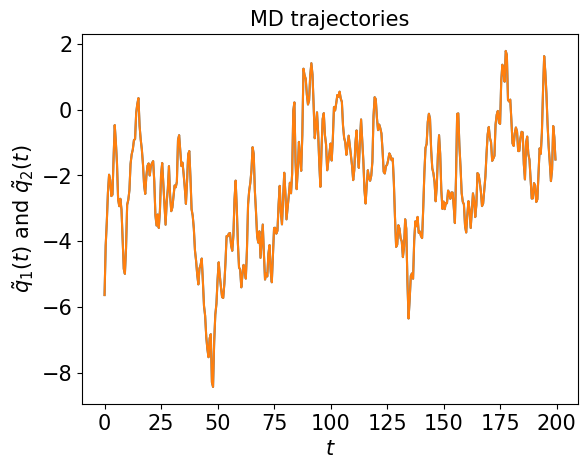

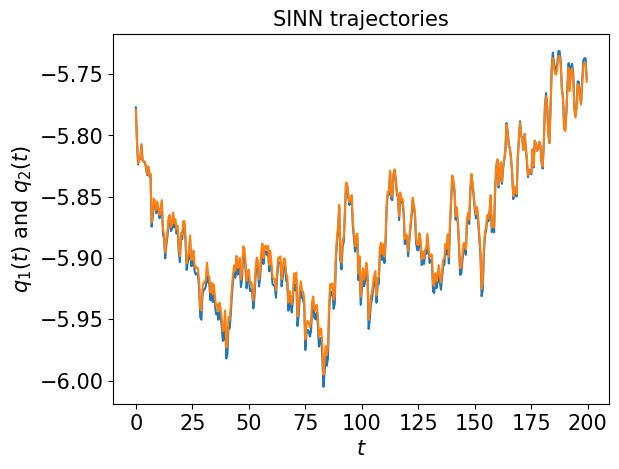

In [36]:
test1(model)

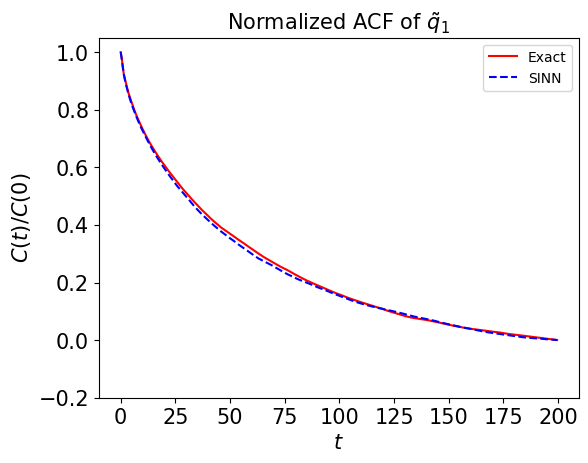

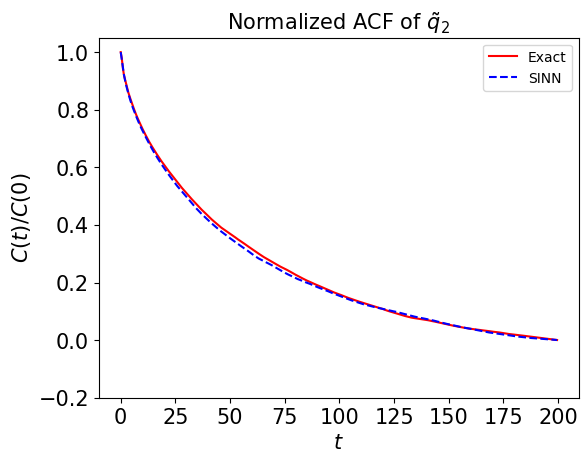

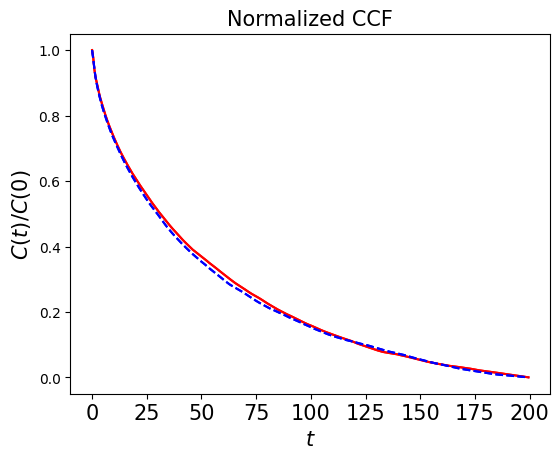

In [37]:
test2(model)

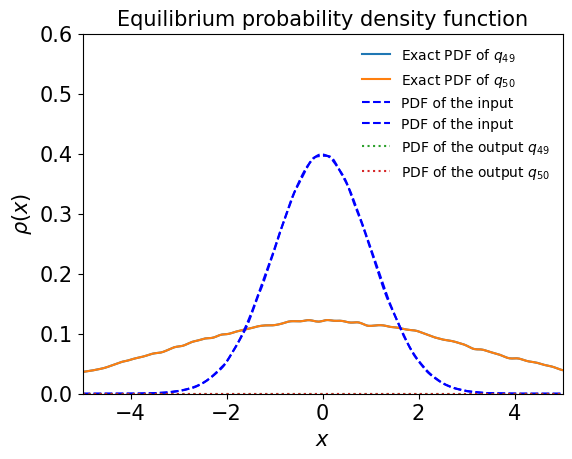

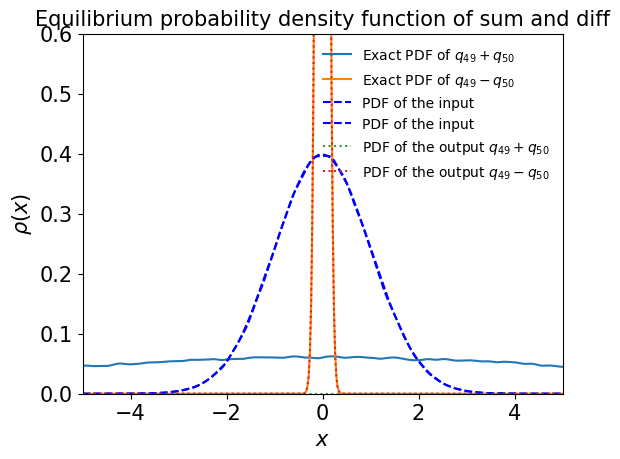

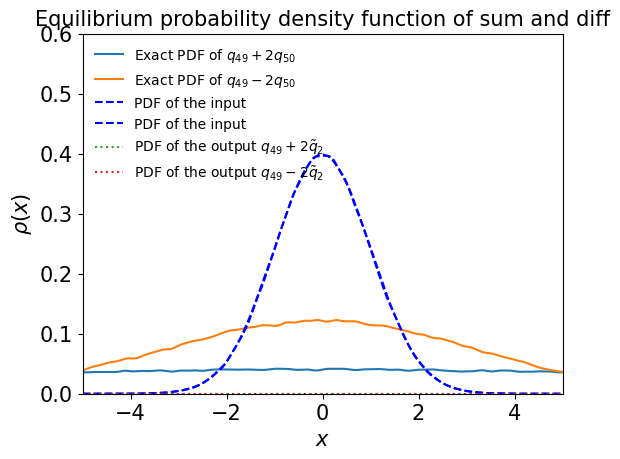

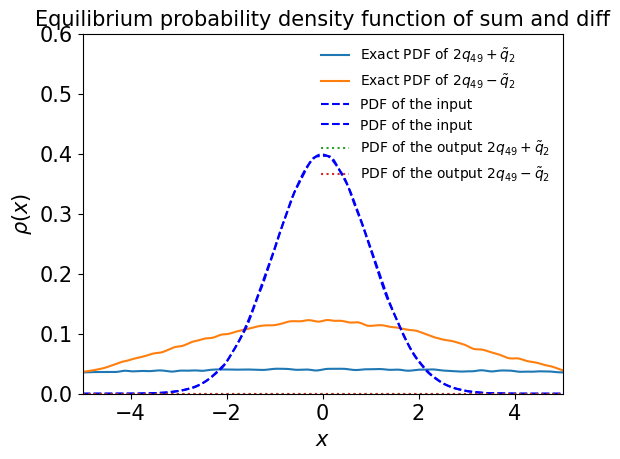

In [38]:
test3(model)

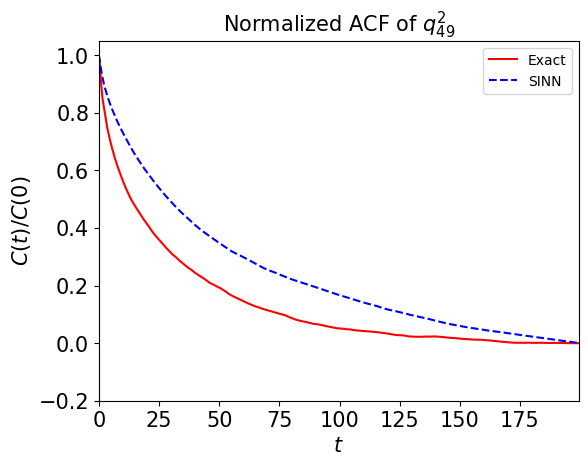

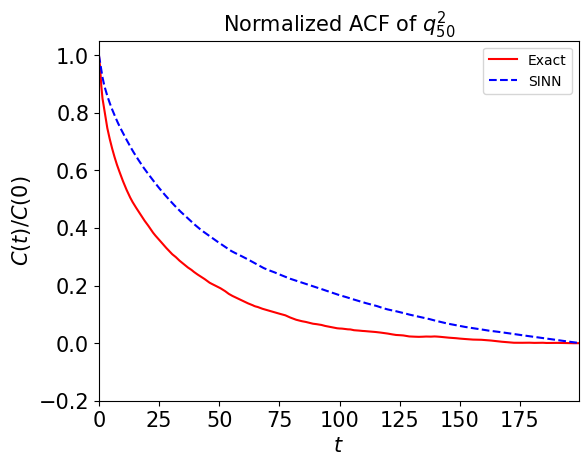

In [39]:
test4(model)

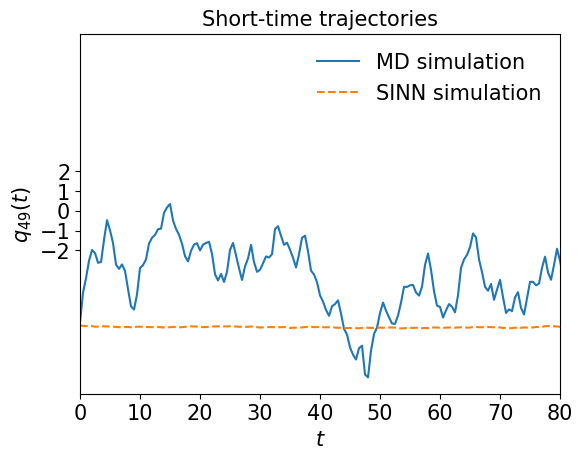

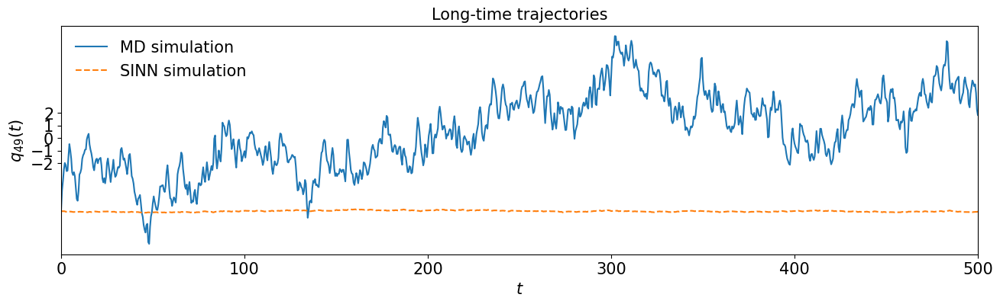

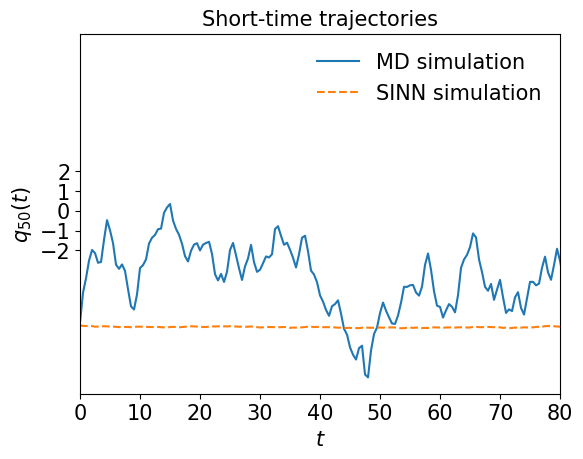

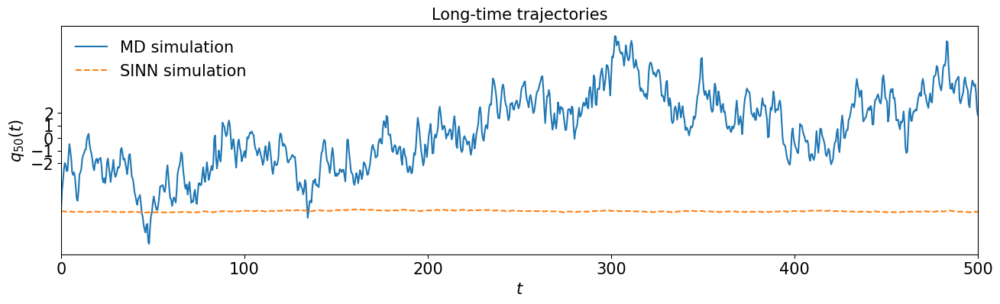

In [40]:
test5(model)

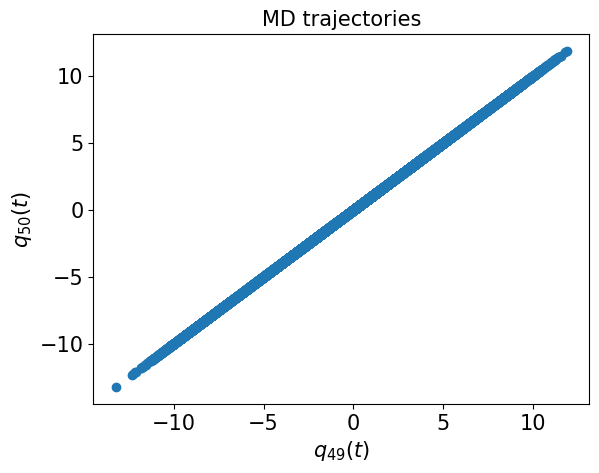

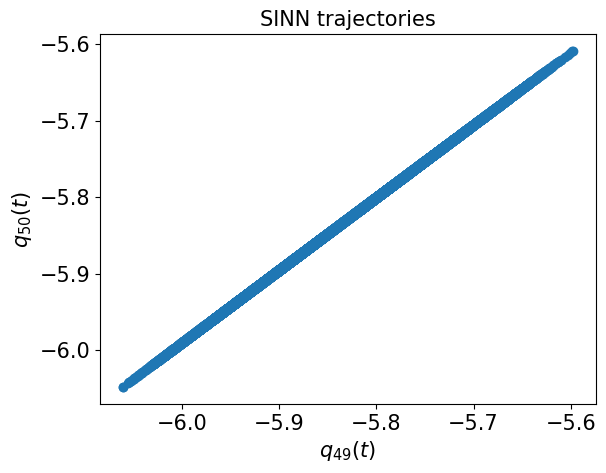

In [41]:
test6(model)

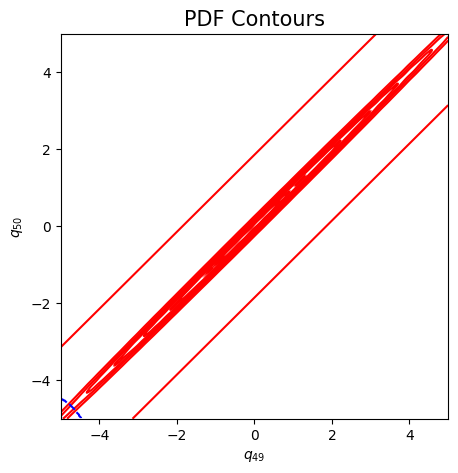

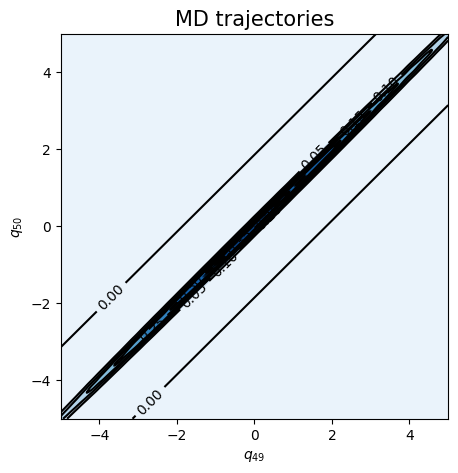

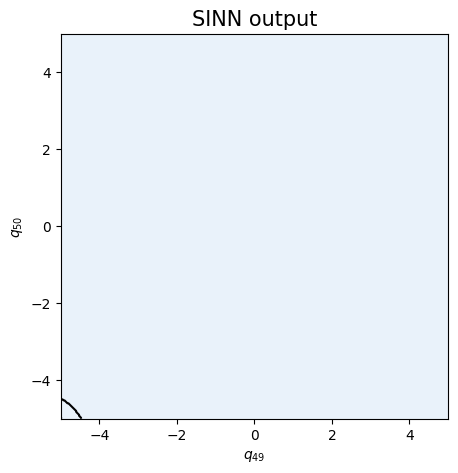

In [42]:
test7(model)

In [43]:
### Defining SINN model
net1 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model1 = Model(net=net1)
model1.train()

[0]-th step loss: 0.8641, 0.8386, acf: 0.10358, ccf: 0.10957, pdf: 0.29222, pdf2: 0.28669, acf2: 0.04655
[50]-th step loss: 0.0969, 0.0996, acf: 0.02642, ccf: 0.02642, pdf: 0.02934, pdf2: 0.01425, acf2: 0.00319
[100]-th step loss: 0.1405, 0.1367, acf: 0.04509, ccf: 0.04509, pdf: 0.01453, pdf2: 0.00755, acf2: 0.02442
[150]-th step loss: 0.0323, 0.0287, acf: 0.00245, ccf: 0.00245, pdf: 0.01491, pdf2: 0.00684, acf2: 0.00204
[200]-th step loss: 0.0560, 0.0559, acf: 0.01288, ccf: 0.01288, pdf: 0.01440, pdf2: 0.00689, acf2: 0.00881
[250]-th step loss: 0.0364, 0.0307, acf: 0.00178, ccf: 0.00178, pdf: 0.01888, pdf2: 0.00751, acf2: 0.00071
[300]-th step loss: 0.0172, 0.0185, acf: 0.00106, ccf: 0.00106, pdf: 0.01134, pdf2: 0.00412, acf2: 0.00094
[350]-th step loss: 0.0188, 0.0205, acf: 0.00526, ccf: 0.00526, pdf: 0.00673, pdf2: 0.00255, acf2: 0.00072
[400]-th step loss: 0.0055, 0.0051, acf: 0.00034, ccf: 0.00034, pdf: 0.00267, pdf2: 0.00110, acf2: 0.00066
[450]-th step loss: 0.0040, 0.0033, acf:

[3850]-th step loss: 0.0255, 0.0255, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01317
[3900]-th step loss: 0.0246, 0.0265, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01435
[3950]-th step loss: 0.0251, 0.0271, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01493
[4000]-th step loss: 0.0234, 0.0300, acf: 0.00014, ccf: 0.00014, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01762
[4050]-th step loss: 0.0258, 0.0277, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01559
[4100]-th step loss: 0.1376, 0.1406, acf: 0.03161, ccf: 0.03161, pdf: 0.00295, pdf2: 0.00950, acf2: 0.06494
[4150]-th step loss: 0.2544, 0.2411, acf: 0.08046, ccf: 0.08046, pdf: 0.00829, pdf2: 0.00768, acf2: 0.06416
[4200]-th step loss: 0.1903, 0.1898, acf: 0.08043, ccf: 0.08043, pdf: 0.00829, pdf2: 0.00381, acf2: 0.01688
[4250]-th step loss: 0.1889, 0.1898, acf: 0.08042, ccf: 0.08042, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01689
[4300]-th step loss: 0.1889,

[7650]-th step loss: 0.0016, 0.0021, acf: 0.00070, ccf: 0.00070, pdf: 0.00018, pdf2: 0.00007, acf2: 0.00040
[7700]-th step loss: 0.0020, 0.0055, acf: 0.00232, ccf: 0.00232, pdf: 0.00012, pdf2: 0.00005, acf2: 0.00067
[7750]-th step loss: 0.0048, 0.0051, acf: 0.00238, ccf: 0.00238, pdf: 0.00007, pdf2: 0.00003, acf2: 0.00021
[7800]-th step loss: 0.0024, 0.0035, acf: 0.00135, ccf: 0.00135, pdf: 0.00019, pdf2: 0.00007, acf2: 0.00051
[7850]-th step loss: 0.0238, 0.0193, acf: 0.00700, ccf: 0.00700, pdf: 0.00166, pdf2: 0.00071, acf2: 0.00295
[7900]-th step loss: 0.0083, 0.0074, acf: 0.00274, ccf: 0.00274, pdf: 0.00046, pdf2: 0.00017, acf2: 0.00128
[7950]-th step loss: 0.0066, 0.0053, acf: 0.00204, ccf: 0.00204, pdf: 0.00030, pdf2: 0.00012, acf2: 0.00082
[8000]-th step loss: 0.0061, 0.0041, acf: 0.00156, ccf: 0.00156, pdf: 0.00021, pdf2: 0.00008, acf2: 0.00069
[8050]-th step loss: 0.0042, 0.0040, acf: 0.00143, ccf: 0.00143, pdf: 0.00012, pdf2: 0.00005, acf2: 0.00099
[8100]-th step loss: 0.0028,

[11450]-th step loss: 0.0098, 0.0095, acf: 0.00252, ccf: 0.00252, pdf: 0.00285, pdf2: 0.00135, acf2: 0.00022
[11500]-th step loss: 0.0083, 0.0094, acf: 0.00275, ccf: 0.00275, pdf: 0.00259, pdf2: 0.00123, acf2: 0.00012
[11550]-th step loss: 0.0080, 0.0088, acf: 0.00272, ccf: 0.00272, pdf: 0.00221, pdf2: 0.00105, acf2: 0.00013
[11600]-th step loss: 0.0051, 0.0077, acf: 0.00228, ccf: 0.00228, pdf: 0.00201, pdf2: 0.00095, acf2: 0.00014
[11650]-th step loss: 0.0159, 0.0131, acf: 0.00554, ccf: 0.00554, pdf: 0.00090, pdf2: 0.00045, acf2: 0.00068
[11700]-th step loss: 0.0796, 0.0955, acf: 0.03880, ccf: 0.03880, pdf: 0.00623, pdf2: 0.00271, acf2: 0.00893
[11750]-th step loss: 0.0419, 0.0376, acf: 0.00542, ccf: 0.00542, pdf: 0.00948, pdf2: 0.01061, acf2: 0.00669
[11800]-th step loss: 0.0236, 0.0217, acf: 0.00189, ccf: 0.00189, pdf: 0.00920, pdf2: 0.00376, acf2: 0.00499
[11850]-th step loss: 0.0182, 0.0189, acf: 0.00193, ccf: 0.00193, pdf: 0.00809, pdf2: 0.00343, acf2: 0.00348
[11900]-th step los

[15250]-th step loss: 0.0036, 0.0038, acf: 0.00015, ccf: 0.00015, pdf: 0.00225, pdf2: 0.00086, acf2: 0.00039
[15300]-th step loss: 0.0033, 0.0039, acf: 0.00034, ccf: 0.00034, pdf: 0.00204, pdf2: 0.00077, acf2: 0.00039
[15350]-th step loss: 0.0030, 0.0053, acf: 0.00087, ccf: 0.00087, pdf: 0.00200, pdf2: 0.00076, acf2: 0.00083
[15400]-th step loss: 0.0031, 0.0028, acf: 0.00015, ccf: 0.00015, pdf: 0.00177, pdf2: 0.00069, acf2: 0.00007
[15450]-th step loss: 0.0032, 0.0041, acf: 0.00028, ccf: 0.00028, pdf: 0.00170, pdf2: 0.00062, acf2: 0.00123
[15500]-th step loss: 0.0023, 0.0024, acf: 0.00017, ccf: 0.00017, pdf: 0.00132, pdf2: 0.00046, acf2: 0.00027
[15550]-th step loss: 0.0028, 0.0033, acf: 0.00015, ccf: 0.00015, pdf: 0.00179, pdf2: 0.00065, acf2: 0.00050
[15600]-th step loss: 0.0022, 0.0027, acf: 0.00012, ccf: 0.00012, pdf: 0.00117, pdf2: 0.00041, acf2: 0.00094
[15650]-th step loss: 0.0020, 0.0026, acf: 0.00015, ccf: 0.00016, pdf: 0.00085, pdf2: 0.00032, acf2: 0.00117
[15700]-th step los

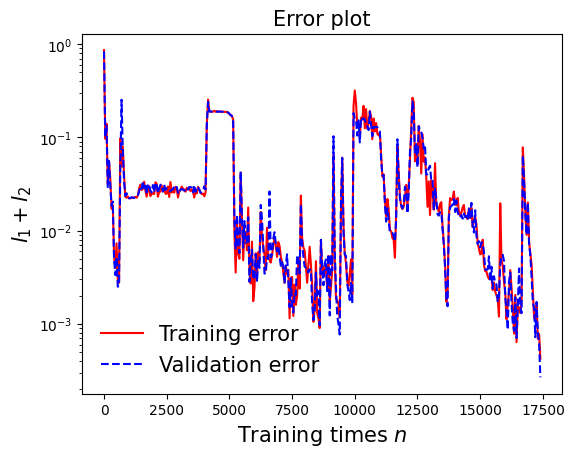

In [44]:
draw_loss(model1)

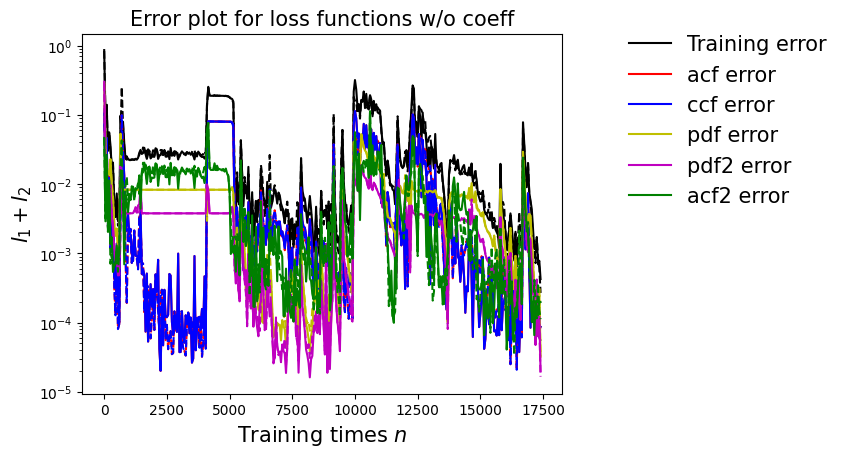

In [45]:
draw_errors(model1)

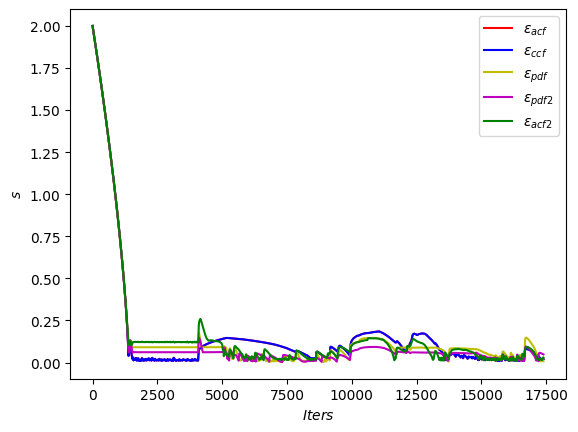

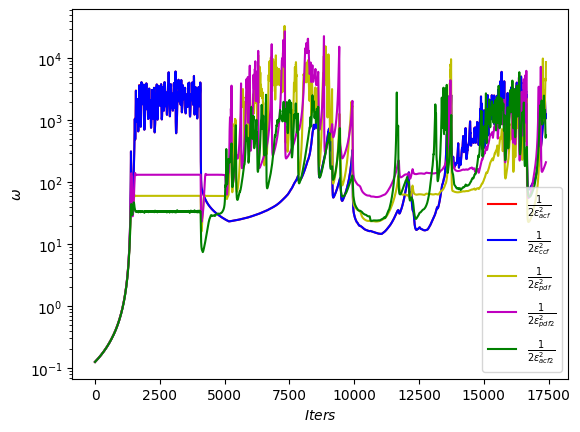

In [46]:
draw_adaptive_w(model1)
draw_epoch_w(model1)

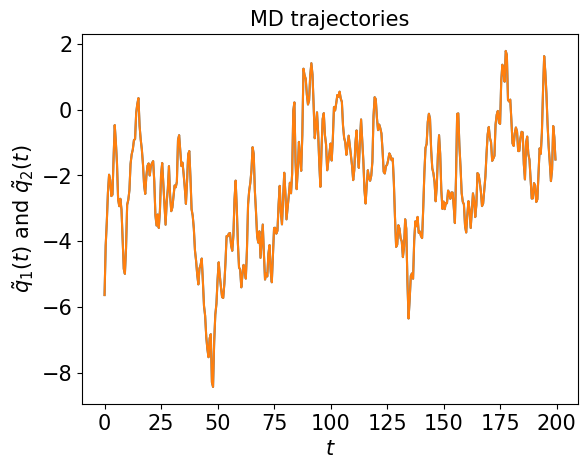

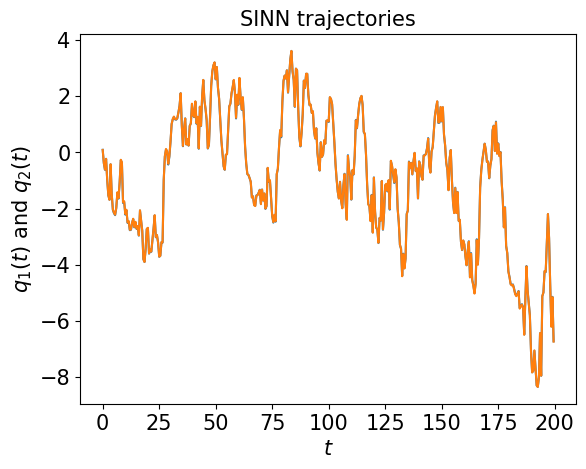

In [47]:
test1(model1)

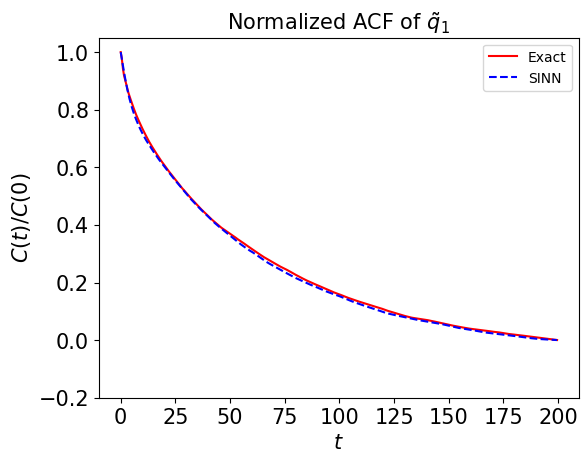

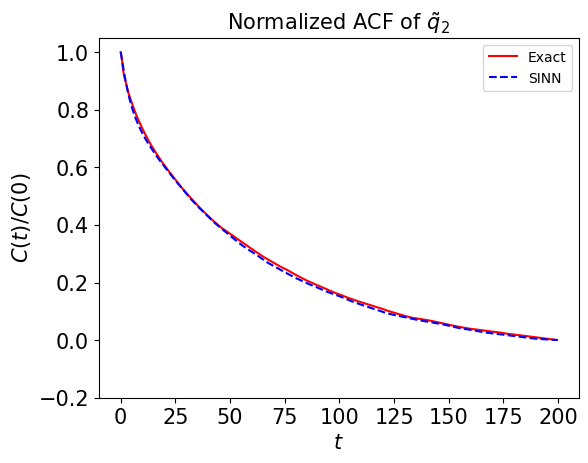

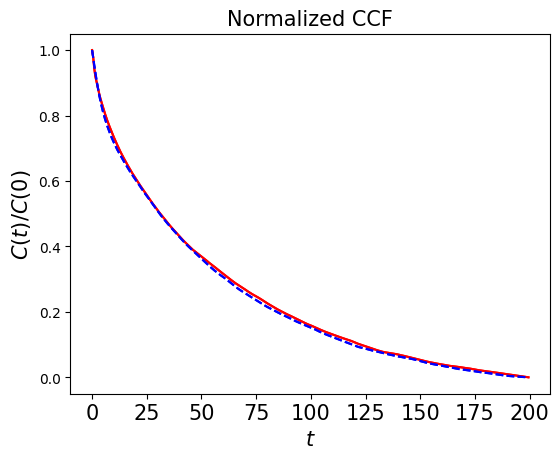

In [48]:
test2(model1)

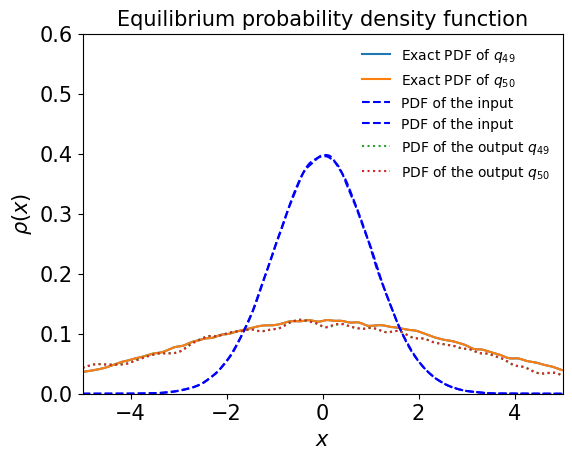

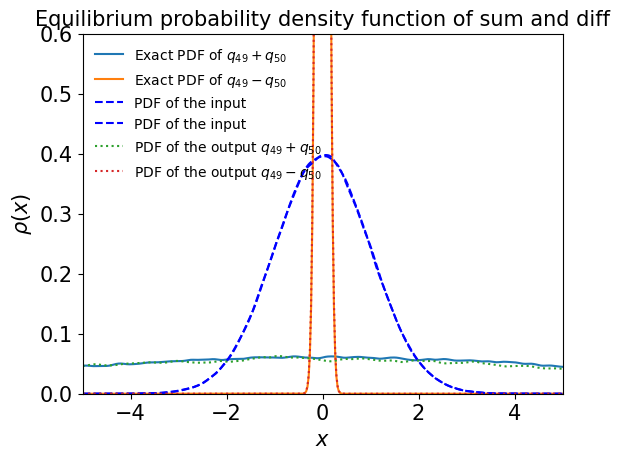

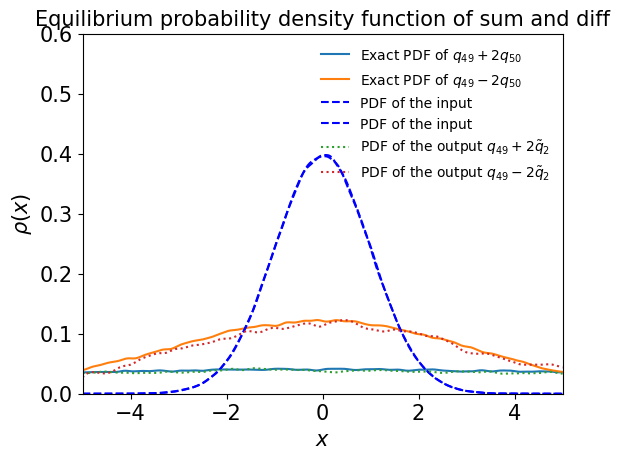

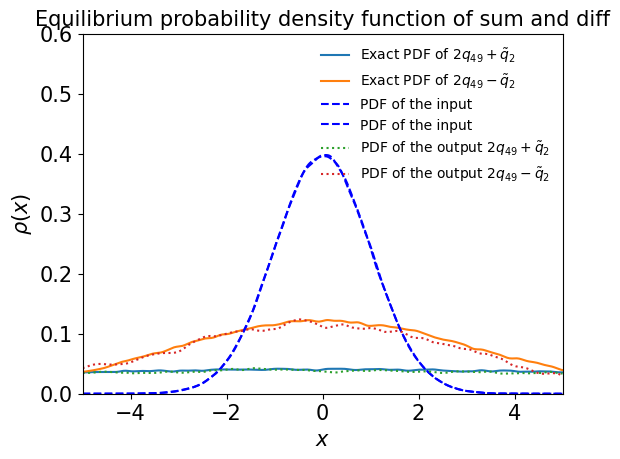

In [49]:
test3(model1)

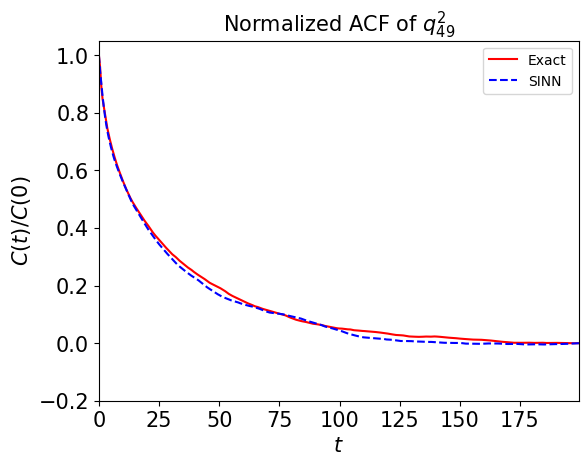

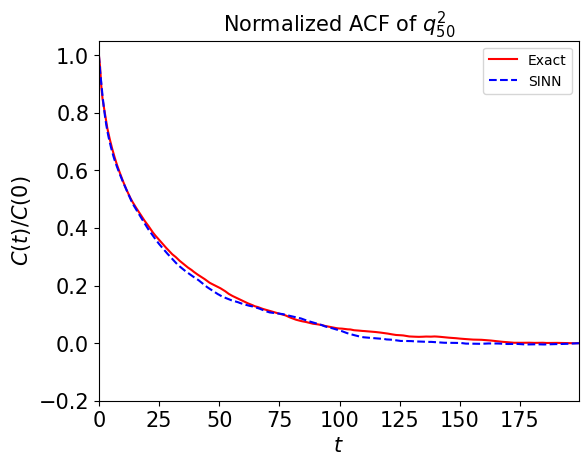

In [50]:
test4(model1)

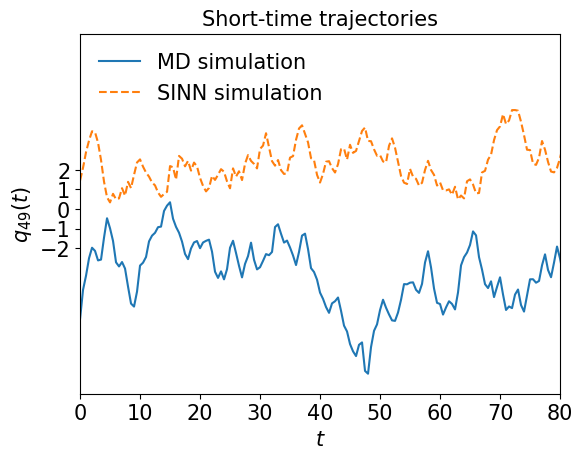

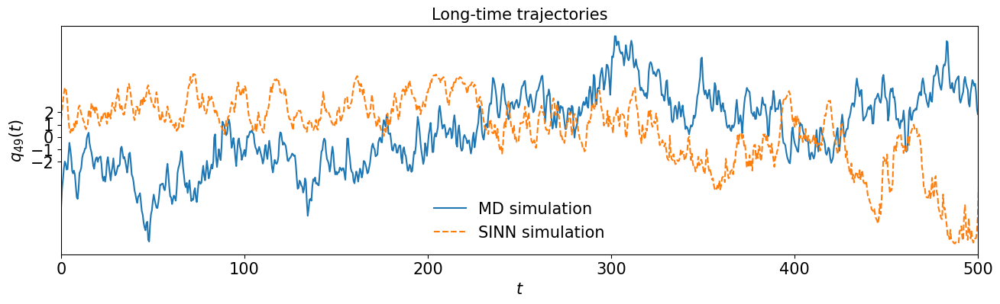

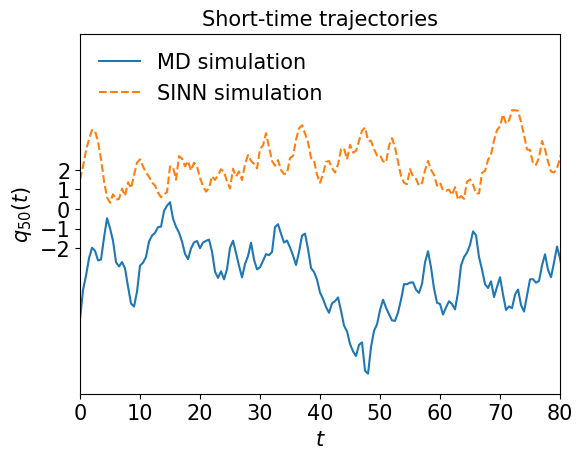

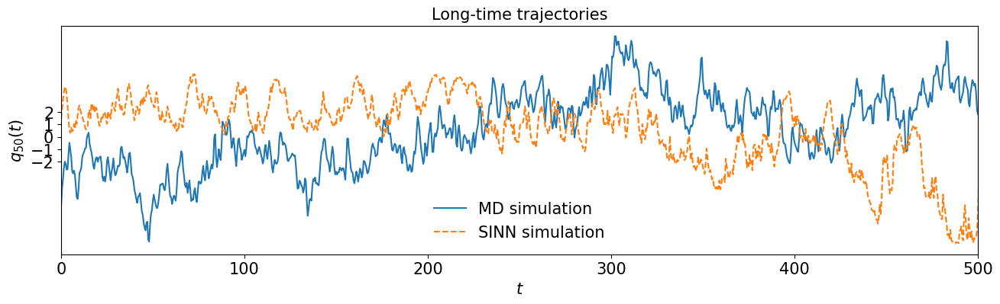

In [51]:
test5(model1)

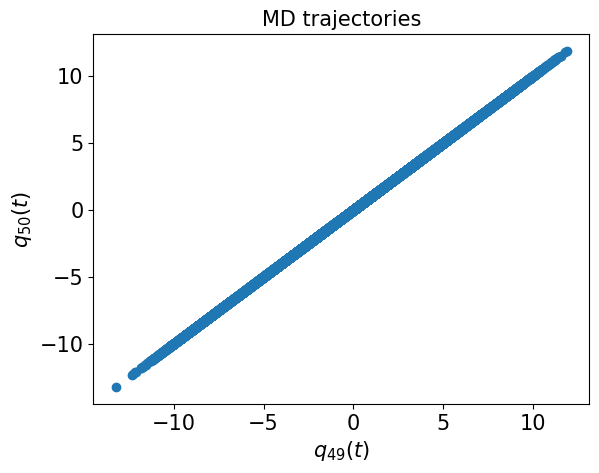

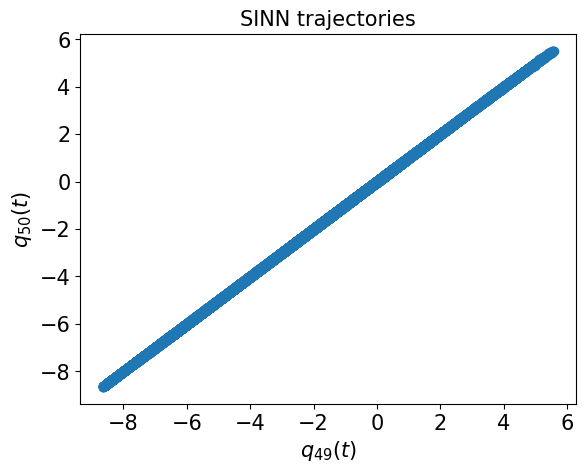

In [52]:
test6(model1)

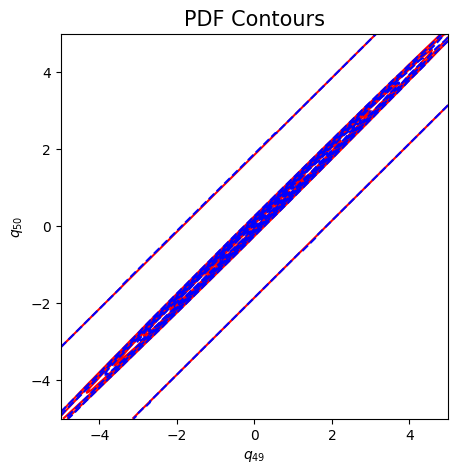

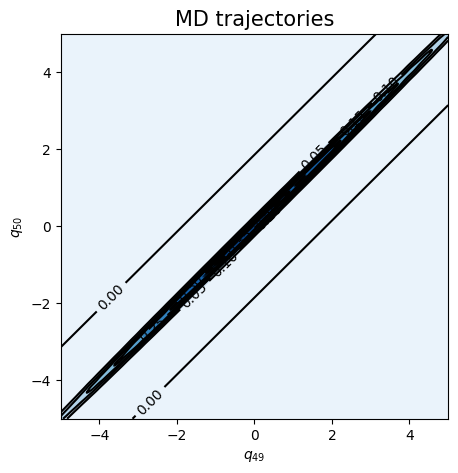

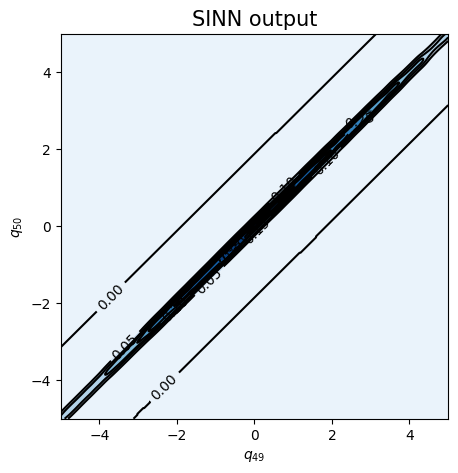

In [53]:
test7(model1)

In [54]:
### Defining SINN model
net2 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model2 = Model(net=net2)
model2.train()

[0]-th step loss: 0.8298, 0.8123, acf: 0.10047, ccf: 0.10063, pdf: 0.29294, pdf2: 0.27427, acf2: 0.04395
[50]-th step loss: 0.0900, 0.0875, acf: 0.01135, ccf: 0.01135, pdf: 0.04057, pdf2: 0.02041, acf2: 0.00385
[100]-th step loss: 0.0308, 0.0241, acf: 0.00108, ccf: 0.00108, pdf: 0.01307, pdf2: 0.00601, acf2: 0.00285
[150]-th step loss: 0.0126, 0.0240, acf: 0.00148, ccf: 0.00148, pdf: 0.01270, pdf2: 0.00479, acf2: 0.00354
[200]-th step loss: 0.0071, 0.0069, acf: 0.00029, ccf: 0.00029, pdf: 0.00387, pdf2: 0.00157, acf2: 0.00092
[250]-th step loss: 0.3521, 0.1074, acf: 0.00225, ccf: 0.00219, pdf: 0.05930, pdf2: 0.02976, acf2: 0.01387
[300]-th step loss: 0.0582, 0.0505, acf: 0.00358, ccf: 0.00358, pdf: 0.02737, pdf2: 0.01130, acf2: 0.00464
[350]-th step loss: 0.0256, 0.0311, acf: 0.00511, ccf: 0.00511, pdf: 0.01421, pdf2: 0.00597, acf2: 0.00069
[400]-th step loss: 0.0146, 0.0145, acf: 0.00040, ccf: 0.00040, pdf: 0.00762, pdf2: 0.00368, acf2: 0.00240
[450]-th step loss: 0.1217, 0.0940, acf:

[3850]-th step loss: 0.0263, 0.0287, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00384, acf2: 0.01646
[3900]-th step loss: 0.0259, 0.0234, acf: 0.00216, ccf: 0.00215, pdf: 0.00829, pdf2: 0.00397, acf2: 0.00688
[3950]-th step loss: 0.0231, 0.0238, acf: 0.00058, ccf: 0.00058, pdf: 0.00829, pdf2: 0.00390, acf2: 0.01041
[4000]-th step loss: 0.0245, 0.0282, acf: 0.00025, ccf: 0.00025, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01558
[4050]-th step loss: 0.0238, 0.0238, acf: 0.00080, ccf: 0.00080, pdf: 0.00829, pdf2: 0.00388, acf2: 0.01005
[4100]-th step loss: 0.0255, 0.0278, acf: 0.00004, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01567
[4150]-th step loss: 0.0249, 0.0237, acf: 0.00037, ccf: 0.00037, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01090
[4200]-th step loss: 0.0254, 0.0271, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01499
[4250]-th step loss: 0.0285, 0.0304, acf: 0.00022, ccf: 0.00022, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01791
[4300]-th step loss: 0.0302,

[7650]-th step loss: 0.0248, 0.0277, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00383, acf2: 0.01548
[7700]-th step loss: 0.0267, 0.0252, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01288
[7750]-th step loss: 0.0277, 0.0288, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01650
[7800]-th step loss: 0.0292, 0.0237, acf: 0.00033, ccf: 0.00033, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01094
[7850]-th step loss: 0.0259, 0.0293, acf: 0.00011, ccf: 0.00011, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01699
[7900]-th step loss: 0.0377, 0.0304, acf: 0.00019, ccf: 0.00019, pdf: 0.00829, pdf2: 0.00397, acf2: 0.01779
[7950]-th step loss: 0.0256, 0.0279, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01569
[8000]-th step loss: 0.0273, 0.0298, acf: 0.00016, ccf: 0.00016, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01736
[8050]-th step loss: 0.0265, 0.0290, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00383, acf2: 0.01665
[8100]-th step loss: 0.0277,

[11450]-th step loss: 0.0267, 0.0267, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00383, acf2: 0.01455
[11500]-th step loss: 0.0275, 0.0271, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01494
[11550]-th step loss: 0.0317, 0.0274, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01520
[11600]-th step loss: 0.0260, 0.0262, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01401
[11650]-th step loss: 0.0265, 0.0268, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01458
[11700]-th step loss: 0.0315, 0.0323, acf: 0.00037, ccf: 0.00037, pdf: 0.00829, pdf2: 0.00381, acf2: 0.01945
[11750]-th step loss: 0.0269, 0.0278, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01560
[11800]-th step loss: 0.0289, 0.0276, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01543
[11850]-th step loss: 0.0300, 0.0268, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00382, acf2: 0.01461
[11900]-th step los

[15250]-th step loss: 0.0273, 0.0280, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01576
[15300]-th step loss: 0.0272, 0.0280, acf: 0.00011, ccf: 0.00011, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01567
[15350]-th step loss: 0.0298, 0.0281, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01589
[15400]-th step loss: 0.0255, 0.0272, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01502
[15450]-th step loss: 0.0266, 0.0279, acf: 0.00008, ccf: 0.00008, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01568
[15500]-th step loss: 0.0243, 0.0257, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01340
[15550]-th step loss: 0.0289, 0.0294, acf: 0.00011, ccf: 0.00011, pdf: 0.00829, pdf2: 0.00381, acf2: 0.01706
[15600]-th step loss: 0.0284, 0.0269, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01475
[15650]-th step loss: 0.0284, 0.0261, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00385, acf2: 0.01382
[15700]-th step los

[19050]-th step loss: 0.0330, 0.0295, acf: 0.00013, ccf: 0.00013, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01714
[19100]-th step loss: 0.0305, 0.0269, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01473
[19150]-th step loss: 0.0254, 0.0259, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01373
[19200]-th step loss: 0.0270, 0.0278, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01569
[19250]-th step loss: 0.0229, 0.0271, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01487
[19300]-th step loss: 0.0272, 0.0268, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01460
[19350]-th step loss: 0.0268, 0.0275, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01533
[19400]-th step loss: 0.0229, 0.0268, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01460
[19450]-th step loss: 0.0242, 0.0260, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01384
[19500]-th step los

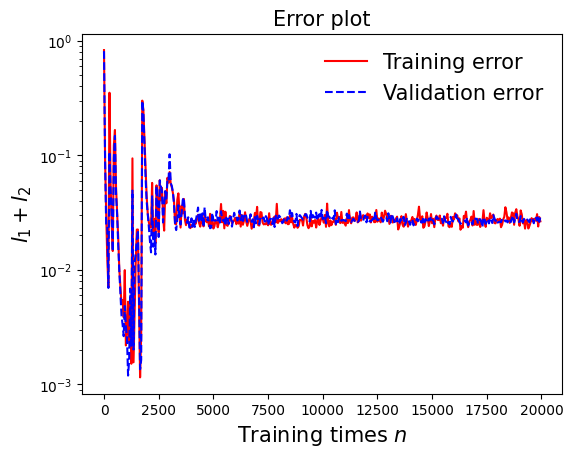

In [55]:
draw_loss(model2)

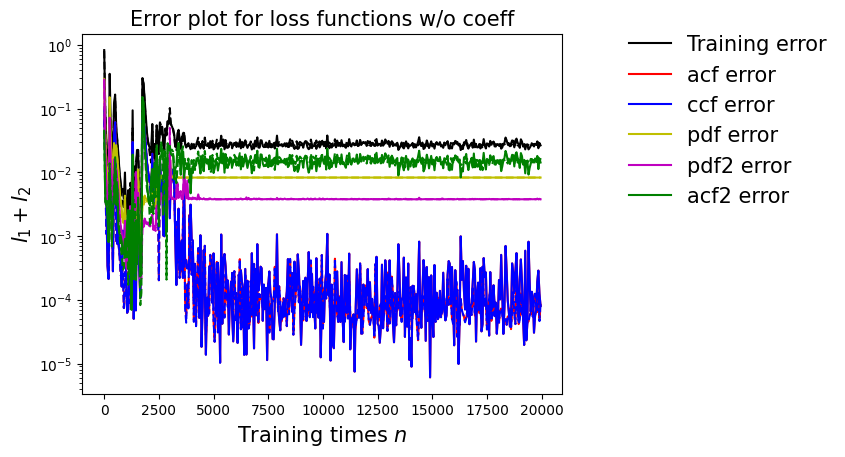

In [56]:
draw_errors(model2)

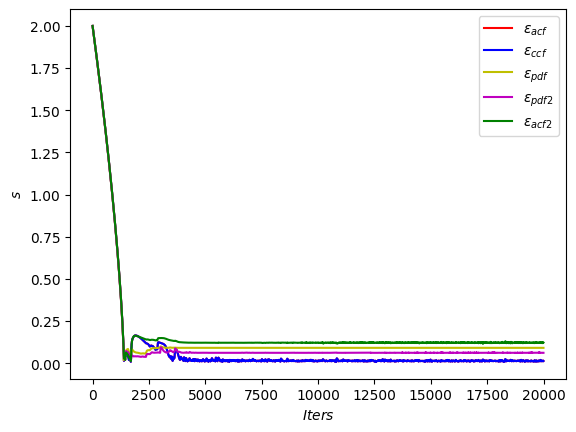

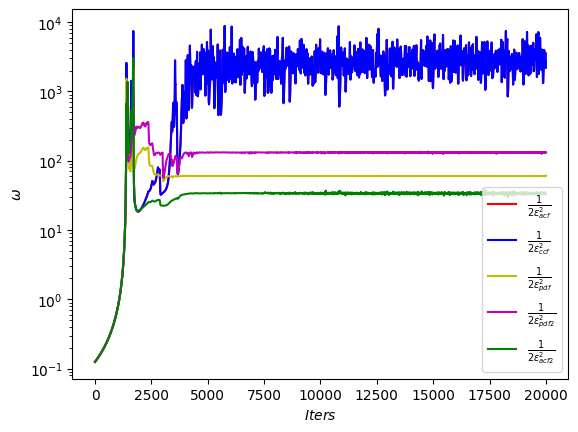

In [57]:
draw_adaptive_w(model2)
draw_epoch_w(model2)

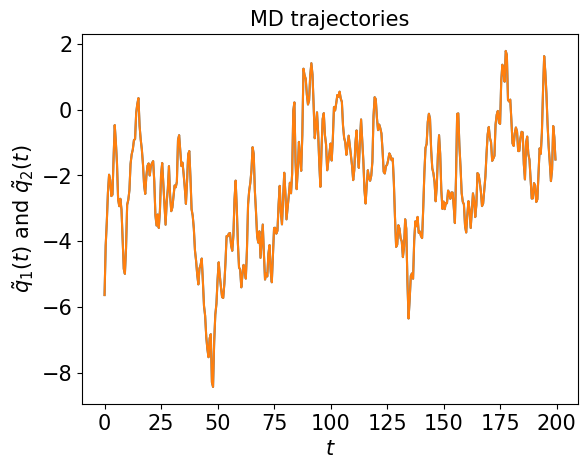

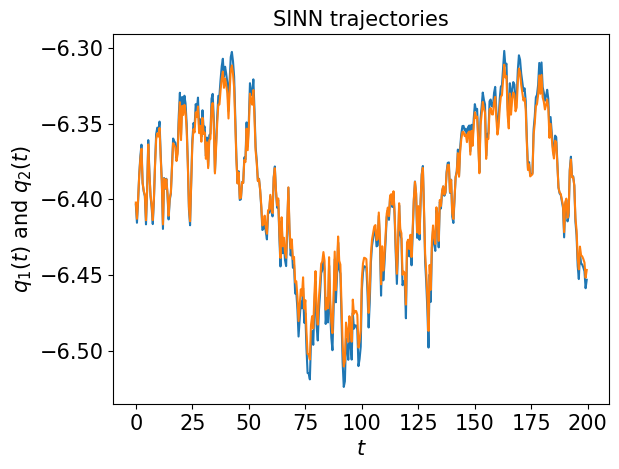

In [58]:
test1(model2)

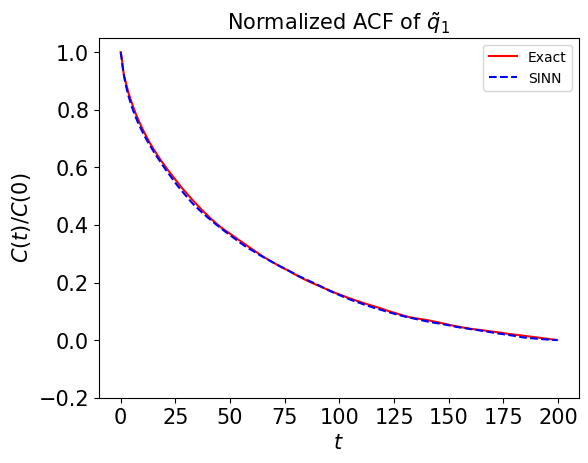

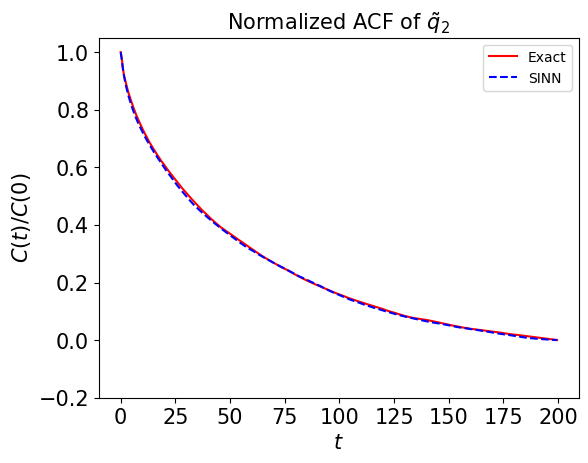

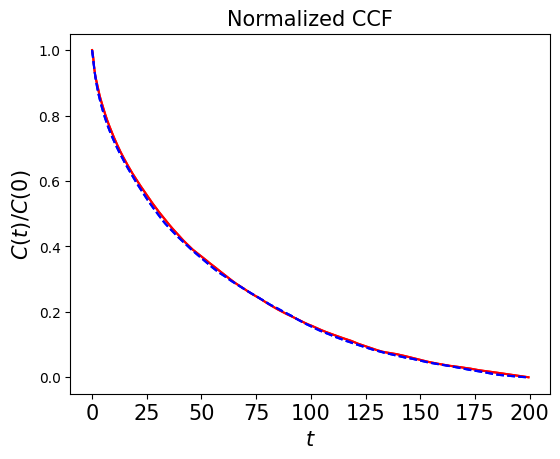

In [59]:
test2(model2)

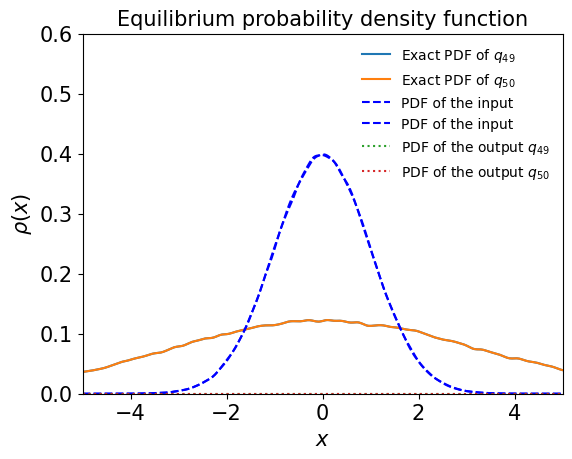

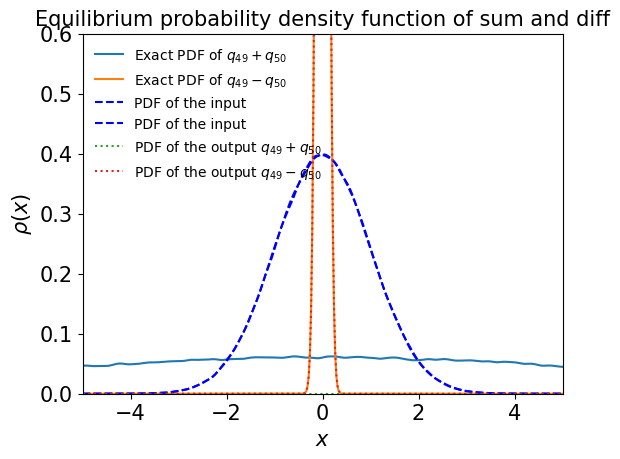

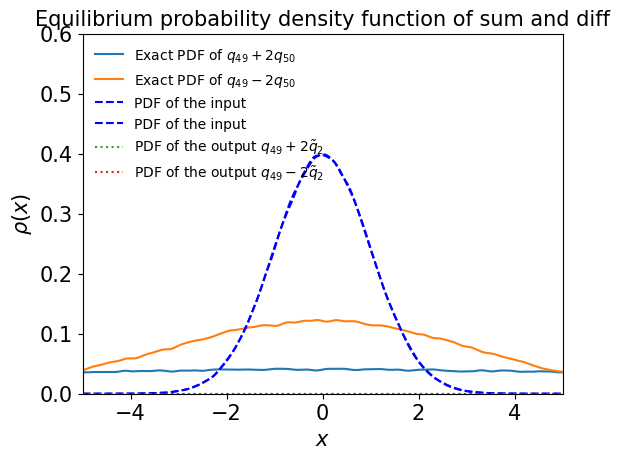

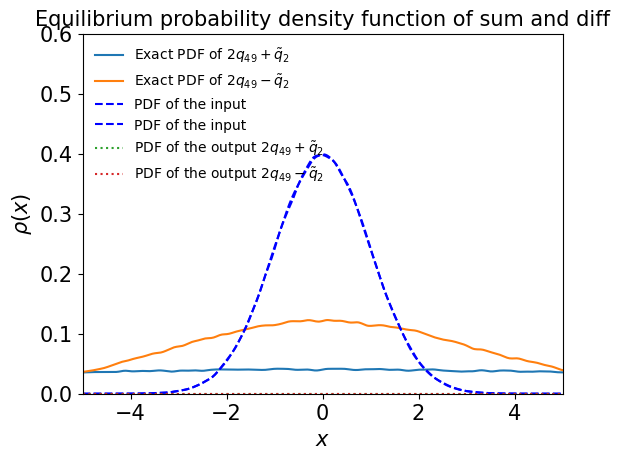

In [60]:
test3(model2)

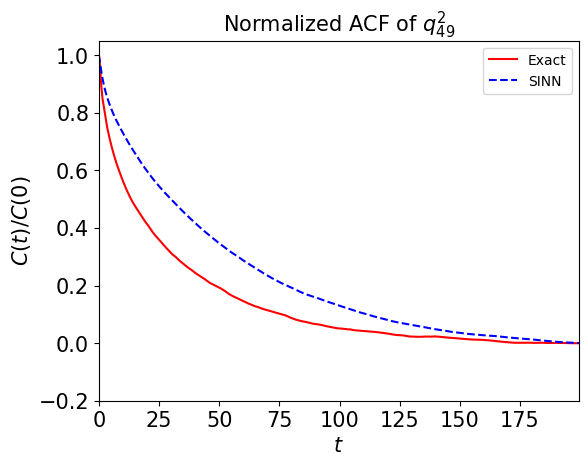

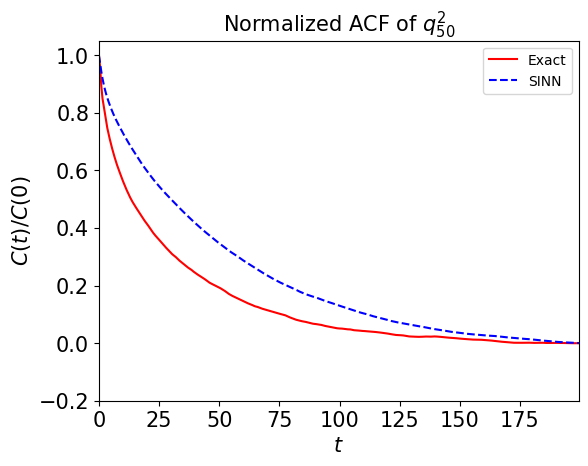

In [61]:
test4(model2)

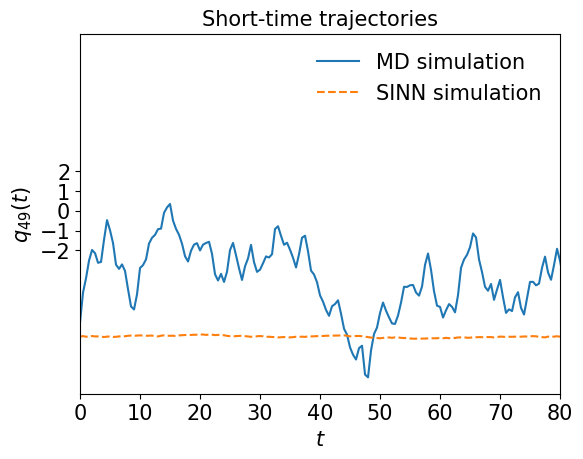

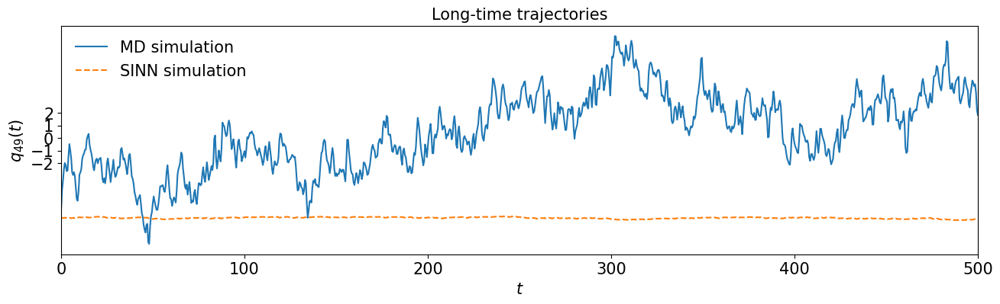

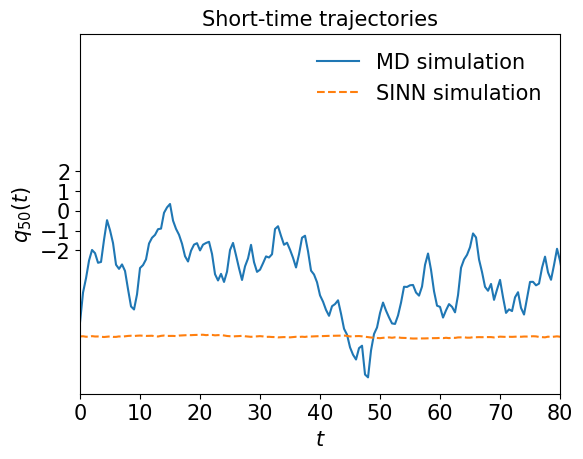

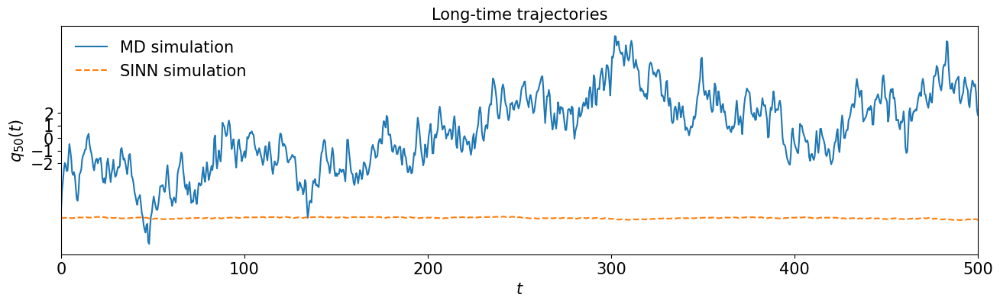

In [62]:
test5(model2)

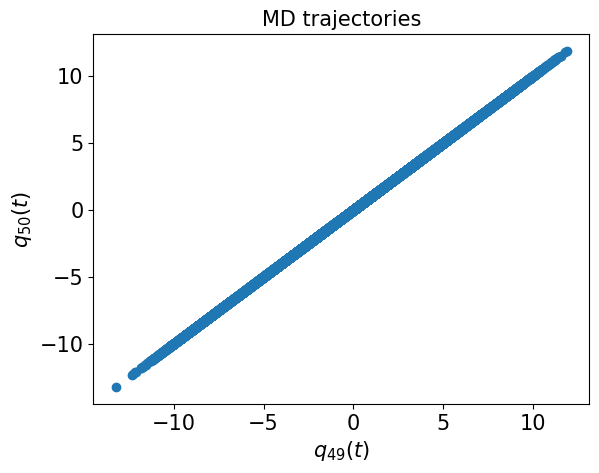

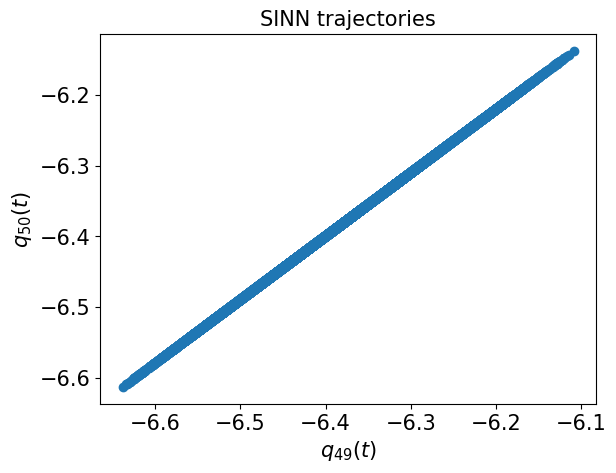

In [63]:
test6(model2)

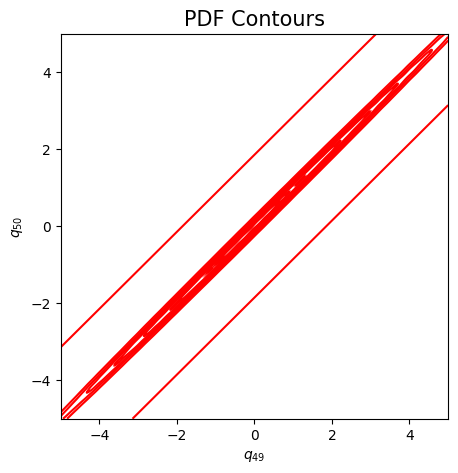

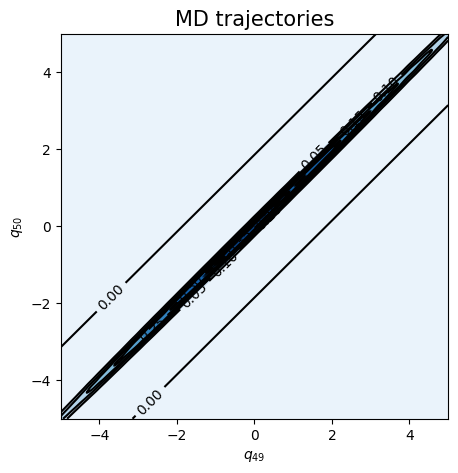

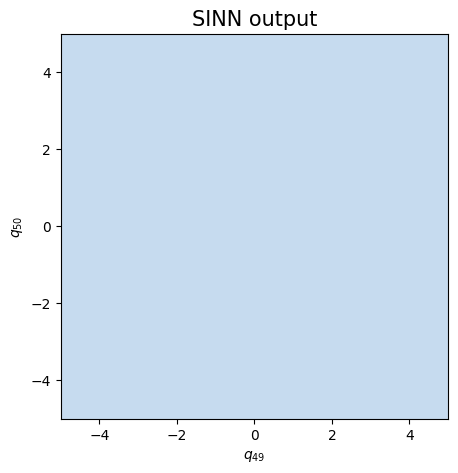

In [64]:
test7(model2)

In [65]:
### Defining SINN model
net3 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model3 = Model(net=net3)
model3.train()

[0]-th step loss: 0.8836, 0.8653, acf: 0.10299, ccf: 0.12912, pdf: 0.29263, pdf2: 0.29459, acf2: 0.04602
[50]-th step loss: 0.1328, 0.1216, acf: 0.01323, ccf: 0.01323, pdf: 0.05116, pdf2: 0.04197, acf2: 0.00204
[100]-th step loss: 0.0341, 0.0346, acf: 0.00184, ccf: 0.00184, pdf: 0.01710, pdf2: 0.00864, acf2: 0.00517
[150]-th step loss: 0.0132, 0.0144, acf: 0.00122, ccf: 0.00122, pdf: 0.00726, pdf2: 0.00322, acf2: 0.00148
[200]-th step loss: 0.0088, 0.0093, acf: 0.00086, ccf: 0.00086, pdf: 0.00468, pdf2: 0.00207, acf2: 0.00079
[250]-th step loss: 0.0064, 0.0085, acf: 0.00100, ccf: 0.00100, pdf: 0.00374, pdf2: 0.00148, acf2: 0.00133
[300]-th step loss: 0.0055, 0.0061, acf: 0.00069, ccf: 0.00069, pdf: 0.00277, pdf2: 0.00112, acf2: 0.00079
[350]-th step loss: 0.0085, 0.0051, acf: 0.00046, ccf: 0.00046, pdf: 0.00219, pdf2: 0.00088, acf2: 0.00113
[400]-th step loss: 0.0574, 0.0230, acf: 0.00513, ccf: 0.00513, pdf: 0.00683, pdf2: 0.00311, acf2: 0.00284
[450]-th step loss: 0.0048, 0.0081, acf:

[3850]-th step loss: 0.0268, 0.0269, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01473
[3900]-th step loss: 0.0245, 0.0277, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01546
[3950]-th step loss: 0.0261, 0.0284, acf: 0.00013, ccf: 0.00013, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01608
[4000]-th step loss: 0.0244, 0.0258, acf: 0.00012, ccf: 0.00012, pdf: 0.00829, pdf2: 0.00381, acf2: 0.01351
[4050]-th step loss: 0.0265, 0.0266, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01439
[4100]-th step loss: 0.0283, 0.0354, acf: 0.00072, ccf: 0.00072, pdf: 0.00829, pdf2: 0.00379, acf2: 0.02183
[4150]-th step loss: 0.0285, 0.0317, acf: 0.00032, ccf: 0.00032, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01898
[4200]-th step loss: 0.0278, 0.0295, acf: 0.00016, ccf: 0.00016, pdf: 0.00829, pdf2: 0.00390, acf2: 0.01702
[4250]-th step loss: 0.0276, 0.0276, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01537
[4300]-th step loss: 0.0298,

[7650]-th step loss: 0.0241, 0.0277, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01551
[7700]-th step loss: 0.0233, 0.0315, acf: 0.00028, ccf: 0.00028, pdf: 0.00829, pdf2: 0.00383, acf2: 0.01884
[7750]-th step loss: 0.0317, 0.0311, acf: 0.00024, ccf: 0.00024, pdf: 0.00829, pdf2: 0.00382, acf2: 0.01849
[7800]-th step loss: 0.0260, 0.0295, acf: 0.00016, ccf: 0.00016, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01713
[7850]-th step loss: 0.0267, 0.0326, acf: 0.00037, ccf: 0.00037, pdf: 0.00829, pdf2: 0.00382, acf2: 0.01971
[7900]-th step loss: 0.0280, 0.0257, acf: 0.00022, ccf: 0.00022, pdf: 0.00829, pdf2: 0.00381, acf2: 0.01314
[7950]-th step loss: 0.0282, 0.0292, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01691
[8000]-th step loss: 0.0337, 0.0312, acf: 0.00025, ccf: 0.00025, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01861
[8050]-th step loss: 0.0290, 0.0292, acf: 0.00012, ccf: 0.00012, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01694
[8100]-th step loss: 0.0245,

[11450]-th step loss: 0.0258, 0.0303, acf: 0.00022, ccf: 0.00022, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01779
[11500]-th step loss: 0.0279, 0.0300, acf: 0.00017, ccf: 0.00017, pdf: 0.00829, pdf2: 0.00382, acf2: 0.01752
[11550]-th step loss: 0.0292, 0.0278, acf: 0.00008, ccf: 0.00008, pdf: 0.00829, pdf2: 0.00381, acf2: 0.01556
[11600]-th step loss: 0.0290, 0.0308, acf: 0.00023, ccf: 0.00023, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01824
[11650]-th step loss: 0.0269, 0.0313, acf: 0.00026, ccf: 0.00026, pdf: 0.00829, pdf2: 0.00384, acf2: 0.01862
[11700]-th step loss: 0.0368, 0.0322, acf: 0.00034, ccf: 0.00034, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01939
[11750]-th step loss: 0.0241, 0.0277, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00385, acf2: 0.01546
[11800]-th step loss: 0.0246, 0.0281, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01592
[11850]-th step loss: 0.0292, 0.0298, acf: 0.00017, ccf: 0.00017, pdf: 0.00829, pdf2: 0.00382, acf2: 0.01741
[11900]-th step los

[15250]-th step loss: 0.0384, 0.0339, acf: 0.00054, ccf: 0.00054, pdf: 0.00829, pdf2: 0.00380, acf2: 0.02075
[15300]-th step loss: 0.0276, 0.0311, acf: 0.00023, ccf: 0.00023, pdf: 0.00829, pdf2: 0.00381, acf2: 0.01852
[15350]-th step loss: 0.0361, 0.0300, acf: 0.00014, ccf: 0.00014, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01763
[15400]-th step loss: 0.0262, 0.0281, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00381, acf2: 0.01580
[15450]-th step loss: 0.0275, 0.0296, acf: 0.00015, ccf: 0.00015, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01725
[15500]-th step loss: 0.0261, 0.0277, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00382, acf2: 0.01554
[15550]-th step loss: 0.0243, 0.0286, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01638
[15600]-th step loss: 0.0236, 0.0306, acf: 0.00022, ccf: 0.00022, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01813
[15650]-th step loss: 0.0322, 0.0285, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01628
[15700]-th step los

[19050]-th step loss: 0.0247, 0.0298, acf: 0.00014, ccf: 0.00014, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01746
[19100]-th step loss: 0.0269, 0.0292, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01691
[19150]-th step loss: 0.0304, 0.0285, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01623
[19200]-th step loss: 0.0294, 0.0297, acf: 0.00013, ccf: 0.00013, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01741
[19250]-th step loss: 0.0262, 0.0284, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01617
[19300]-th step loss: 0.0270, 0.0287, acf: 0.00008, ccf: 0.00008, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01647
[19350]-th step loss: 0.0266, 0.0283, acf: 0.00008, ccf: 0.00008, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01602
[19400]-th step loss: 0.0224, 0.0299, acf: 0.00013, ccf: 0.00013, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01758
[19450]-th step loss: 0.0277, 0.0277, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01553
[19500]-th step los

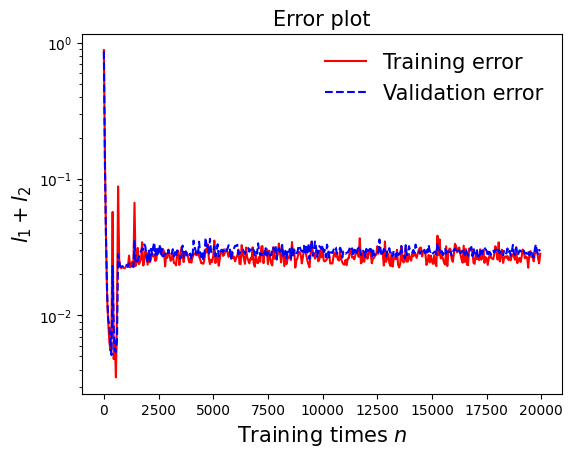

In [66]:
draw_loss(model3)

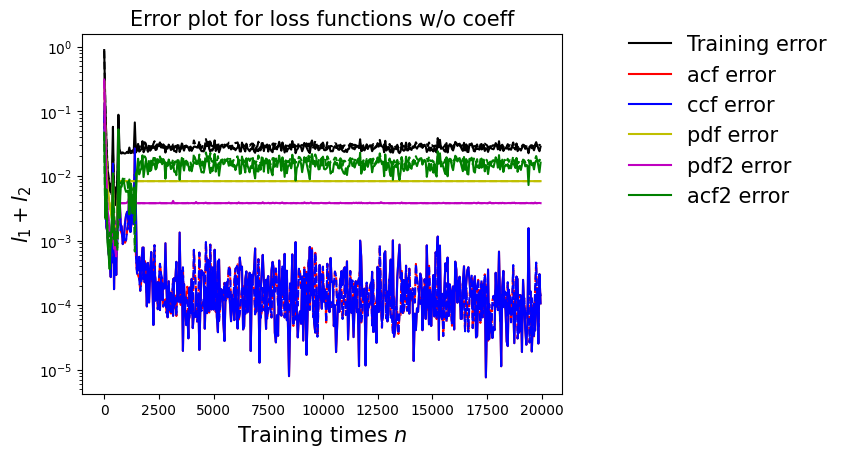

In [67]:
draw_errors(model3)

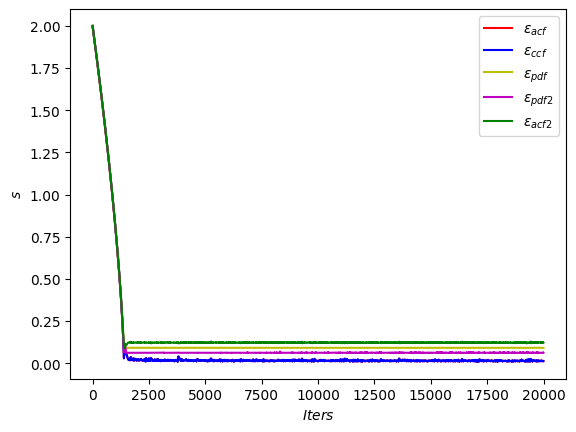

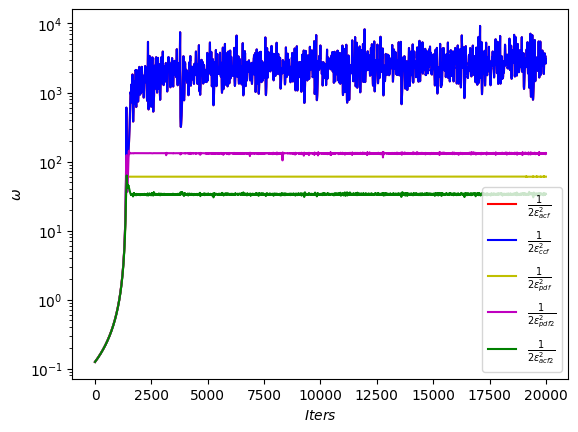

In [68]:
draw_adaptive_w(model3)
draw_epoch_w(model3)

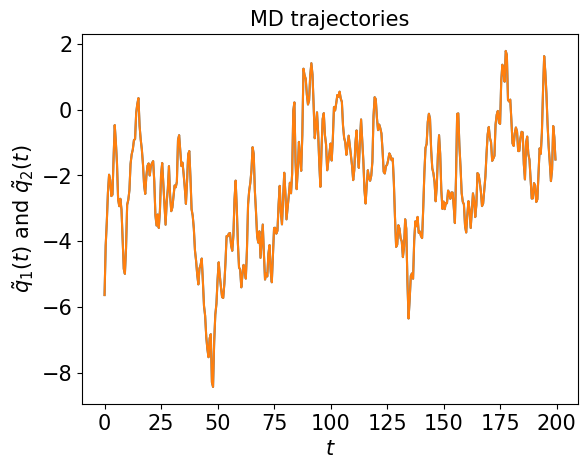

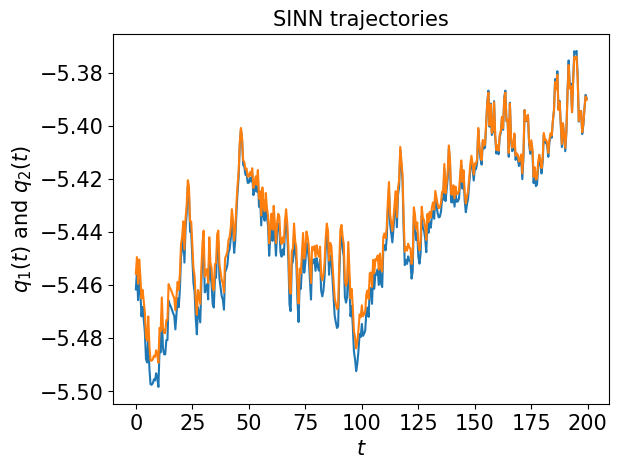

In [69]:
test1(model3)

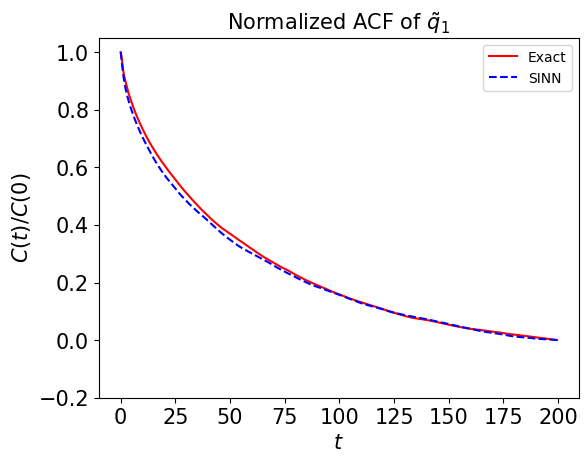

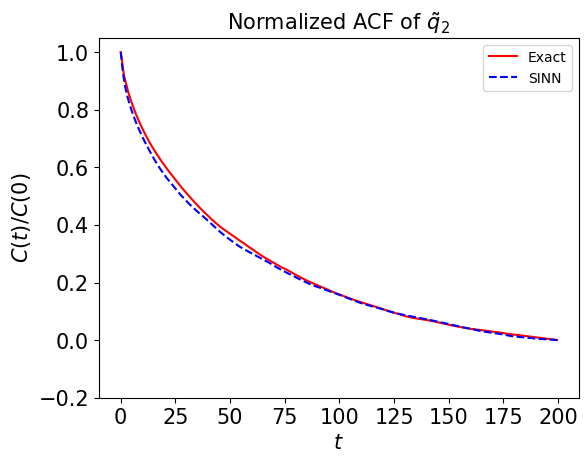

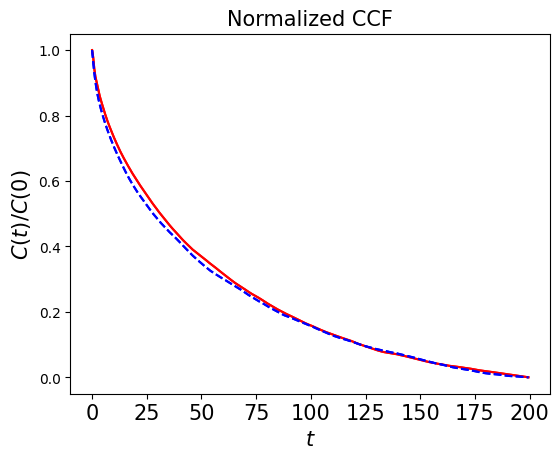

In [70]:
test2(model3)

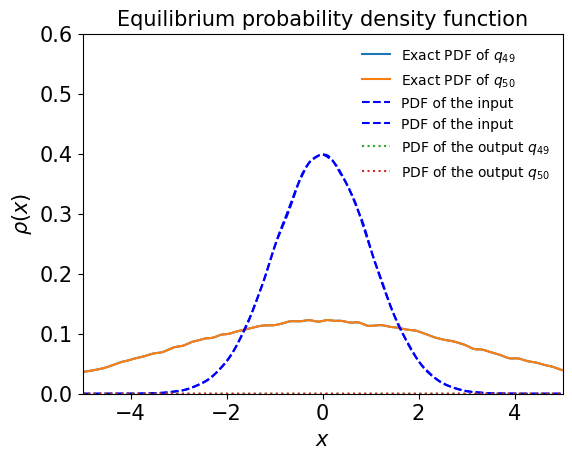

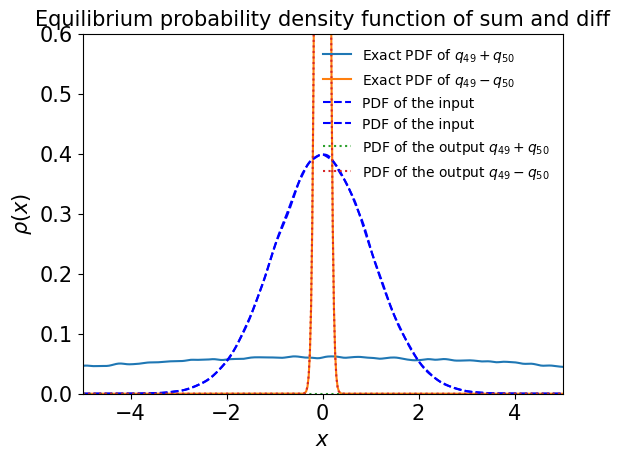

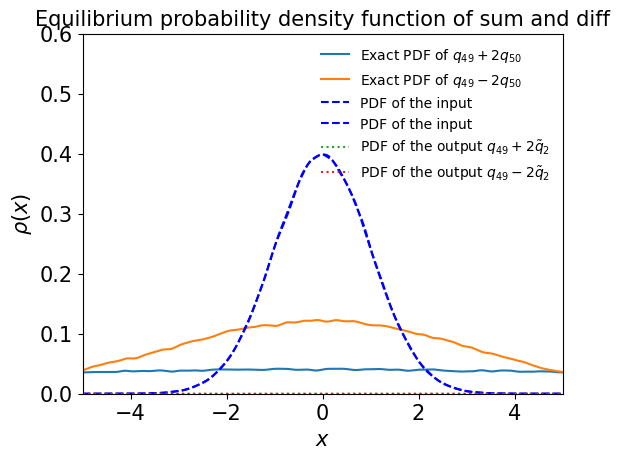

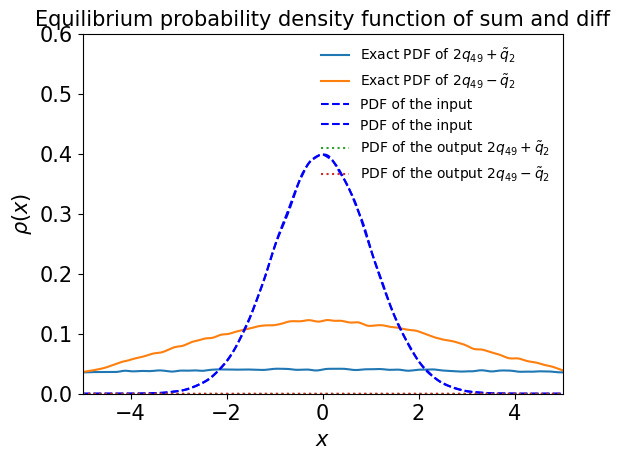

In [71]:
test3(model3)

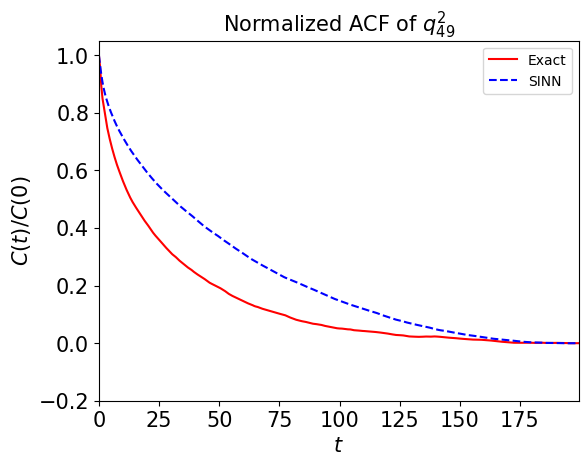

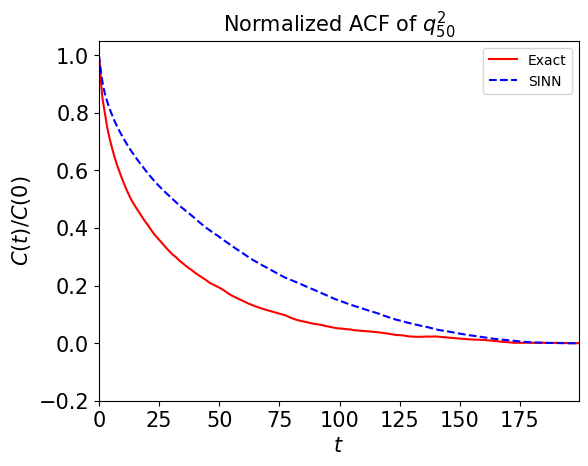

In [72]:
test4(model3)

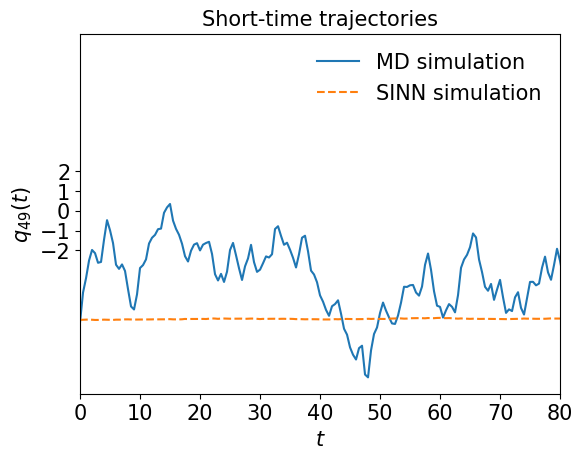

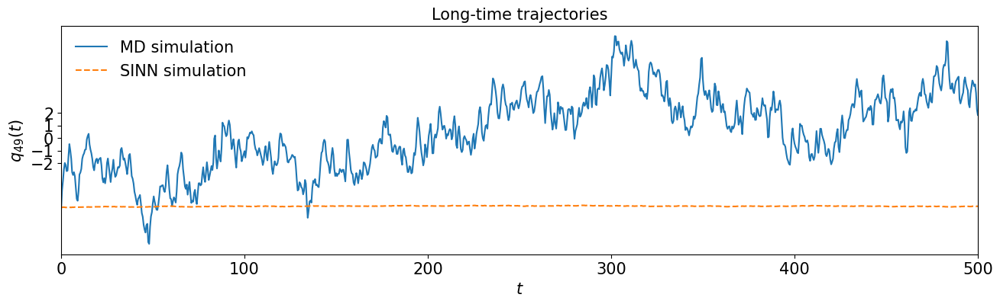

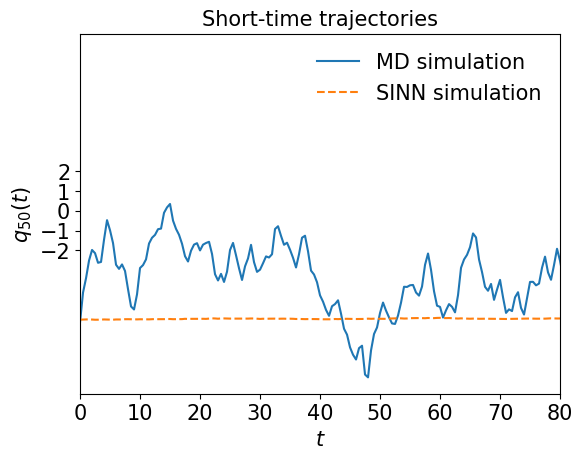

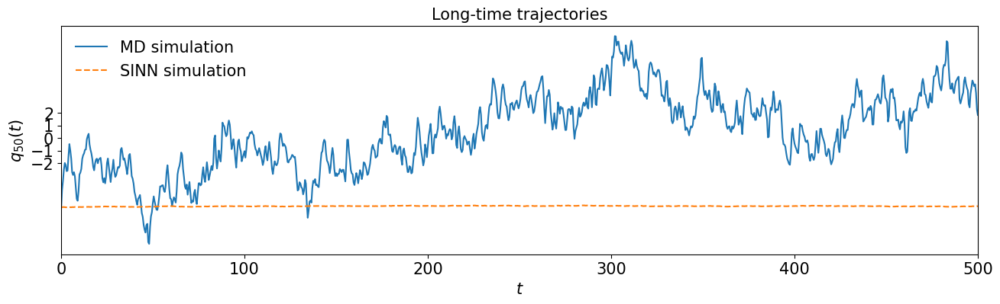

In [73]:
test5(model3)

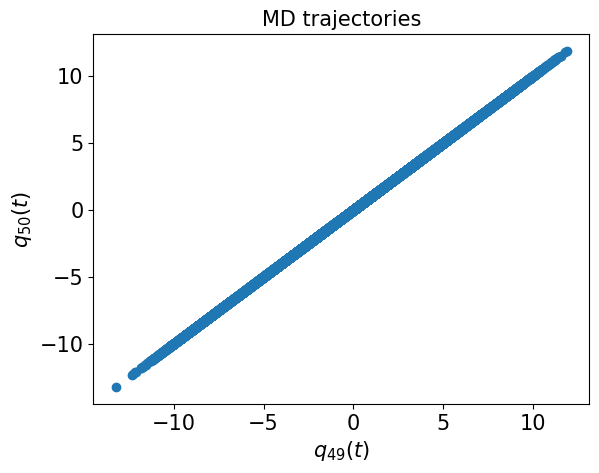

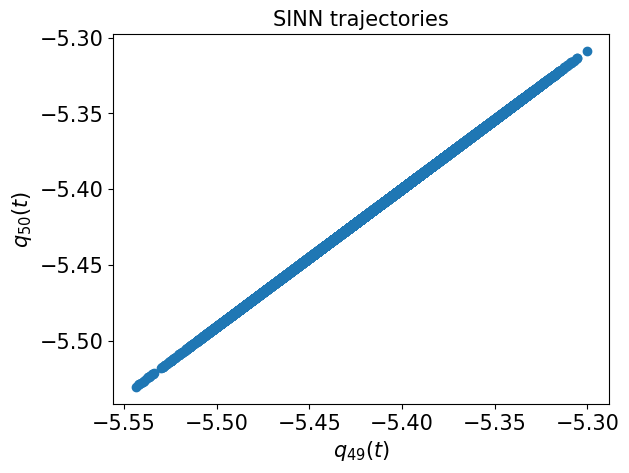

In [74]:
test6(model3)

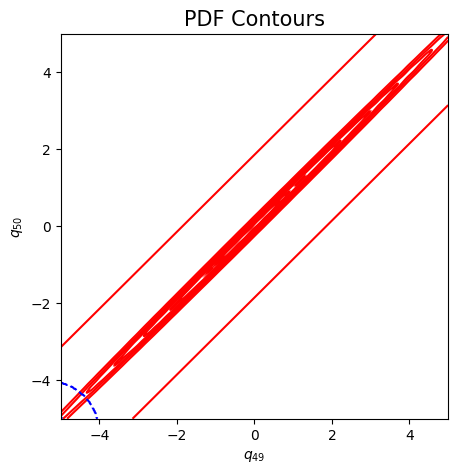

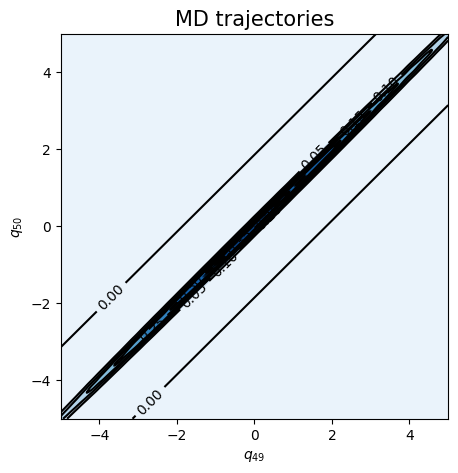

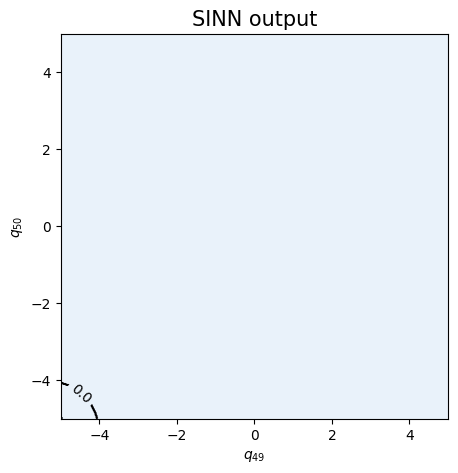

In [75]:
test7(model3)

In [76]:
### Defining SINN model
net4 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model4 = Model(net=net4)
model4.train()

[0]-th step loss: 0.8770, 0.8516, acf: 0.10177, ccf: 0.10254, pdf: 0.29292, pdf2: 0.30935, acf2: 0.04502
[50]-th step loss: 0.1328, 0.1341, acf: 0.03120, ccf: 0.03120, pdf: 0.04043, pdf2: 0.02665, acf2: 0.00461
[100]-th step loss: 0.0233, 0.0220, acf: 0.00137, ccf: 0.00137, pdf: 0.01227, pdf2: 0.00572, acf2: 0.00127
[150]-th step loss: 0.0130, 0.0176, acf: 0.00235, ccf: 0.00235, pdf: 0.00775, pdf2: 0.00360, acf2: 0.00149
[200]-th step loss: 0.0075, 0.0072, acf: 0.00058, ccf: 0.00058, pdf: 0.00382, pdf2: 0.00162, acf2: 0.00057
[250]-th step loss: 0.0052, 0.0058, acf: 0.00050, ccf: 0.00050, pdf: 0.00290, pdf2: 0.00118, acf2: 0.00071
[300]-th step loss: 0.0058, 0.0060, acf: 0.00014, ccf: 0.00014, pdf: 0.00339, pdf2: 0.00154, acf2: 0.00076
[350]-th step loss: 0.0045, 0.0084, acf: 0.00070, ccf: 0.00070, pdf: 0.00365, pdf2: 0.00127, acf2: 0.00204
[400]-th step loss: 0.0069, 0.0040, acf: 0.00039, ccf: 0.00039, pdf: 0.00189, pdf2: 0.00078, acf2: 0.00052
[450]-th step loss: 0.0036, 0.0039, acf:

[3850]-th step loss: 0.0272, 0.0238, acf: 0.00041, ccf: 0.00041, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01092
[3900]-th step loss: 0.0255, 0.0234, acf: 0.00047, ccf: 0.00047, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01039
[3950]-th step loss: 0.0332, 0.0339, acf: 0.00735, ccf: 0.00735, pdf: 0.00856, pdf2: 0.00387, acf2: 0.00680
[4000]-th step loss: 0.0239, 0.0373, acf: 0.00146, ccf: 0.00146, pdf: 0.00821, pdf2: 0.00378, acf2: 0.02234
[4050]-th step loss: 0.0229, 0.0248, acf: 0.00073, ccf: 0.00073, pdf: 0.00822, pdf2: 0.00382, acf2: 0.01134
[4100]-th step loss: 0.0277, 0.0269, acf: 0.00045, ccf: 0.00045, pdf: 0.00821, pdf2: 0.00378, acf2: 0.01397
[4150]-th step loss: 0.0238, 0.0233, acf: 0.00046, ccf: 0.00046, pdf: 0.00825, pdf2: 0.00399, acf2: 0.01015
[4200]-th step loss: 0.0262, 0.0261, acf: 0.00013, ccf: 0.00013, pdf: 0.00826, pdf2: 0.00392, acf2: 0.01364
[4250]-th step loss: 0.0223, 0.0233, acf: 0.00024, ccf: 0.00024, pdf: 0.00825, pdf2: 0.00392, acf2: 0.01068
[4300]-th step loss: 0.0240,

[7650]-th step loss: 0.1130, 0.1132, acf: 0.05238, ccf: 0.05238, pdf: 0.00550, pdf2: 0.00264, acf2: 0.00029
[7700]-th step loss: 0.0917, 0.0891, acf: 0.04169, ccf: 0.04169, pdf: 0.00380, pdf2: 0.00181, acf2: 0.00011
[7750]-th step loss: 0.0727, 0.0669, acf: 0.03121, ccf: 0.03121, pdf: 0.00295, pdf2: 0.00135, acf2: 0.00020
[7800]-th step loss: 0.0099, 0.0139, acf: 0.00633, ccf: 0.00633, pdf: 0.00074, pdf2: 0.00040, acf2: 0.00009
[7850]-th step loss: 0.0203, 0.0219, acf: 0.01058, ccf: 0.01058, pdf: 0.00013, pdf2: 0.00008, acf2: 0.00057
[7900]-th step loss: 0.0288, 0.0209, acf: 0.00838, ccf: 0.00838, pdf: 0.00005, pdf2: 0.00342, acf2: 0.00067
[7950]-th step loss: 0.0211, 0.0207, acf: 0.01004, ccf: 0.01004, pdf: 0.00006, pdf2: 0.00006, acf2: 0.00053
[8000]-th step loss: 0.0172, 0.0128, acf: 0.00626, ccf: 0.00626, pdf: 0.00005, pdf2: 0.00003, acf2: 0.00015
[8050]-th step loss: 0.0218, 0.0248, acf: 0.01109, ccf: 0.01109, pdf: 0.00163, pdf2: 0.00072, acf2: 0.00024
[8100]-th step loss: 0.0231,

[11450]-th step loss: 0.0043, 0.0042, acf: 0.00020, ccf: 0.00020, pdf: 0.00231, pdf2: 0.00093, acf2: 0.00056
[11500]-th step loss: 0.0026, 0.0029, acf: 0.00041, ccf: 0.00041, pdf: 0.00117, pdf2: 0.00042, acf2: 0.00045
[11550]-th step loss: 0.0207, 0.0254, acf: 0.00228, ccf: 0.00228, pdf: 0.00744, pdf2: 0.00338, acf2: 0.01003
[11600]-th step loss: 0.0128, 0.0134, acf: 0.00062, ccf: 0.00062, pdf: 0.00512, pdf2: 0.00222, acf2: 0.00479
[11650]-th step loss: 0.0094, 0.0099, acf: 0.00045, ccf: 0.00045, pdf: 0.00392, pdf2: 0.00166, acf2: 0.00342
[11700]-th step loss: 0.0093, 0.0090, acf: 0.00030, ccf: 0.00030, pdf: 0.00362, pdf2: 0.00148, acf2: 0.00333
[11750]-th step loss: 0.0079, 0.0103, acf: 0.00119, ccf: 0.00119, pdf: 0.00369, pdf2: 0.00162, acf2: 0.00260
[11800]-th step loss: 0.0068, 0.0099, acf: 0.00027, ccf: 0.00027, pdf: 0.00375, pdf2: 0.00148, acf2: 0.00409
[11850]-th step loss: 0.0052, 0.0058, acf: 0.00034, ccf: 0.00034, pdf: 0.00267, pdf2: 0.00112, acf2: 0.00136
[11900]-th step los

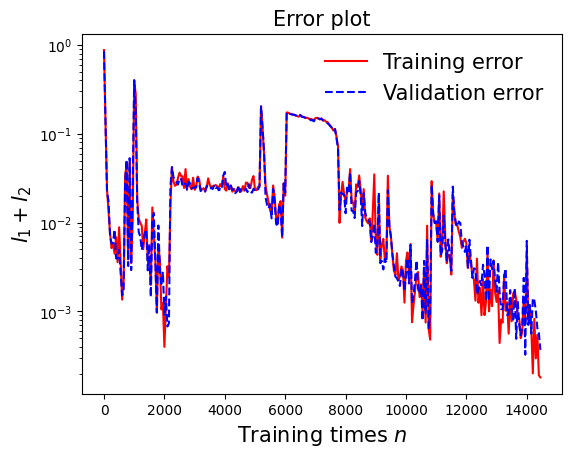

In [77]:
draw_loss(model4)

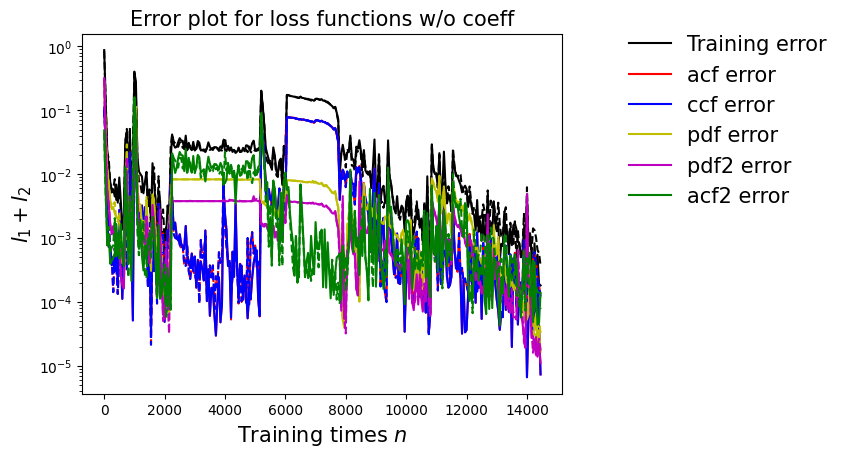

In [78]:
draw_errors(model4)

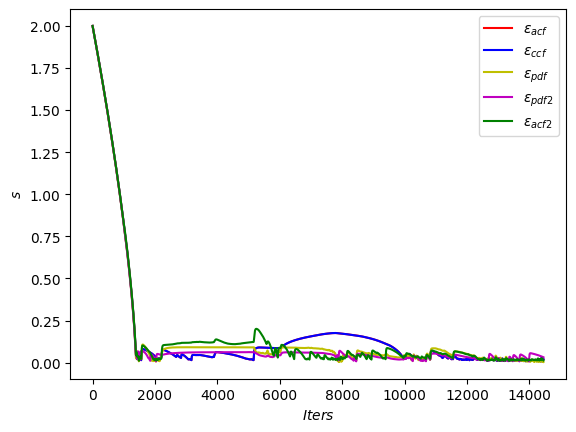

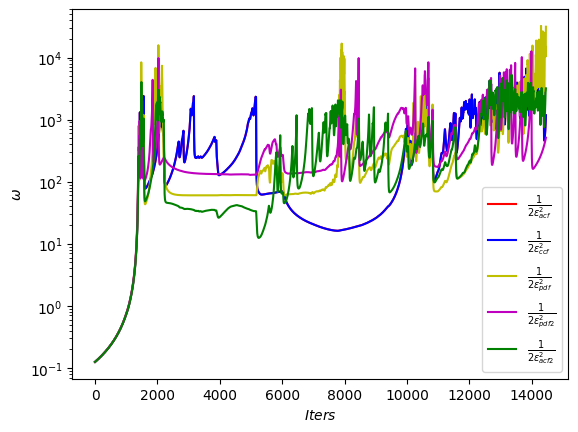

In [79]:
draw_adaptive_w(model4)
draw_epoch_w(model4)

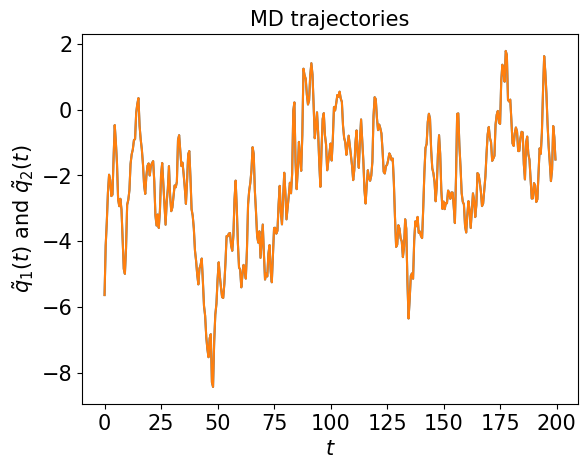

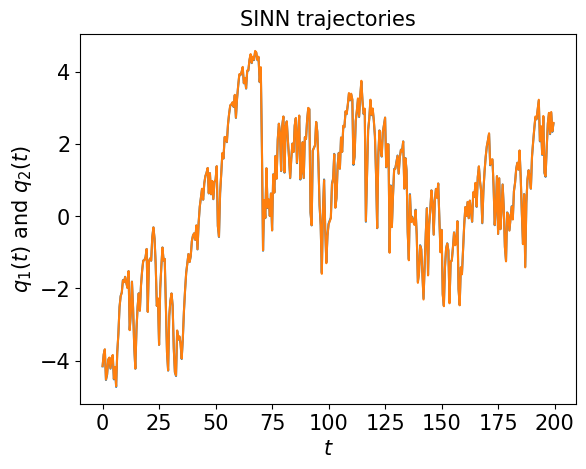

In [80]:
test1(model4)

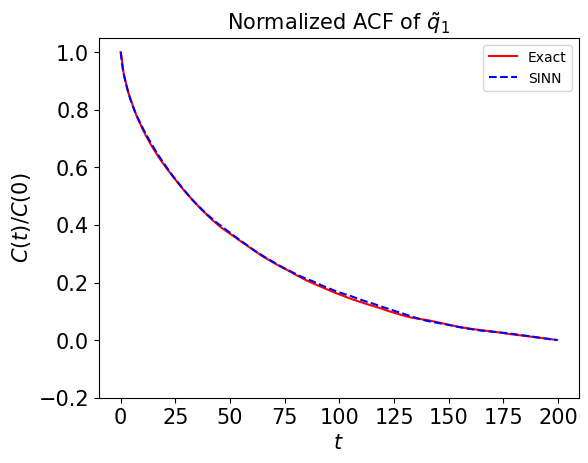

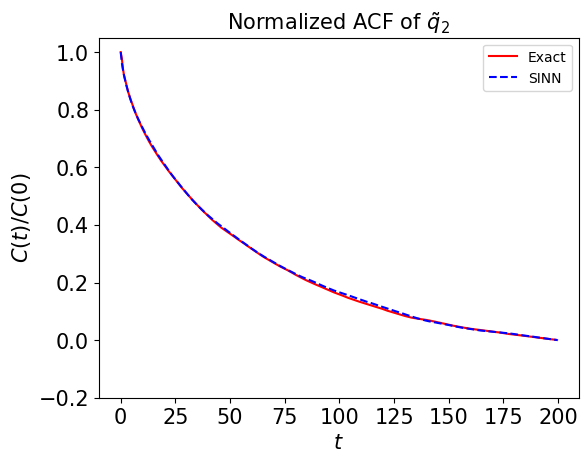

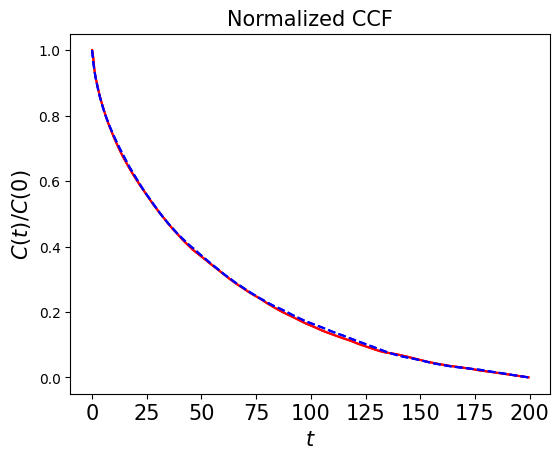

In [81]:
test2(model4)

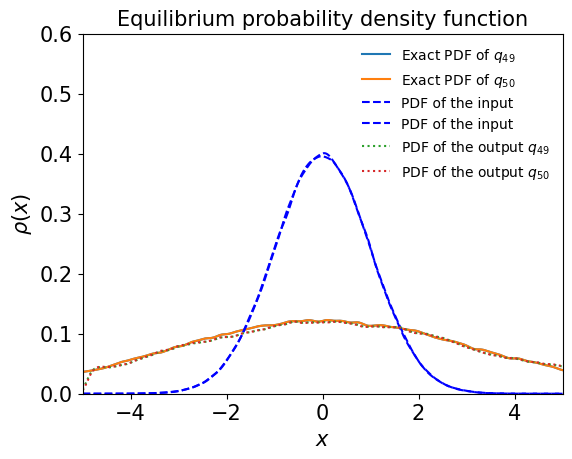

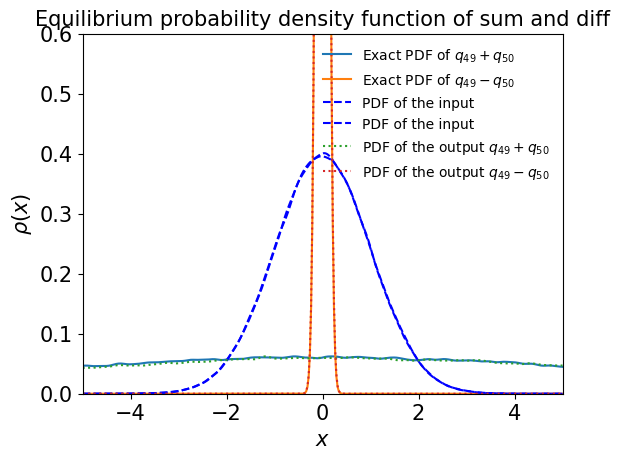

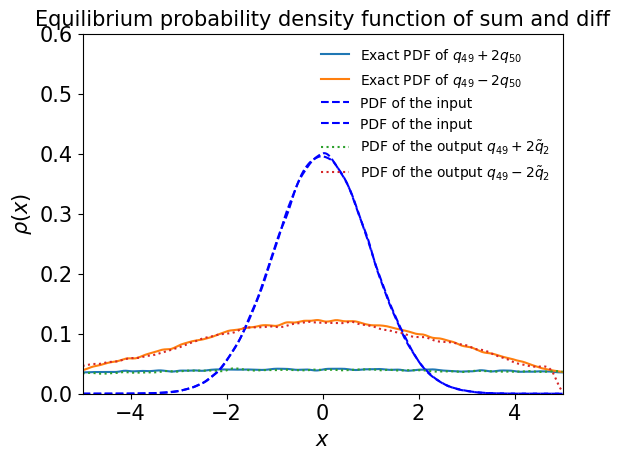

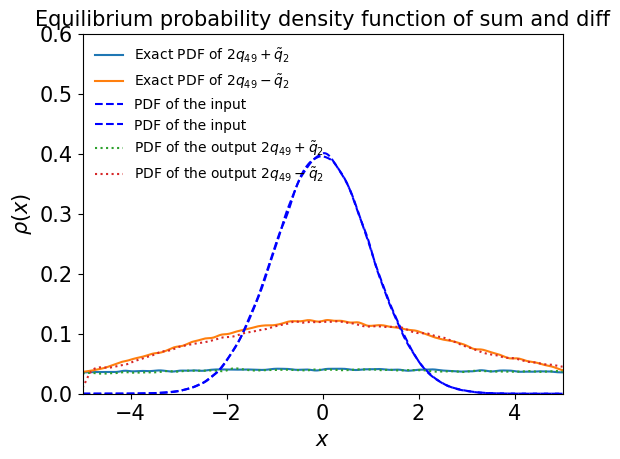

In [82]:
test3(model4)

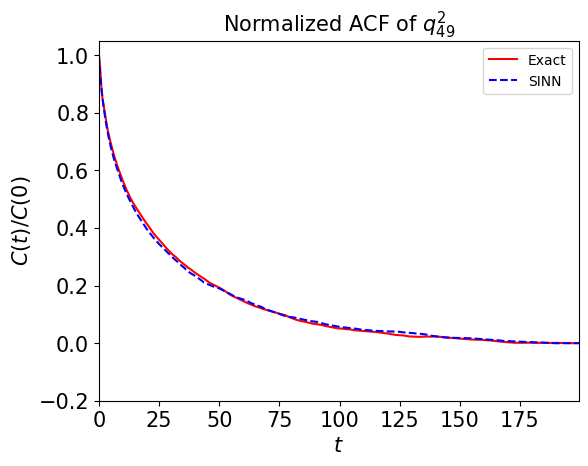

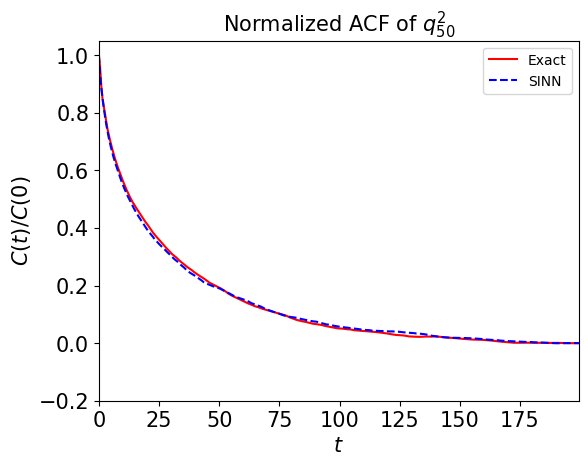

In [83]:
test4(model4)

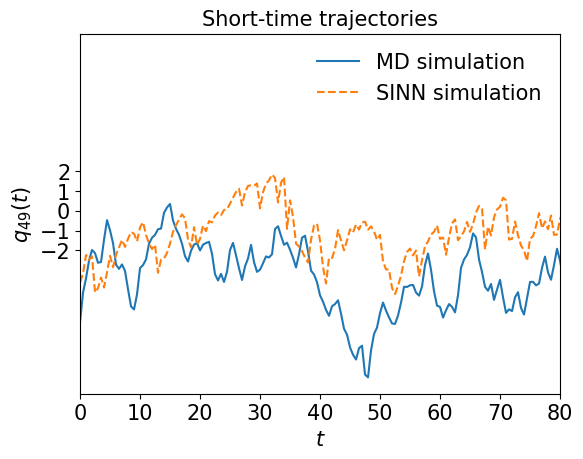

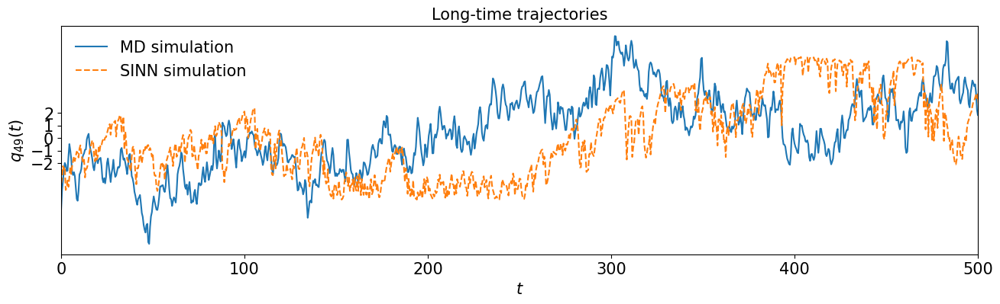

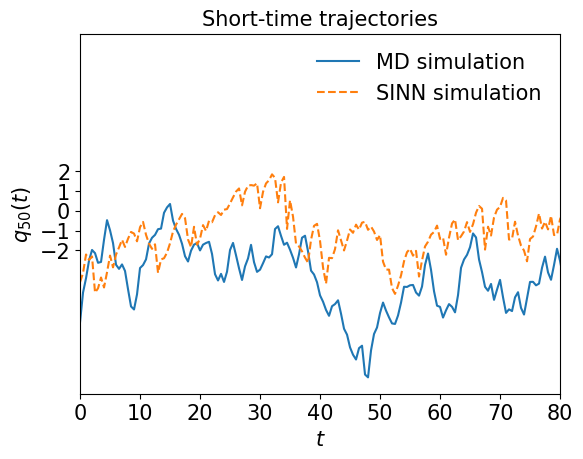

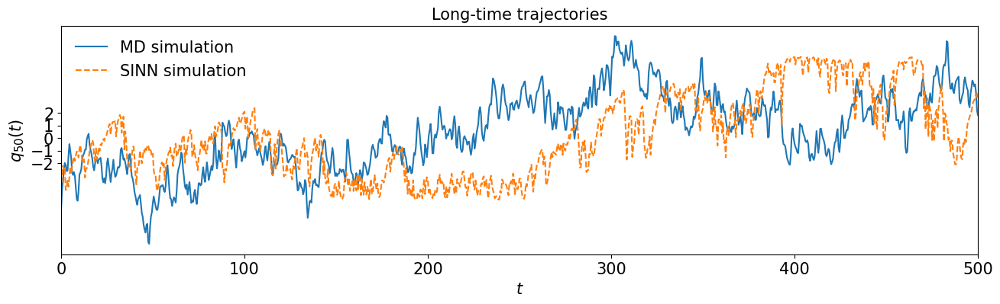

In [84]:
test5(model4)

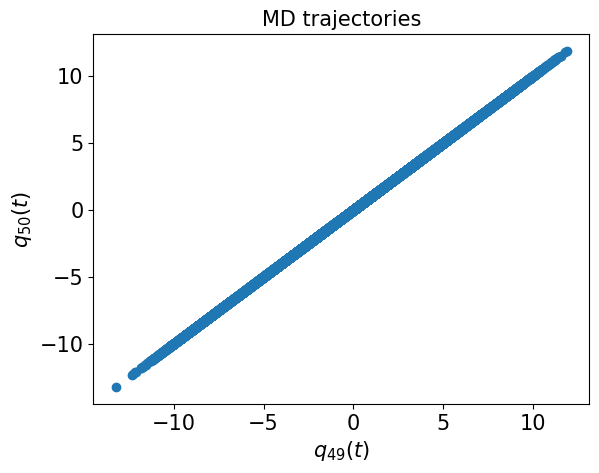

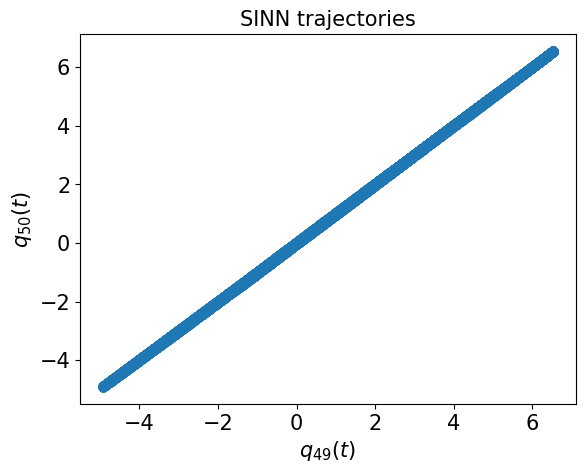

In [85]:
test6(model4)

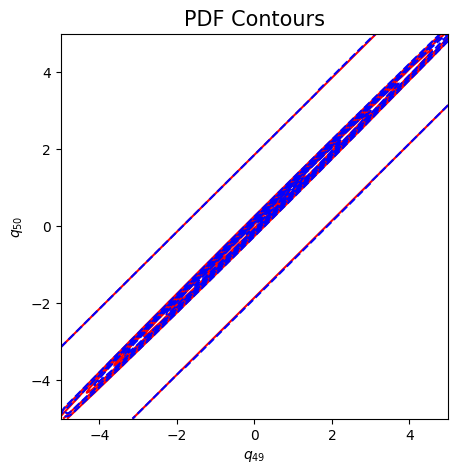

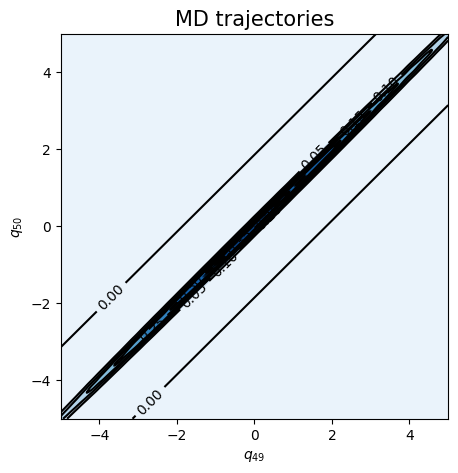

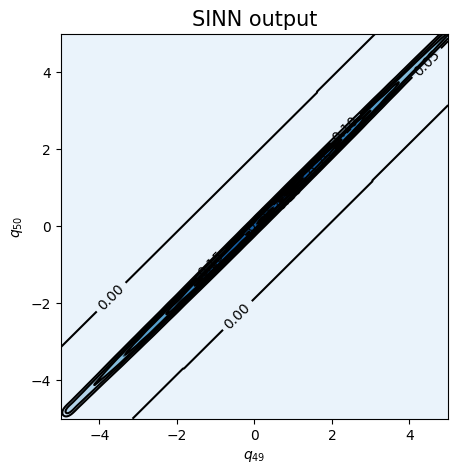

In [86]:
test7(model4)

In [87]:
### Defining SINN model
net5 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model5 = Model(net=net5)
model5.train()

[0]-th step loss: 0.8862, 0.8643, acf: 0.10248, ccf: 0.11661, pdf: 0.29271, pdf2: 0.30692, acf2: 0.04554
[50]-th step loss: 0.1137, 0.1168, acf: 0.02476, ccf: 0.02476, pdf: 0.03463, pdf2: 0.02881, acf2: 0.00380
[100]-th step loss: 0.0340, 0.0578, acf: 0.01087, ccf: 0.01087, pdf: 0.01136, pdf2: 0.00574, acf2: 0.01891
[150]-th step loss: 0.0116, 0.0127, acf: 0.00044, ccf: 0.00044, pdf: 0.00673, pdf2: 0.00348, acf2: 0.00166
[200]-th step loss: 0.0072, 0.0083, acf: 0.00082, ccf: 0.00082, pdf: 0.00395, pdf2: 0.00193, acf2: 0.00082
[250]-th step loss: 0.0109, 0.0140, acf: 0.00187, ccf: 0.00187, pdf: 0.00502, pdf2: 0.00178, acf2: 0.00348
[300]-th step loss: 0.0051, 0.0051, acf: 0.00039, ccf: 0.00039, pdf: 0.00241, pdf2: 0.00092, acf2: 0.00096
[350]-th step loss: 0.0043, 0.0040, acf: 0.00021, ccf: 0.00021, pdf: 0.00178, pdf2: 0.00068, acf2: 0.00111
[400]-th step loss: 0.0031, 0.0056, acf: 0.00111, ccf: 0.00111, pdf: 0.00129, pdf2: 0.00053, acf2: 0.00159
[450]-th step loss: 0.0048, 0.0029, acf:

[3850]-th step loss: 0.0319, 0.0256, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01333
[3900]-th step loss: 0.0287, 0.0254, acf: 0.00014, ccf: 0.00014, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01304
[3950]-th step loss: 0.0256, 0.0239, acf: 0.00036, ccf: 0.00036, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01106
[4000]-th step loss: 0.0259, 0.0252, acf: 0.00012, ccf: 0.00012, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01287
[4050]-th step loss: 0.0266, 0.0263, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01417
[4100]-th step loss: 0.0258, 0.0253, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01303
[4150]-th step loss: 0.0263, 0.0244, acf: 0.00021, ccf: 0.00021, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01193
[4200]-th step loss: 0.0332, 0.0252, acf: 0.00018, ccf: 0.00018, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01271
[4250]-th step loss: 0.0290, 0.0285, acf: 0.00014, ccf: 0.00014, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01612
[4300]-th step loss: 0.0259,

[7650]-th step loss: 0.0264, 0.0261, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00381, acf2: 0.01390
[7700]-th step loss: 0.0303, 0.0287, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01649
[7750]-th step loss: 0.0250, 0.0255, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01332
[7800]-th step loss: 0.0255, 0.0264, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01431
[7850]-th step loss: 0.0239, 0.0250, acf: 0.00011, ccf: 0.00011, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01268
[7900]-th step loss: 0.0261, 0.0245, acf: 0.00024, ccf: 0.00024, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01200
[7950]-th step loss: 0.0271, 0.0245, acf: 0.00017, ccf: 0.00017, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01214
[8000]-th step loss: 0.0257, 0.0276, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00381, acf2: 0.01538
[8050]-th step loss: 0.0276, 0.0274, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01528
[8100]-th step loss: 0.0259,

[11450]-th step loss: 0.0287, 0.0268, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00382, acf2: 0.01458
[11500]-th step loss: 0.0398, 0.0275, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01536
[11550]-th step loss: 0.0246, 0.0259, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01377
[11600]-th step loss: 0.0328, 0.0272, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01512
[11650]-th step loss: 0.0262, 0.0279, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01581
[11700]-th step loss: 0.0276, 0.0267, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00384, acf2: 0.01450
[11750]-th step loss: 0.0291, 0.0267, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00393, acf2: 0.01438
[11800]-th step loss: 0.0257, 0.0287, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01648
[11850]-th step loss: 0.0233, 0.0261, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01391
[11900]-th step los

[15250]-th step loss: 0.0279, 0.0264, acf: 0.00015, ccf: 0.00015, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01400
[15300]-th step loss: 0.0241, 0.0292, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01698
[15350]-th step loss: 0.0316, 0.0303, acf: 0.00017, ccf: 0.00017, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01790
[15400]-th step loss: 0.0258, 0.0274, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01528
[15450]-th step loss: 0.0244, 0.0252, acf: 0.00008, ccf: 0.00008, pdf: 0.00829, pdf2: 0.00386, acf2: 0.01293
[15500]-th step loss: 0.0329, 0.0249, acf: 0.00015, ccf: 0.00015, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01250
[15550]-th step loss: 0.0254, 0.0279, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01573
[15600]-th step loss: 0.0237, 0.0248, acf: 0.00037, ccf: 0.00037, pdf: 0.00829, pdf2: 0.00403, acf2: 0.01173
[15650]-th step loss: 0.0271, 0.0275, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01539
[15700]-th step los

[19050]-th step loss: 0.0255, 0.0271, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00382, acf2: 0.01498
[19100]-th step loss: 0.0274, 0.0251, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01286
[19150]-th step loss: 0.0248, 0.0238, acf: 0.00028, ccf: 0.00028, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01117
[19200]-th step loss: 0.0284, 0.0265, acf: 0.00001, ccf: 0.00001, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01439
[19250]-th step loss: 0.0276, 0.0272, acf: 0.00001, ccf: 0.00001, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01505
[19300]-th step loss: 0.0308, 0.0291, acf: 0.00008, ccf: 0.00008, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01686
[19350]-th step loss: 0.0240, 0.0287, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00386, acf2: 0.01643
[19400]-th step loss: 0.0321, 0.0275, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00386, acf2: 0.01528
[19450]-th step loss: 0.0293, 0.0295, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01719
[19500]-th step los

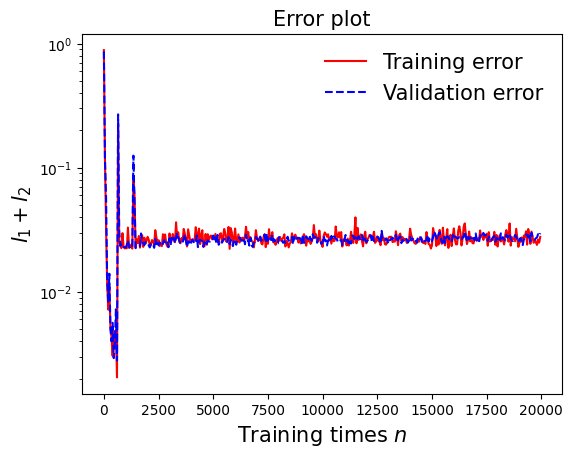

In [88]:
draw_loss(model5)

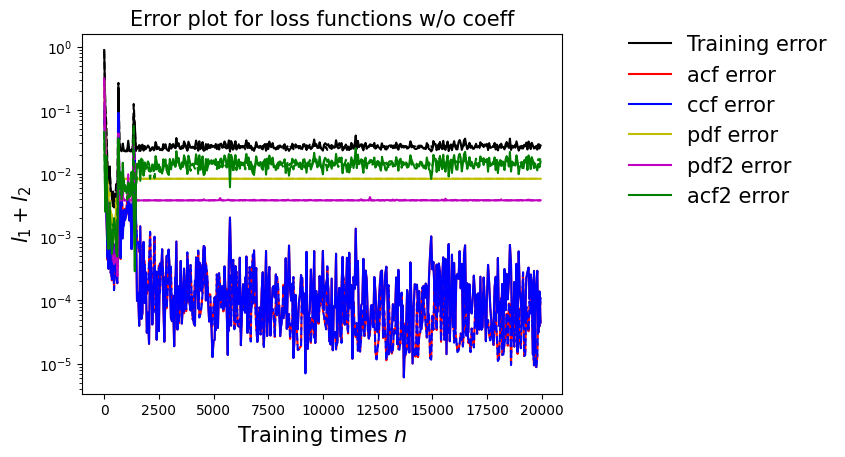

In [89]:
draw_errors(model5)

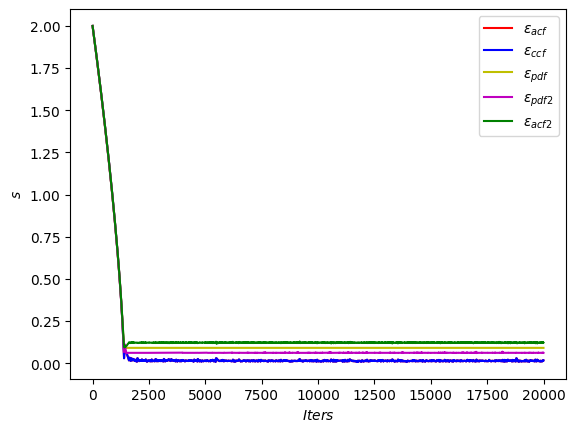

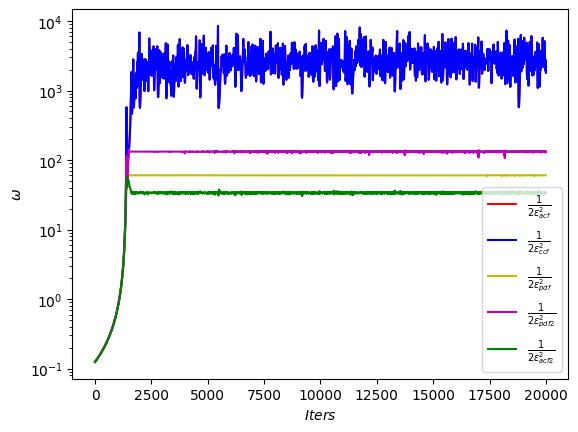

In [90]:
draw_adaptive_w(model5)
draw_epoch_w(model5)

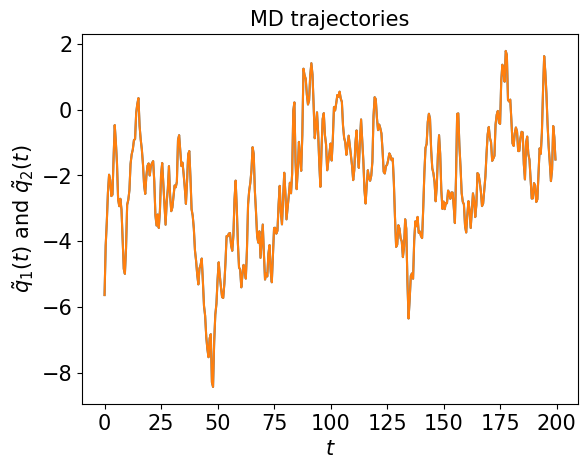

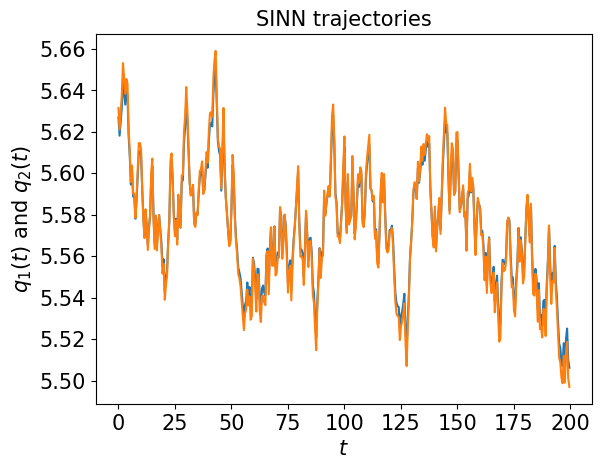

In [91]:
test1(model5)

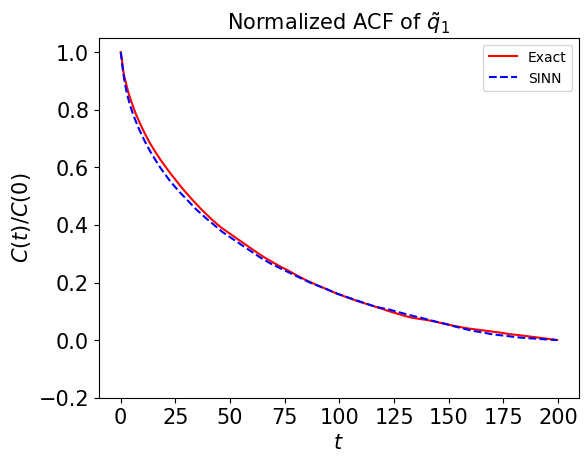

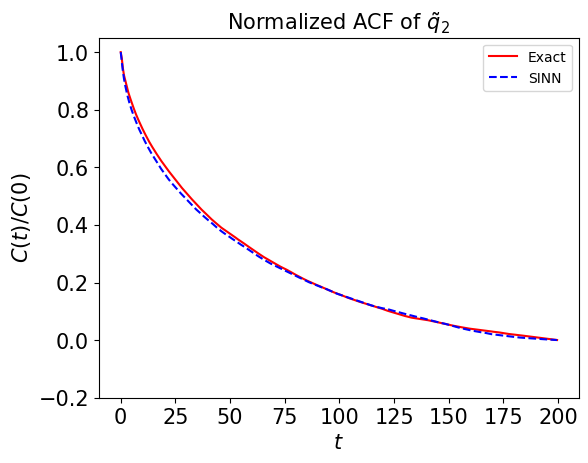

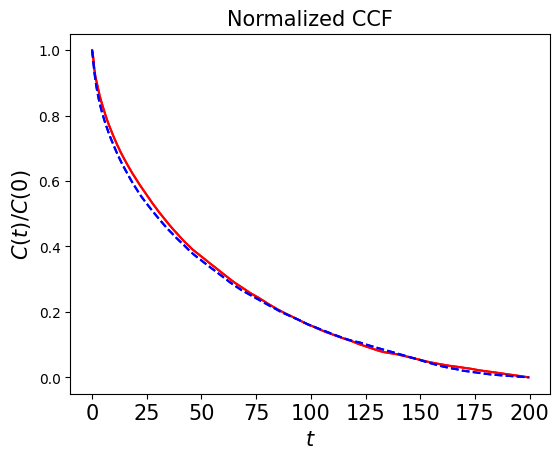

In [92]:
test2(model5)

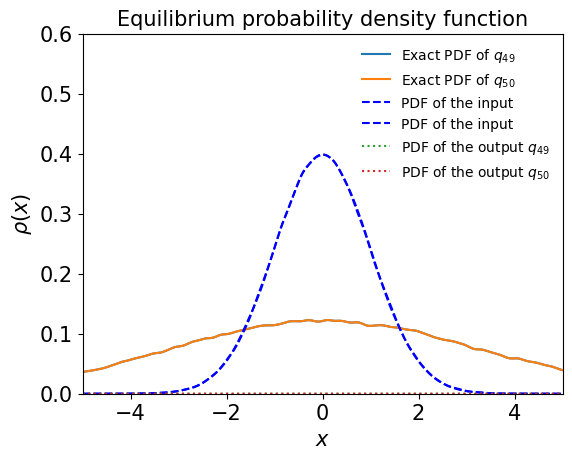

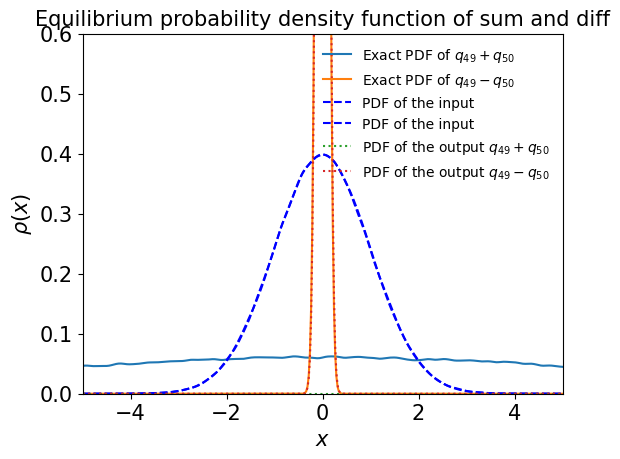

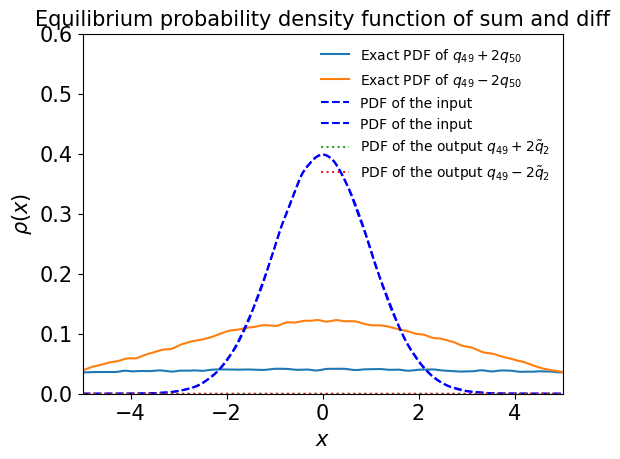

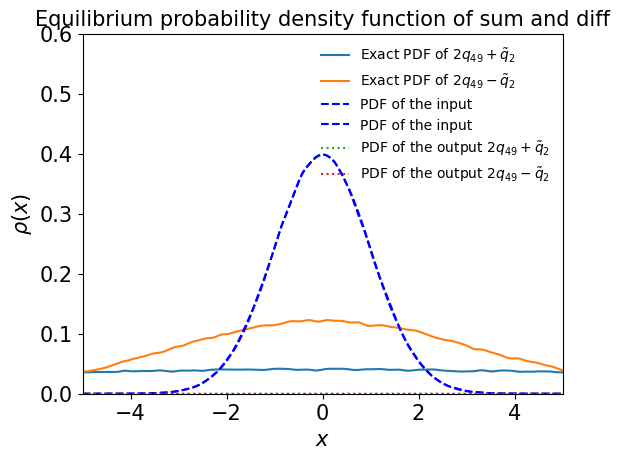

In [93]:
test3(model5)

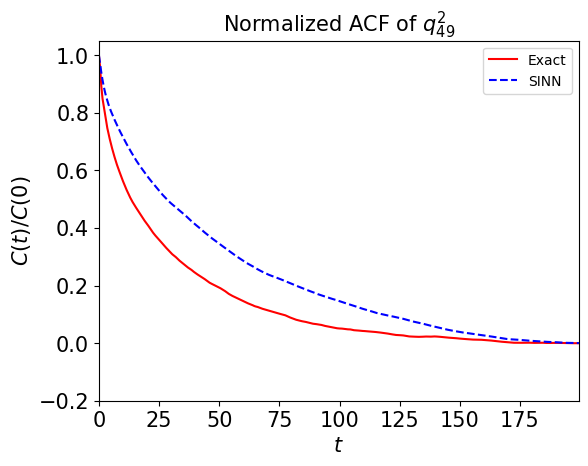

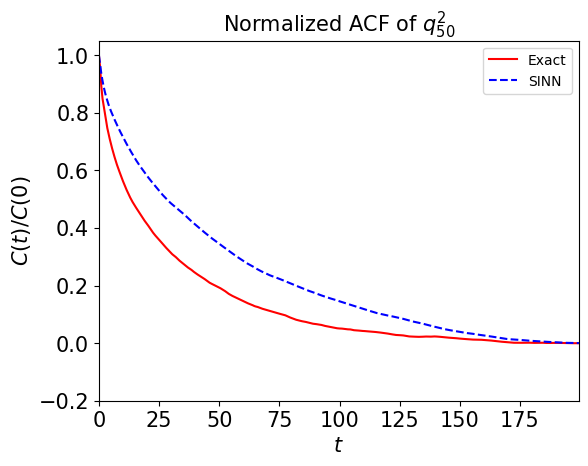

In [94]:
test4(model5)

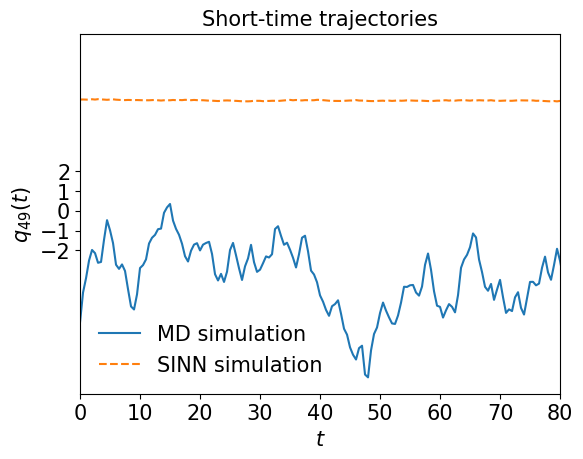

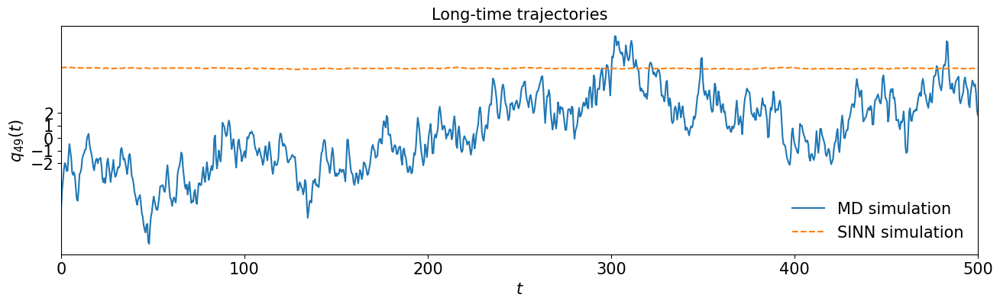

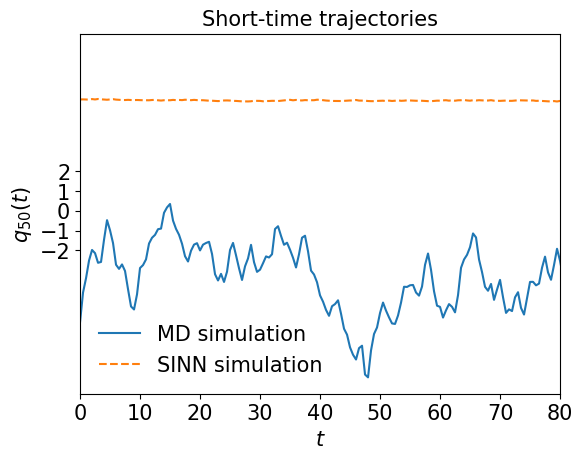

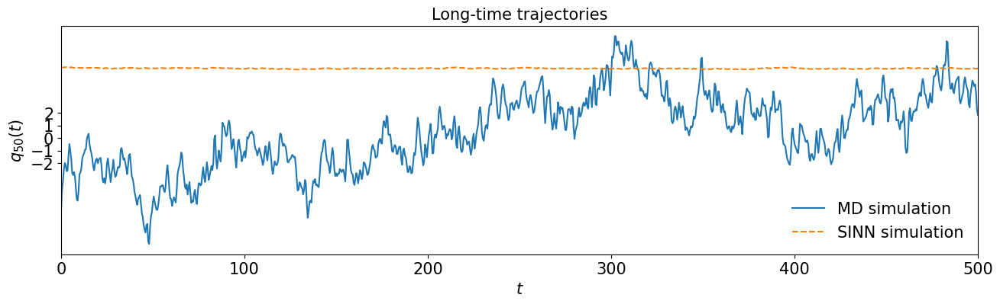

In [95]:
test5(model5)

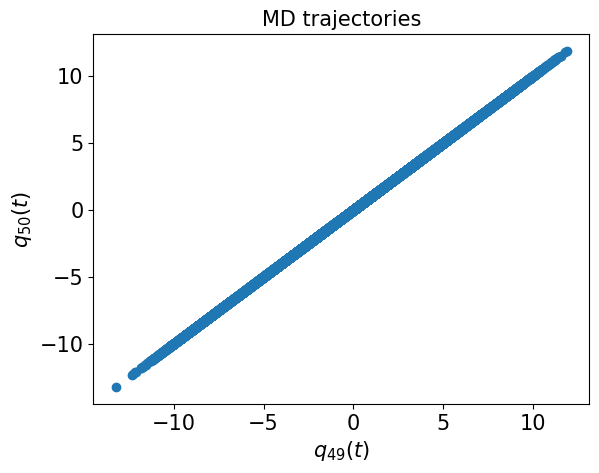

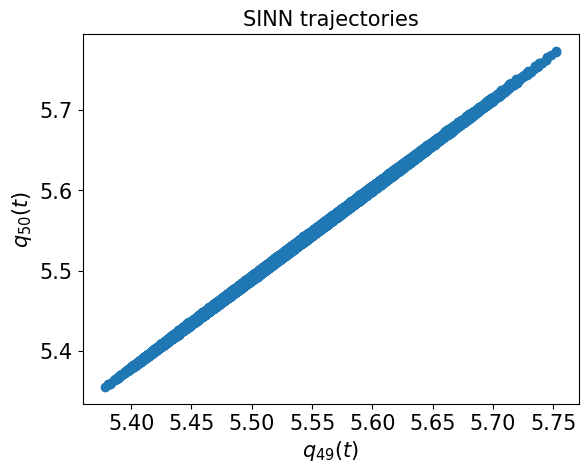

In [96]:
test6(model5)

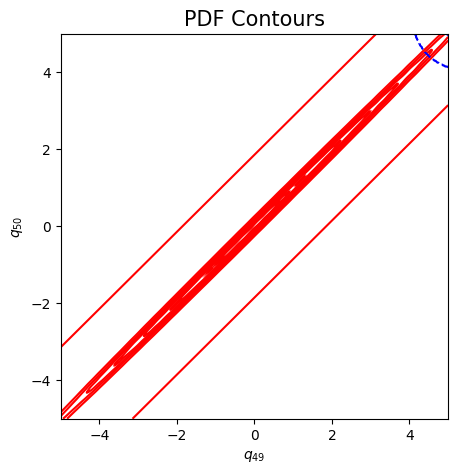

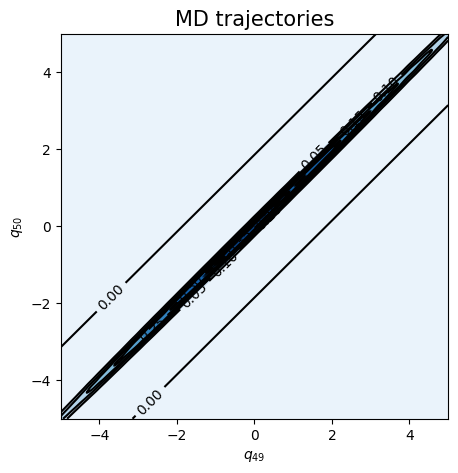

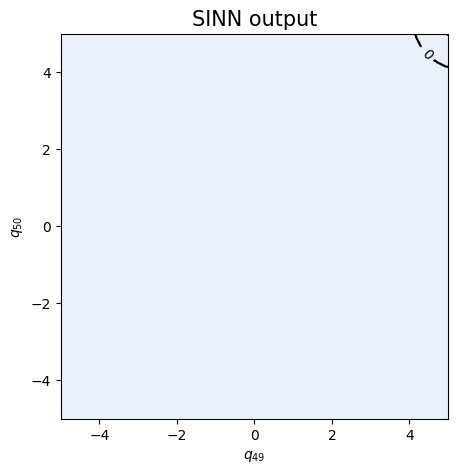

In [97]:
test7(model5)

In [98]:
### Defining SINN model
net6 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model6 = Model(net=net6)
model6.train()

[0]-th step loss: 0.8669, 0.8492, acf: 0.10295, ccf: 0.12734, pdf: 0.29267, pdf2: 0.28029, acf2: 0.04596
[50]-th step loss: 0.1038, 0.1021, acf: 0.01260, ccf: 0.01259, pdf: 0.04530, pdf2: 0.02999, acf2: 0.00163
[100]-th step loss: 0.0219, 0.0201, acf: 0.00156, ccf: 0.00156, pdf: 0.01134, pdf2: 0.00512, acf2: 0.00057
[150]-th step loss: 0.0116, 0.0101, acf: 0.00047, ccf: 0.00047, pdf: 0.00563, pdf2: 0.00233, acf2: 0.00121
[200]-th step loss: 0.0120, 0.0102, acf: 0.00122, ccf: 0.00122, pdf: 0.00505, pdf2: 0.00214, acf2: 0.00056
[250]-th step loss: 0.0104, 0.0137, acf: 0.00323, ccf: 0.00323, pdf: 0.00387, pdf2: 0.00163, acf2: 0.00173
[300]-th step loss: 0.0067, 0.0059, acf: 0.00040, ccf: 0.00040, pdf: 0.00211, pdf2: 0.00083, acf2: 0.00215
[350]-th step loss: 0.0102, 0.0115, acf: 0.00067, ccf: 0.00067, pdf: 0.00696, pdf2: 0.00245, acf2: 0.00069
[400]-th step loss: 0.0104, 0.0083, acf: 0.00153, ccf: 0.00153, pdf: 0.00355, pdf2: 0.00150, acf2: 0.00023
[450]-th step loss: 0.0044, 0.0052, acf:

[3850]-th step loss: 0.0390, 0.0434, acf: 0.01565, ccf: 0.01565, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00006
[3900]-th step loss: 0.0361, 0.0420, acf: 0.01490, ccf: 0.01490, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00008
[3950]-th step loss: 0.0395, 0.0414, acf: 0.01462, ccf: 0.01462, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00010
[4000]-th step loss: 0.0408, 0.0442, acf: 0.01602, ccf: 0.01602, pdf: 0.00829, pdf2: 0.00382, acf2: 0.00007
[4050]-th step loss: 0.0361, 0.0380, acf: 0.01282, ccf: 0.01282, pdf: 0.00829, pdf2: 0.00381, acf2: 0.00023
[4100]-th step loss: 0.0298, 0.0461, acf: 0.01694, ccf: 0.01694, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00018
[4150]-th step loss: 0.0484, 0.0504, acf: 0.01902, ccf: 0.01902, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00030
[4200]-th step loss: 0.0385, 0.0430, acf: 0.01541, ccf: 0.01541, pdf: 0.00829, pdf2: 0.00379, acf2: 0.00006
[4250]-th step loss: 0.0472, 0.0509, acf: 0.01922, ccf: 0.01922, pdf: 0.00829, pdf2: 0.00379, acf2: 0.00037
[4300]-th step loss: 0.0373,

[7650]-th step loss: 0.0384, 0.0469, acf: 0.01735, ccf: 0.01735, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00016
[7700]-th step loss: 0.0446, 0.0469, acf: 0.01737, ccf: 0.01737, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00014
[7750]-th step loss: 0.0457, 0.0503, acf: 0.01894, ccf: 0.01894, pdf: 0.00829, pdf2: 0.00379, acf2: 0.00028
[7800]-th step loss: 0.0418, 0.0497, acf: 0.01869, ccf: 0.01869, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00026
[7850]-th step loss: 0.0430, 0.0431, acf: 0.01545, ccf: 0.01545, pdf: 0.00829, pdf2: 0.00379, acf2: 0.00009
[7900]-th step loss: 0.0421, 0.0453, acf: 0.01655, ccf: 0.01655, pdf: 0.00829, pdf2: 0.00382, acf2: 0.00010
[7950]-th step loss: 0.0435, 0.0484, acf: 0.01805, ccf: 0.01805, pdf: 0.00829, pdf2: 0.00380, acf2: 0.00020
[8000]-th step loss: 0.0392, 0.0462, acf: 0.01702, ccf: 0.01702, pdf: 0.00829, pdf2: 0.00380, acf2: 0.00012
[8050]-th step loss: 0.0360, 0.0497, acf: 0.01866, ccf: 0.01866, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00026
[8100]-th step loss: 0.0350,

[11450]-th step loss: 0.0324, 0.0430, acf: 0.01544, ccf: 0.01544, pdf: 0.00829, pdf2: 0.00379, acf2: 0.00004
[11500]-th step loss: 0.0469, 0.0446, acf: 0.01623, ccf: 0.01623, pdf: 0.00829, pdf2: 0.00379, acf2: 0.00009
[11550]-th step loss: 0.0458, 0.0470, acf: 0.01740, ccf: 0.01740, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00013
[11600]-th step loss: 0.0338, 0.0410, acf: 0.01444, ccf: 0.01444, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00005
[11650]-th step loss: 0.0459, 0.0449, acf: 0.01636, ccf: 0.01636, pdf: 0.00829, pdf2: 0.00379, acf2: 0.00007
[11700]-th step loss: 0.0446, 0.0480, acf: 0.01788, ccf: 0.01788, pdf: 0.00829, pdf2: 0.00382, acf2: 0.00017
[11750]-th step loss: 0.0416, 0.0469, acf: 0.01736, ccf: 0.01736, pdf: 0.00829, pdf2: 0.00379, acf2: 0.00013
[11800]-th step loss: 0.0398, 0.0421, acf: 0.01497, ccf: 0.01497, pdf: 0.00829, pdf2: 0.00379, acf2: 0.00004
[11850]-th step loss: 0.0395, 0.0464, acf: 0.01709, ccf: 0.01709, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00011
[11900]-th step los

[15250]-th step loss: 0.0373, 0.0476, acf: 0.01766, ccf: 0.01766, pdf: 0.00829, pdf2: 0.00380, acf2: 0.00015
[15300]-th step loss: 0.0410, 0.0470, acf: 0.01739, ccf: 0.01739, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00013
[15350]-th step loss: 0.0419, 0.0478, acf: 0.01778, ccf: 0.01778, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00016
[15400]-th step loss: 0.0441, 0.0459, acf: 0.01688, ccf: 0.01688, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00010
[15450]-th step loss: 0.0436, 0.0465, acf: 0.01713, ccf: 0.01713, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00013
[15500]-th step loss: 0.0374, 0.0440, acf: 0.01594, ccf: 0.01594, pdf: 0.00829, pdf2: 0.00380, acf2: 0.00006
[15550]-th step loss: 0.0378, 0.0457, acf: 0.01678, ccf: 0.01678, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00009
[15600]-th step loss: 0.0455, 0.0507, acf: 0.01915, ccf: 0.01915, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00031
[15650]-th step loss: 0.0375, 0.0465, acf: 0.01715, ccf: 0.01715, pdf: 0.00829, pdf2: 0.00379, acf2: 0.00011
[15700]-th step los

[19050]-th step loss: 0.0356, 0.0438, acf: 0.01583, ccf: 0.01583, pdf: 0.00829, pdf2: 0.00379, acf2: 0.00004
[19100]-th step loss: 0.0413, 0.0464, acf: 0.01712, ccf: 0.01712, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00011
[19150]-th step loss: 0.0403, 0.0465, acf: 0.01717, ccf: 0.01717, pdf: 0.00829, pdf2: 0.00380, acf2: 0.00011
[19200]-th step loss: 0.0429, 0.0495, acf: 0.01859, ccf: 0.01859, pdf: 0.00829, pdf2: 0.00380, acf2: 0.00023
[19250]-th step loss: 0.0417, 0.0464, acf: 0.01711, ccf: 0.01711, pdf: 0.00829, pdf2: 0.00380, acf2: 0.00010
[19300]-th step loss: 0.0424, 0.0432, acf: 0.01557, ccf: 0.01557, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00003
[19350]-th step loss: 0.0510, 0.0455, acf: 0.01667, ccf: 0.01667, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00009
[19400]-th step loss: 0.0413, 0.0497, acf: 0.01867, ccf: 0.01867, pdf: 0.00829, pdf2: 0.00379, acf2: 0.00025
[19450]-th step loss: 0.0435, 0.0412, acf: 0.01455, ccf: 0.01455, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00002
[19500]-th step los

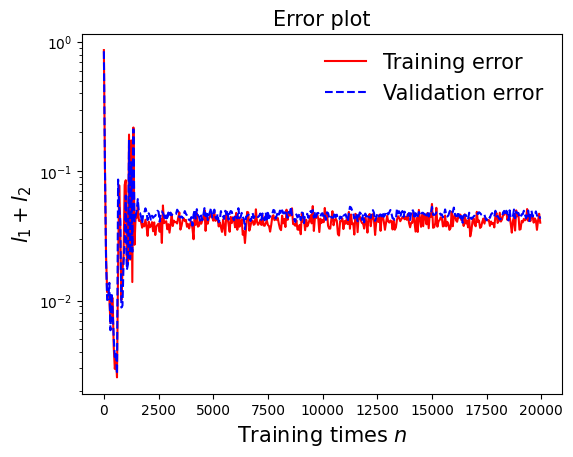

In [99]:
draw_loss(model6)

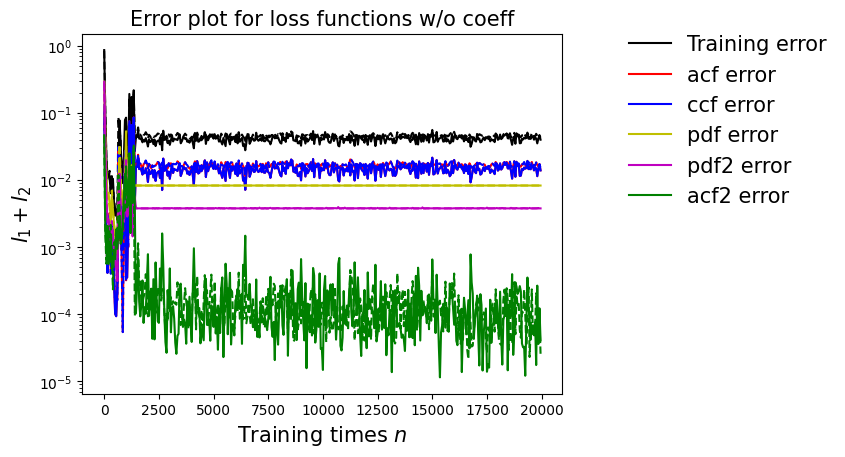

In [100]:
draw_errors(model6)

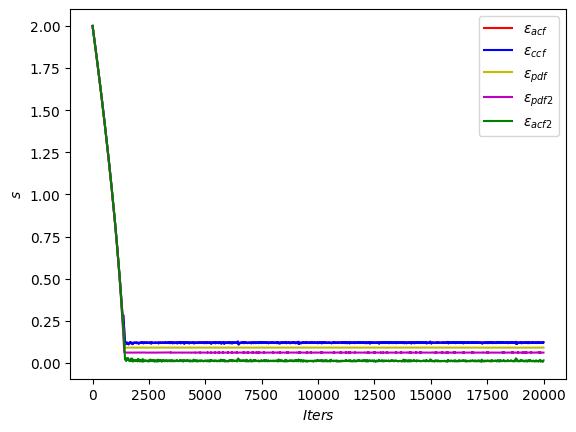

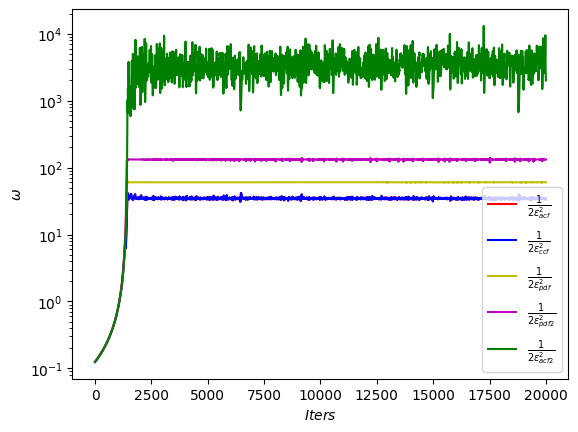

In [101]:
draw_adaptive_w(model6)
draw_epoch_w(model6)

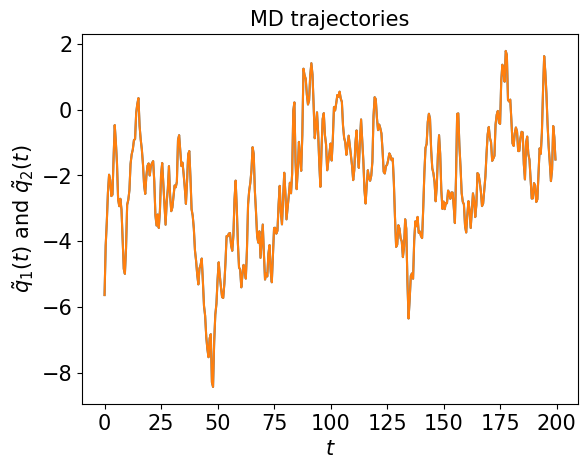

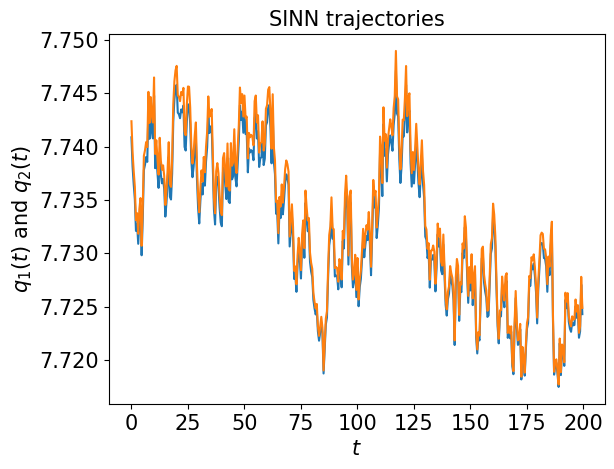

In [102]:
test1(model6)

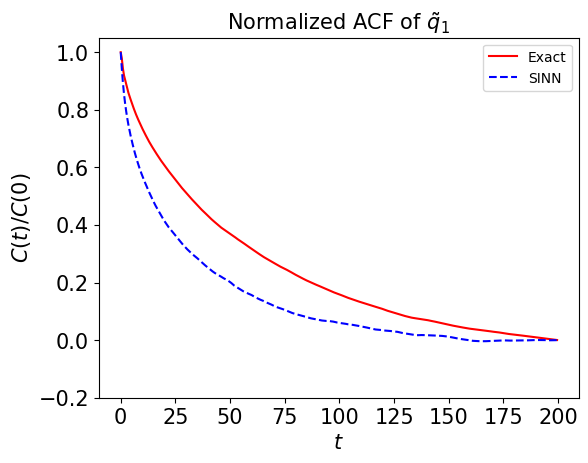

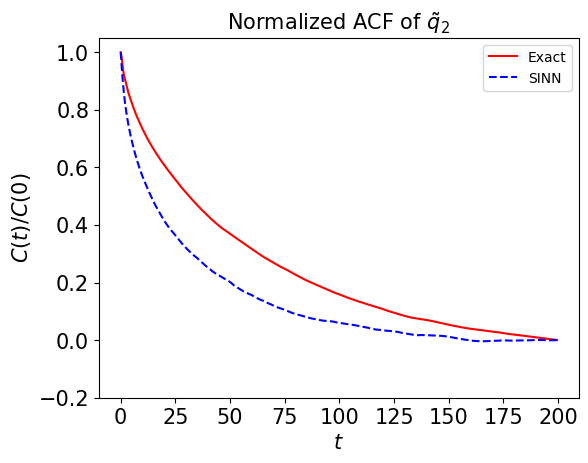

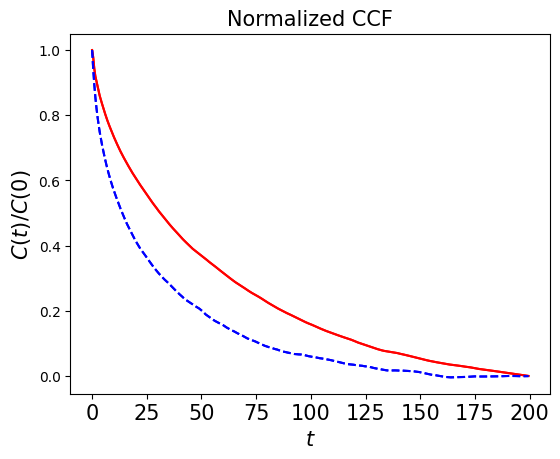

In [103]:
test2(model6)

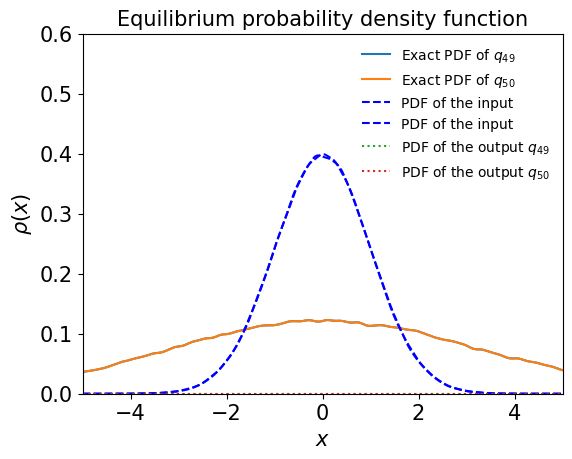

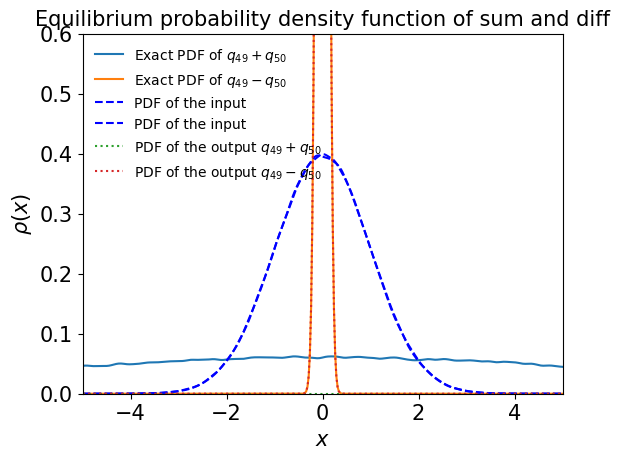

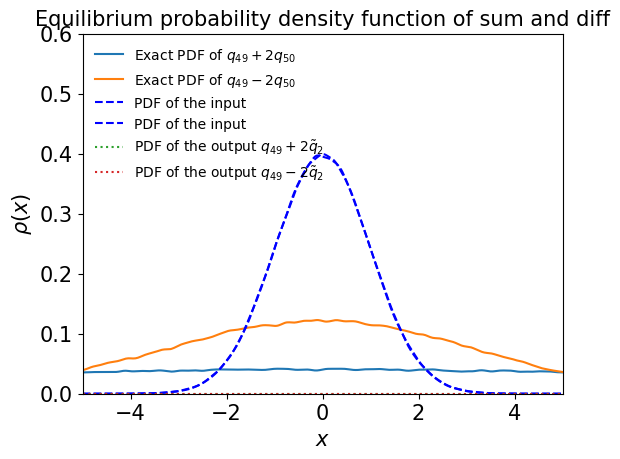

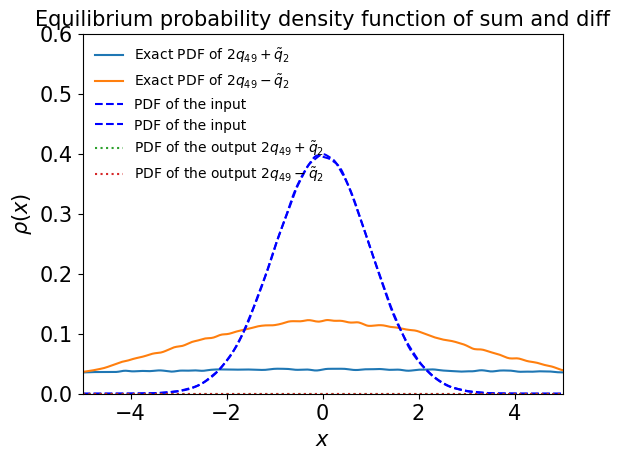

In [104]:
test3(model6)

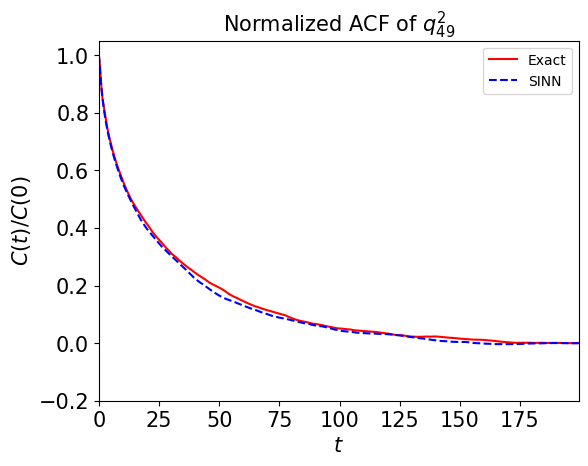

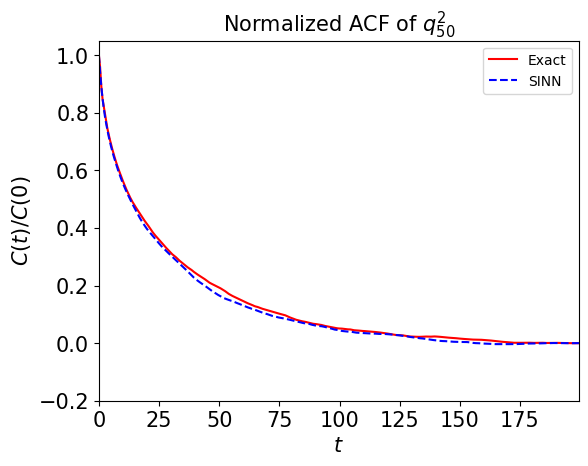

In [105]:
test4(model6)

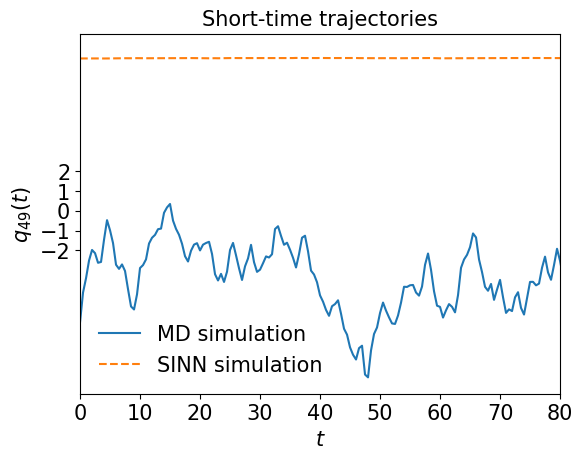

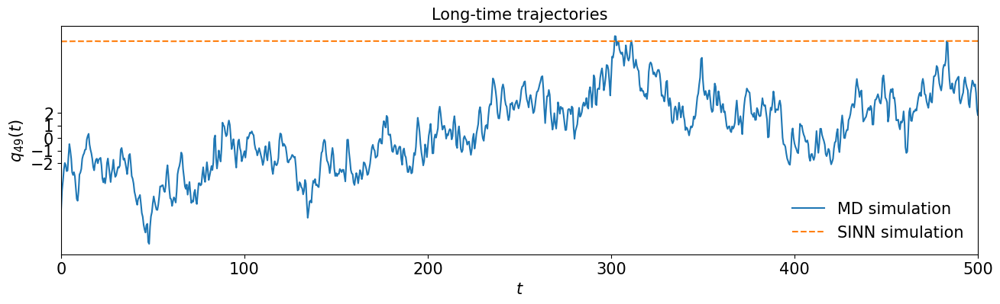

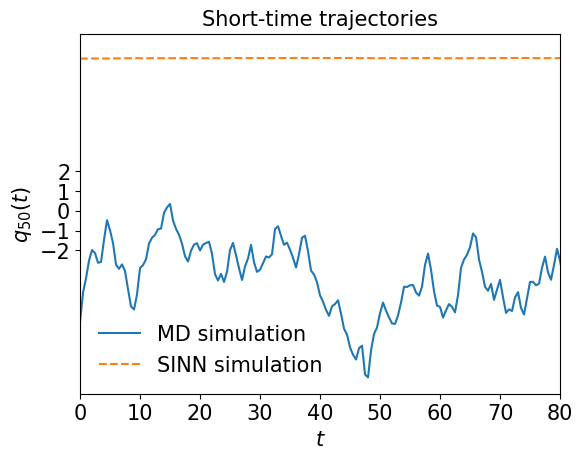

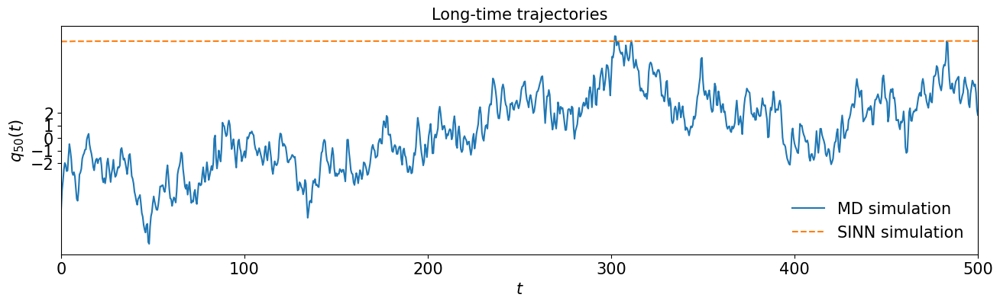

In [106]:
test5(model6)

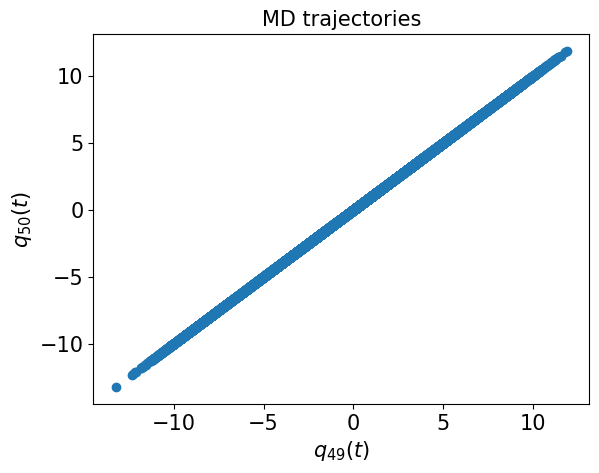

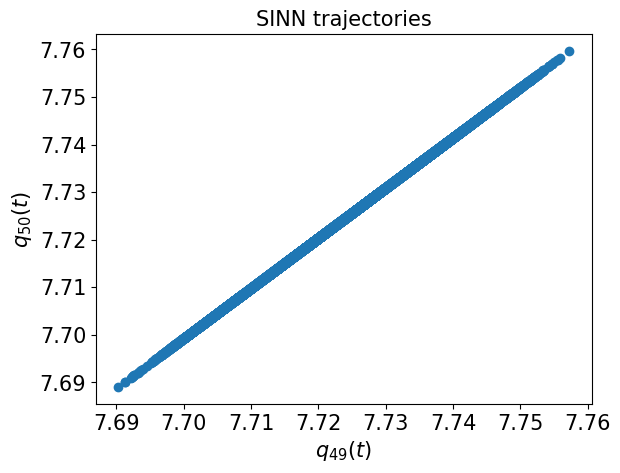

In [107]:
test6(model6)

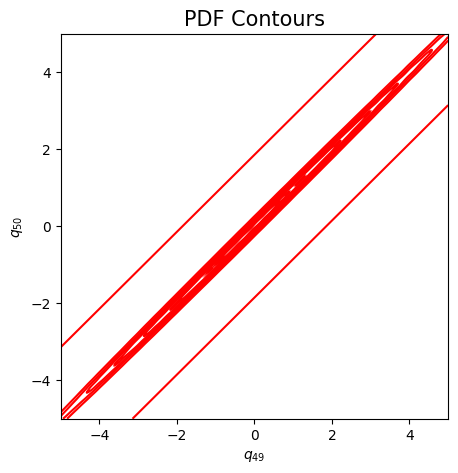

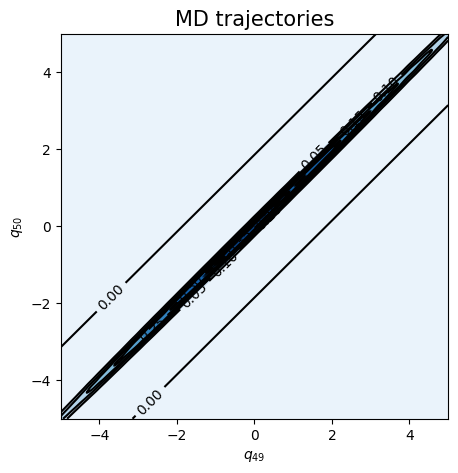

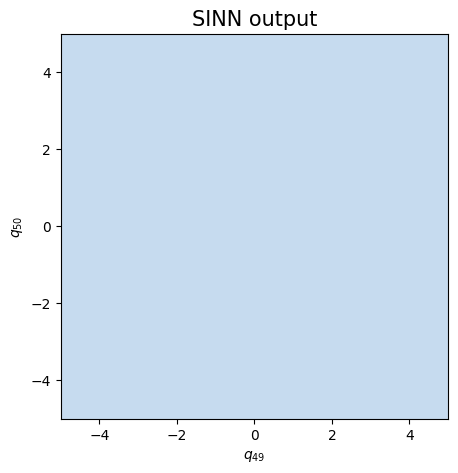

In [108]:
test7(model6)

In [109]:
### Defining SINN model
net7 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model7 = Model(net=net7)
model7.train()

[0]-th step loss: 0.8276, 0.8114, acf: 0.10285, ccf: 0.10305, pdf: 0.29278, pdf2: 0.26687, acf2: 0.04585
[50]-th step loss: 0.0937, 0.0839, acf: 0.00898, ccf: 0.00898, pdf: 0.03976, pdf2: 0.02516, acf2: 0.00100
[100]-th step loss: 0.0157, 0.0140, acf: 0.00101, ccf: 0.00101, pdf: 0.00792, pdf2: 0.00365, acf2: 0.00041
[150]-th step loss: 0.0112, 0.0094, acf: 0.00077, ccf: 0.00077, pdf: 0.00480, pdf2: 0.00200, acf2: 0.00103
[200]-th step loss: 0.0078, 0.0104, acf: 0.00096, ccf: 0.00096, pdf: 0.00457, pdf2: 0.00172, acf2: 0.00214
[250]-th step loss: 0.0075, 0.0066, acf: 0.00078, ccf: 0.00078, pdf: 0.00321, pdf2: 0.00132, acf2: 0.00050
[300]-th step loss: 0.0065, 0.0082, acf: 0.00079, ccf: 0.00079, pdf: 0.00438, pdf2: 0.00161, acf2: 0.00060
[350]-th step loss: 0.0051, 0.0078, acf: 0.00078, ccf: 0.00078, pdf: 0.00235, pdf2: 0.00090, acf2: 0.00298
[400]-th step loss: 0.0038, 0.0046, acf: 0.00013, ccf: 0.00013, pdf: 0.00240, pdf2: 0.00091, acf2: 0.00107
[450]-th step loss: 0.0050, 0.0036, acf:

[3850]-th step loss: 0.0267, 0.0267, acf: 0.00002, ccf: 0.00002, pdf: 0.00828, pdf2: 0.00378, acf2: 0.01464
[3900]-th step loss: 0.0259, 0.0266, acf: 0.00002, ccf: 0.00002, pdf: 0.00828, pdf2: 0.00378, acf2: 0.01446
[3950]-th step loss: 0.0268, 0.0271, acf: 0.00001, ccf: 0.00001, pdf: 0.00828, pdf2: 0.00378, acf2: 0.01501
[4000]-th step loss: 0.0261, 0.0259, acf: 0.00011, ccf: 0.00011, pdf: 0.00828, pdf2: 0.00378, acf2: 0.01362
[4050]-th step loss: 0.0292, 0.0267, acf: 0.00005, ccf: 0.00005, pdf: 0.00828, pdf2: 0.00378, acf2: 0.01452
[4100]-th step loss: 0.0277, 0.0278, acf: 0.00002, ccf: 0.00002, pdf: 0.00828, pdf2: 0.00378, acf2: 0.01573
[4150]-th step loss: 0.0264, 0.0274, acf: 0.00001, ccf: 0.00001, pdf: 0.00828, pdf2: 0.00379, acf2: 0.01534
[4200]-th step loss: 0.0273, 0.0287, acf: 0.00005, ccf: 0.00005, pdf: 0.00828, pdf2: 0.00381, acf2: 0.01650
[4250]-th step loss: 0.0267, 0.0268, acf: 0.00002, ccf: 0.00002, pdf: 0.00828, pdf2: 0.00380, acf2: 0.01463
[4300]-th step loss: 0.0258,

[7650]-th step loss: 0.4069, 0.4066, acf: 0.00227, ccf: 0.00227, pdf: 0.29650, pdf2: 0.09990, acf2: 0.00567
[7700]-th step loss: 0.4059, 0.4060, acf: 0.00110, ccf: 0.00110, pdf: 0.29603, pdf2: 0.09968, acf2: 0.00805
[7750]-th step loss: 0.4044, 0.4046, acf: 0.00211, ccf: 0.00211, pdf: 0.29508, pdf2: 0.09934, acf2: 0.00596
[7800]-th step loss: 0.4045, 0.4039, acf: 0.00096, ccf: 0.00096, pdf: 0.29440, pdf2: 0.09913, acf2: 0.00845
[7850]-th step loss: 0.4050, 0.4042, acf: 0.00196, ccf: 0.00196, pdf: 0.29470, pdf2: 0.09932, acf2: 0.00628
[7900]-th step loss: 0.4019, 0.4009, acf: 0.00109, ccf: 0.00109, pdf: 0.29226, pdf2: 0.09840, acf2: 0.00805
[7950]-th step loss: 0.4007, 0.4011, acf: 0.00048, ccf: 0.00048, pdf: 0.29161, pdf2: 0.09825, acf2: 0.01029
[8000]-th step loss: 0.3979, 0.3973, acf: 0.00065, ccf: 0.00065, pdf: 0.28917, pdf2: 0.09732, acf2: 0.00950
[8050]-th step loss: 0.3937, 0.3923, acf: 0.00091, ccf: 0.00091, pdf: 0.28570, pdf2: 0.09612, acf2: 0.00871
[8100]-th step loss: 0.3875,

[11450]-th step loss: 0.0026, 0.0026, acf: 0.00019, ccf: 0.00019, pdf: 0.00085, pdf2: 0.00123, acf2: 0.00014
[11500]-th step loss: 0.0022, 0.0018, acf: 0.00006, ccf: 0.00006, pdf: 0.00110, pdf2: 0.00044, acf2: 0.00016
[11550]-th step loss: 0.0013, 0.0020, acf: 0.00002, ccf: 0.00002, pdf: 0.00067, pdf2: 0.00026, acf2: 0.00103
[11600]-th step loss: 0.0021, 0.0022, acf: 0.00016, ccf: 0.00016, pdf: 0.00107, pdf2: 0.00038, acf2: 0.00040
[11650]-th step loss: 0.0013, 0.0006, acf: 0.00002, ccf: 0.00002, pdf: 0.00038, pdf2: 0.00017, acf2: 0.00004
[11700]-th step loss: 0.0026, 0.0005, acf: 0.00002, ccf: 0.00002, pdf: 0.00024, pdf2: 0.00016, acf2: 0.00003
[11750]-th step loss: 0.0038, 0.0024, acf: 0.00049, ccf: 0.00049, pdf: 0.00070, pdf2: 0.00030, acf2: 0.00047
[11800]-th step loss: 0.0007, 0.0014, acf: 0.00003, ccf: 0.00003, pdf: 0.00048, pdf2: 0.00019, acf2: 0.00068
[11850]-th step loss: 0.0007, 0.0007, acf: 0.00003, ccf: 0.00003, pdf: 0.00022, pdf2: 0.00010, acf2: 0.00028
[11900]-th step los

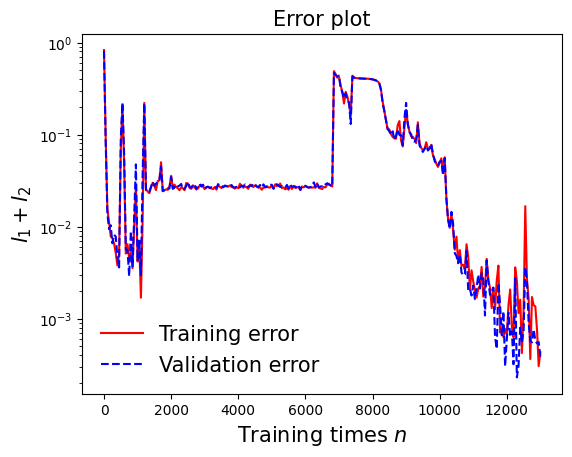

In [110]:
draw_loss(model7)

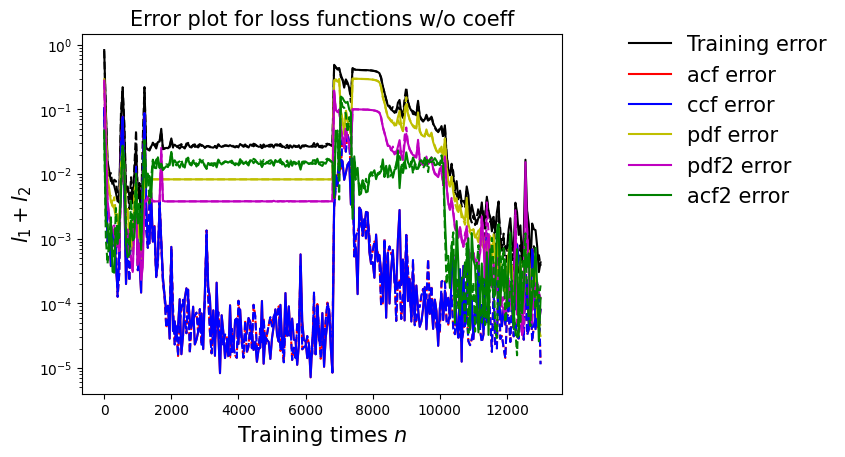

In [111]:
draw_errors(model7)

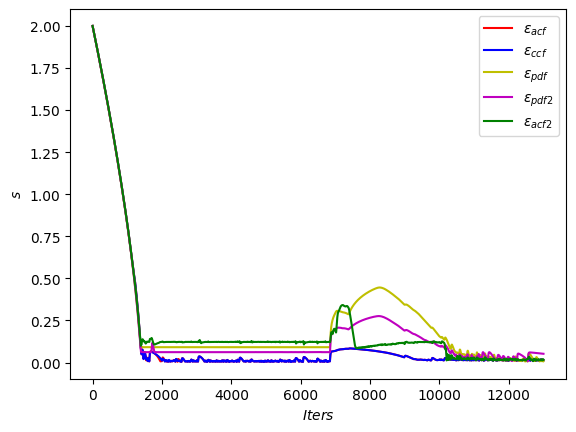

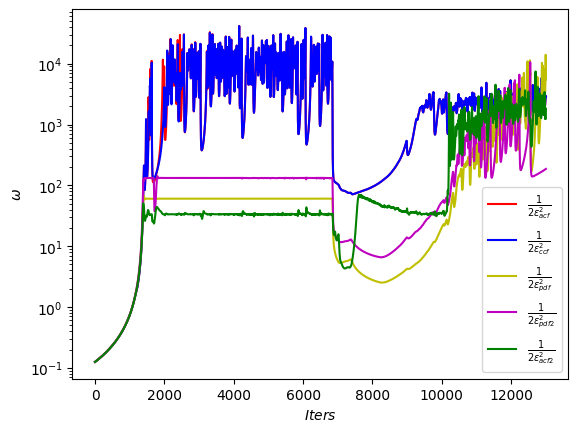

In [112]:
draw_adaptive_w(model7)
draw_epoch_w(model7)

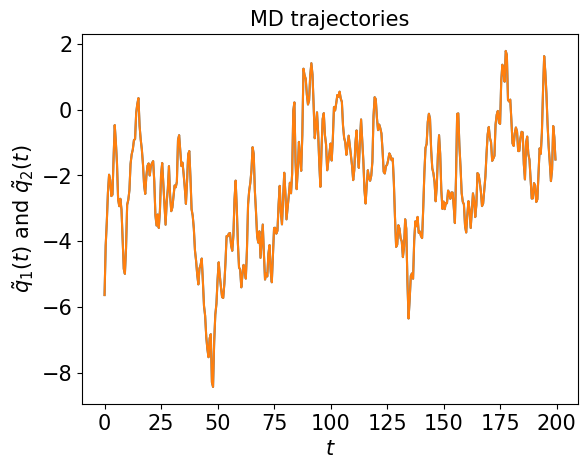

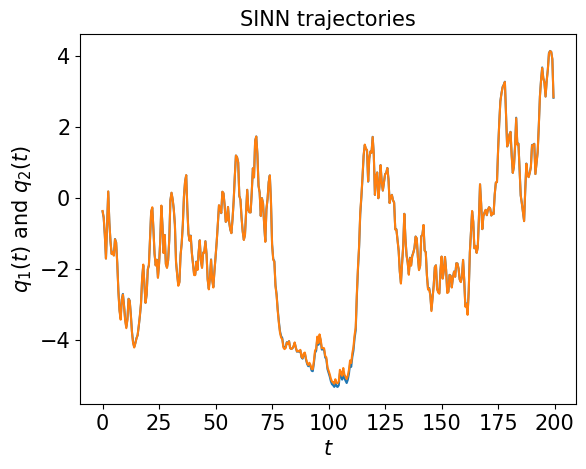

In [113]:
test1(model7)

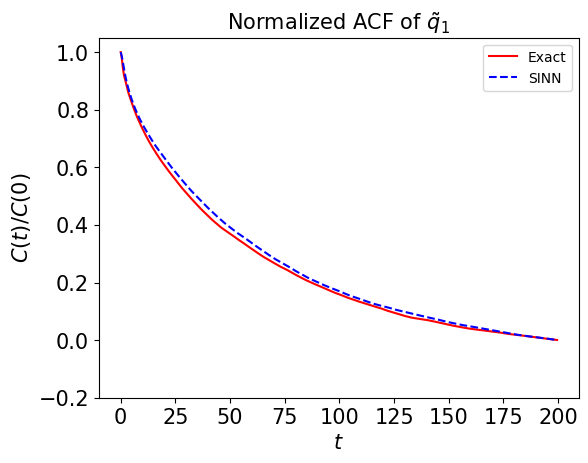

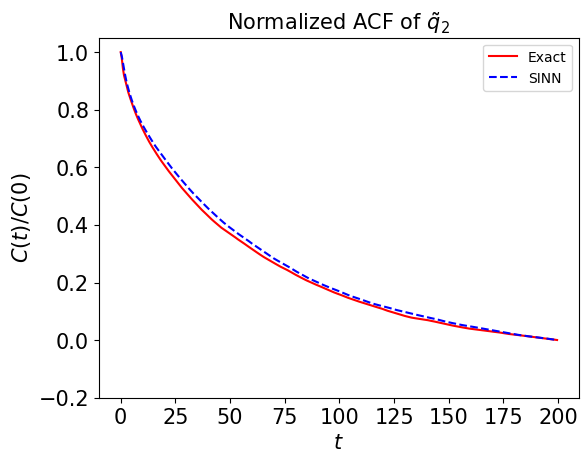

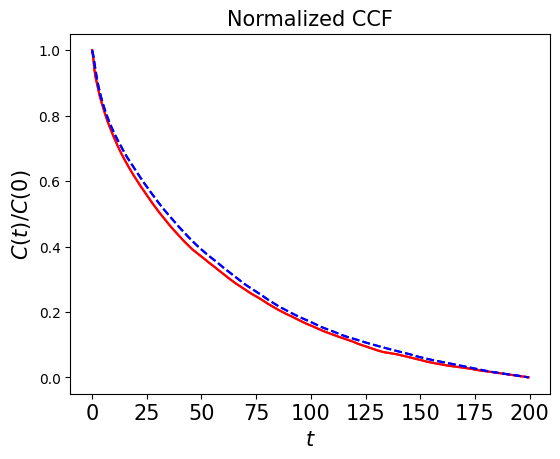

In [114]:
test2(model7)

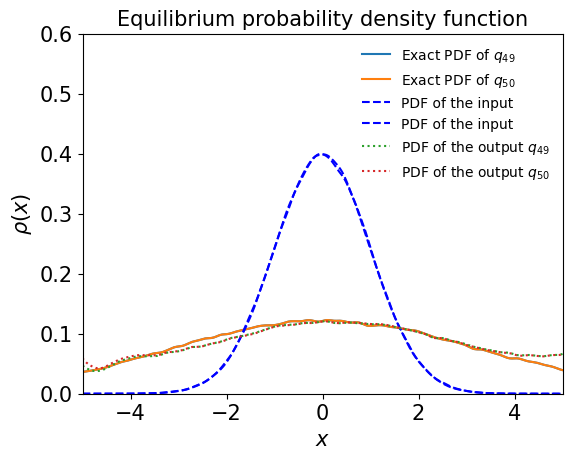

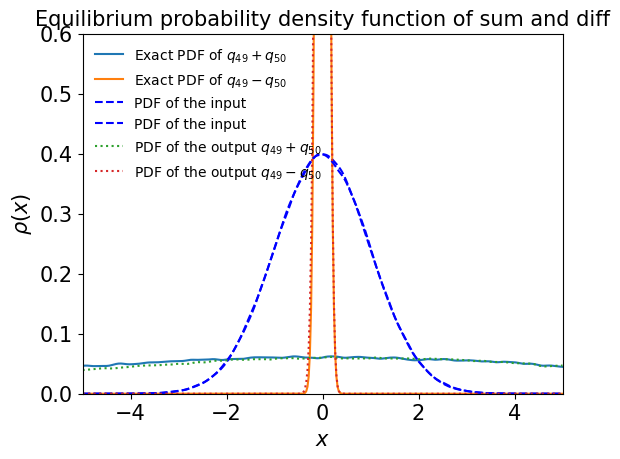

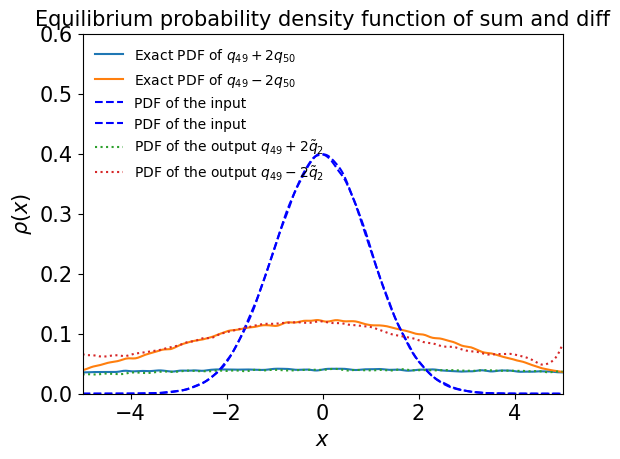

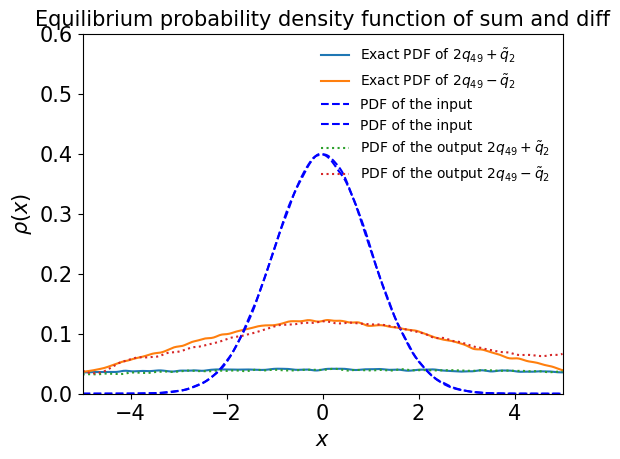

In [115]:
test3(model7)

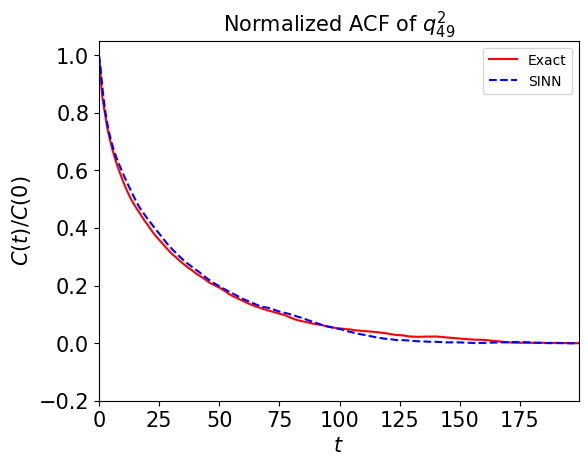

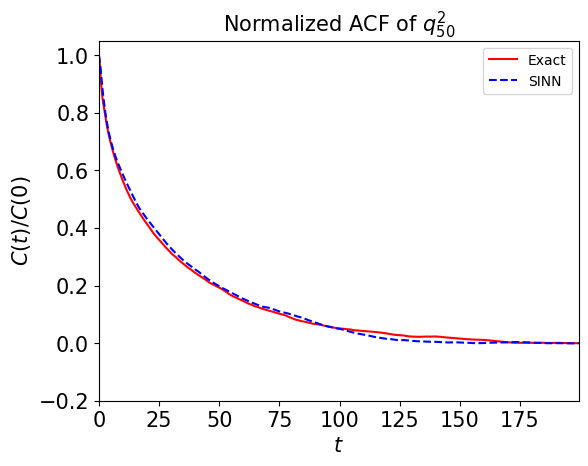

In [116]:
test4(model7)

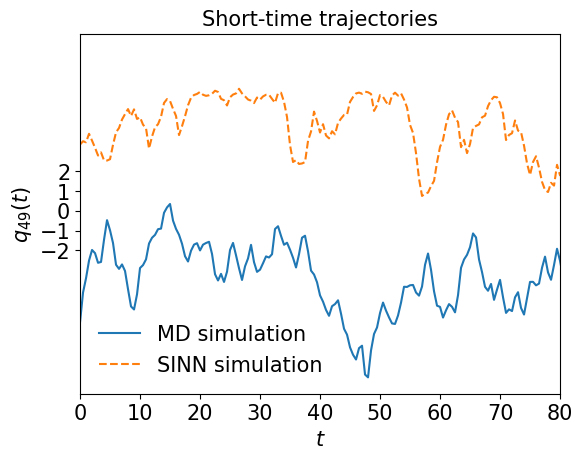

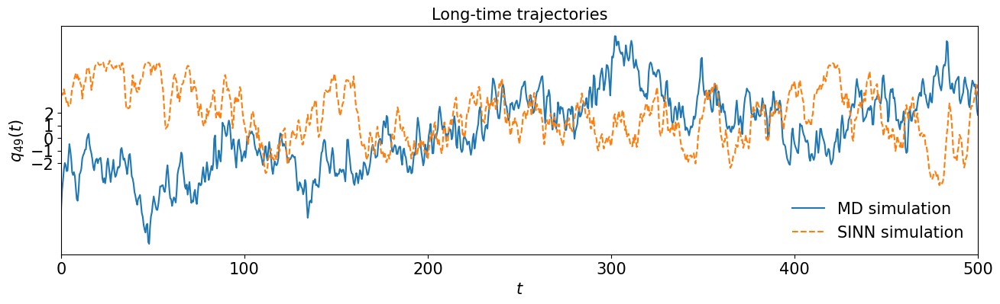

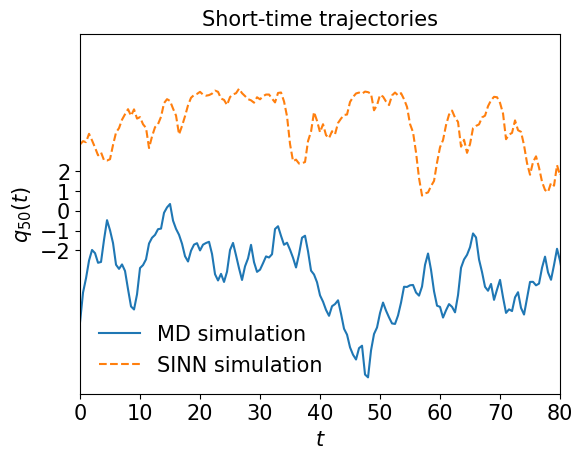

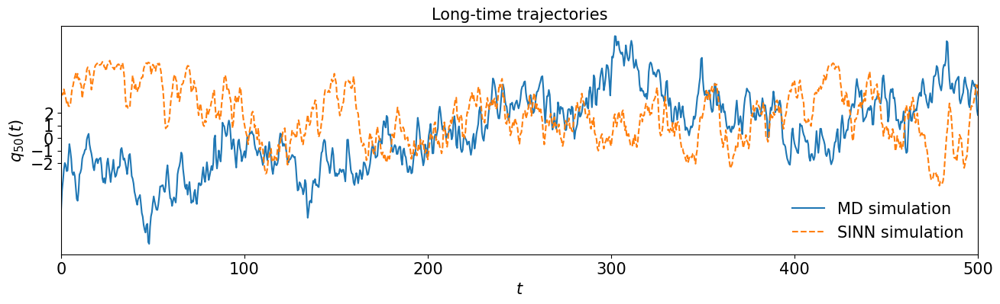

In [117]:
test5(model7)

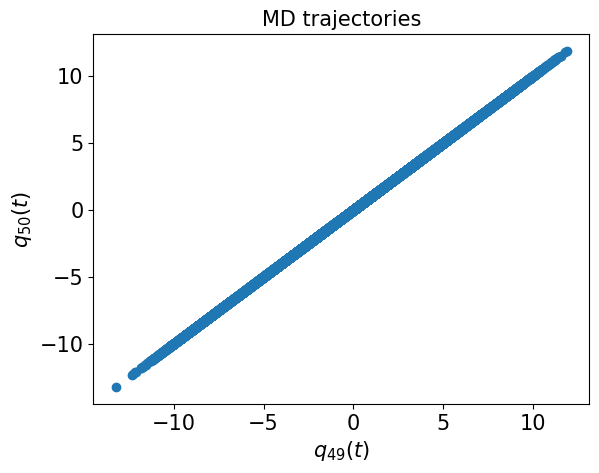

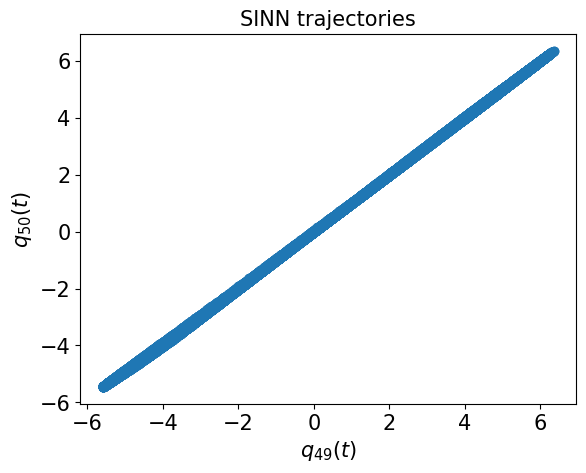

In [118]:
test6(model7)

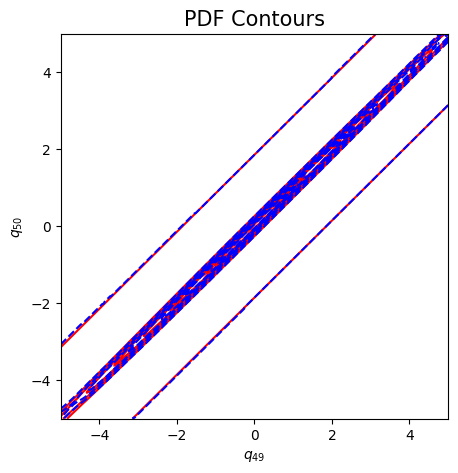

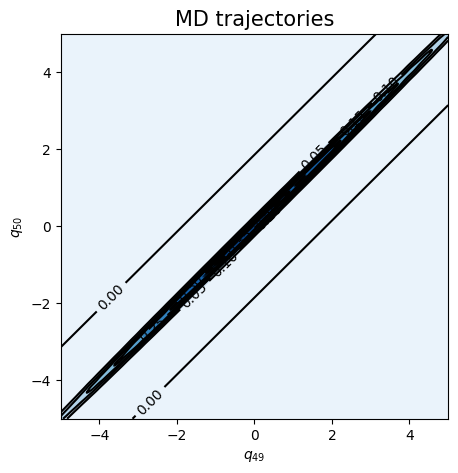

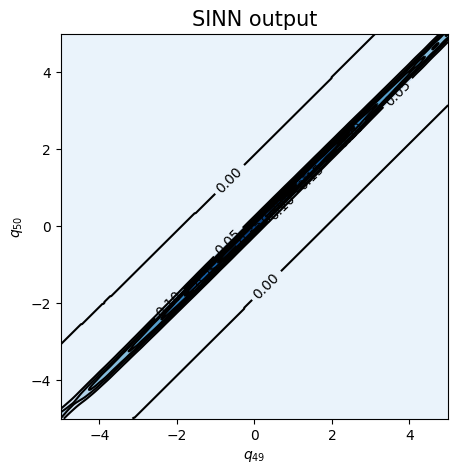

In [119]:
test7(model7)

In [120]:
### Defining SINN model
net8 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model8 = Model(net=net8)
model8.train()

[0]-th step loss: 0.8962, 0.8715, acf: 0.10183, ccf: 0.11370, pdf: 0.29292, pdf2: 0.31805, acf2: 0.04497
[50]-th step loss: 0.1000, 0.0893, acf: 0.01366, ccf: 0.01365, pdf: 0.03555, pdf2: 0.02545, acf2: 0.00099
[100]-th step loss: 0.0375, 0.0188, acf: 0.00132, ccf: 0.00132, pdf: 0.00932, pdf2: 0.00449, acf2: 0.00229
[150]-th step loss: 0.0113, 0.0103, acf: 0.00053, ccf: 0.00052, pdf: 0.00542, pdf2: 0.00222, acf2: 0.00158
[200]-th step loss: 0.1272, 0.1515, acf: 0.05611, ccf: 0.05611, pdf: 0.01057, pdf2: 0.00527, acf2: 0.02344
[250]-th step loss: 0.0280, 0.0233, acf: 0.00218, ccf: 0.00218, pdf: 0.01231, pdf2: 0.00565, acf2: 0.00095
[300]-th step loss: 0.0090, 0.0096, acf: 0.00158, ccf: 0.00158, pdf: 0.00391, pdf2: 0.00194, acf2: 0.00059
[350]-th step loss: 0.0076, 0.0066, acf: 0.00097, ccf: 0.00097, pdf: 0.00293, pdf2: 0.00126, acf2: 0.00049
[400]-th step loss: 0.0062, 0.0063, acf: 0.00119, ccf: 0.00119, pdf: 0.00142, pdf2: 0.00057, acf2: 0.00190
[450]-th step loss: 0.0046, 0.0045, acf:

[3850]-th step loss: 0.0282, 0.0256, acf: 0.00021, ccf: 0.00021, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01313
[3900]-th step loss: 0.0298, 0.0298, acf: 0.00157, ccf: 0.00147, pdf: 0.00835, pdf2: 0.00429, acf2: 0.01415
[3950]-th step loss: 0.0261, 0.0267, acf: 0.00030, ccf: 0.00031, pdf: 0.00828, pdf2: 0.00379, acf2: 0.01400
[4000]-th step loss: 0.0259, 0.0259, acf: 0.00028, ccf: 0.00029, pdf: 0.00828, pdf2: 0.00378, acf2: 0.01324
[4050]-th step loss: 0.0302, 0.0276, acf: 0.00017, ccf: 0.00017, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01523
[4100]-th step loss: 0.0289, 0.0284, acf: 0.00014, ccf: 0.00015, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01605
[4150]-th step loss: 0.0272, 0.0252, acf: 0.00018, ccf: 0.00018, pdf: 0.00828, pdf2: 0.00378, acf2: 0.01273
[4200]-th step loss: 0.0251, 0.0243, acf: 0.00029, ccf: 0.00029, pdf: 0.00828, pdf2: 0.00378, acf2: 0.01161
[4250]-th step loss: 0.0283, 0.0268, acf: 0.00005, ccf: 0.00005, pdf: 0.00828, pdf2: 0.00378, acf2: 0.01459
[4300]-th step loss: 0.0338,

[7650]-th step loss: 0.0277, 0.0288, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01661
[7700]-th step loss: 0.0231, 0.0304, acf: 0.00020, ccf: 0.00020, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01792
[7750]-th step loss: 0.0271, 0.0303, acf: 0.00016, ccf: 0.00016, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01795
[7800]-th step loss: 0.0294, 0.0271, acf: 0.00001, ccf: 0.00001, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01502
[7850]-th step loss: 0.0321, 0.0286, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01636
[7900]-th step loss: 0.0294, 0.0276, acf: 0.00002, ccf: 0.00002, pdf: 0.00828, pdf2: 0.00378, acf2: 0.01551
[7950]-th step loss: 0.0254, 0.0265, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00382, acf2: 0.01435
[8000]-th step loss: 0.0269, 0.0279, acf: 0.00003, ccf: 0.00003, pdf: 0.00828, pdf2: 0.00378, acf2: 0.01581
[8050]-th step loss: 0.0293, 0.0288, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01658
[8100]-th step loss: 0.0264,

[11450]-th step loss: 0.0253, 0.0278, acf: 0.00002, ccf: 0.00002, pdf: 0.00828, pdf2: 0.00384, acf2: 0.01566
[11500]-th step loss: 0.0256, 0.0303, acf: 0.00015, ccf: 0.00015, pdf: 0.00829, pdf2: 0.00382, acf2: 0.01790
[11550]-th step loss: 0.0265, 0.0288, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01650
[11600]-th step loss: 0.0295, 0.0302, acf: 0.00015, ccf: 0.00015, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01780
[11650]-th step loss: 0.0239, 0.0292, acf: 0.00011, ccf: 0.00011, pdf: 0.00828, pdf2: 0.00378, acf2: 0.01696
[11700]-th step loss: 0.0276, 0.0311, acf: 0.00021, ccf: 0.00021, pdf: 0.00828, pdf2: 0.00380, acf2: 0.01856
[11750]-th step loss: 0.0285, 0.0305, acf: 0.00018, ccf: 0.00018, pdf: 0.00829, pdf2: 0.00382, acf2: 0.01803
[11800]-th step loss: 0.0243, 0.0271, acf: 0.00001, ccf: 0.00001, pdf: 0.00828, pdf2: 0.00378, acf2: 0.01501
[11850]-th step loss: 0.0255, 0.0271, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01495
[11900]-th step los

[15250]-th step loss: 0.0249, 0.0273, acf: 0.00005, ccf: 0.00005, pdf: 0.00828, pdf2: 0.00378, acf2: 0.01515
[15300]-th step loss: 0.0284, 0.0289, acf: 0.00008, ccf: 0.00008, pdf: 0.00828, pdf2: 0.00378, acf2: 0.01663
[15350]-th step loss: 0.0259, 0.0235, acf: 0.00034, ccf: 0.00034, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01078
[15400]-th step loss: 0.0256, 0.0262, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01406
[15450]-th step loss: 0.0277, 0.0299, acf: 0.00013, ccf: 0.00013, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01753
[15500]-th step loss: 0.0228, 0.0280, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01585
[15550]-th step loss: 0.0240, 0.0289, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01665
[15600]-th step loss: 0.0258, 0.0328, acf: 0.00042, ccf: 0.00042, pdf: 0.00828, pdf2: 0.00381, acf2: 0.01989
[15650]-th step loss: 0.0291, 0.0301, acf: 0.00018, ccf: 0.00018, pdf: 0.00828, pdf2: 0.00378, acf2: 0.01768
[15700]-th step los

[19050]-th step loss: 0.0262, 0.0301, acf: 0.00015, ccf: 0.00015, pdf: 0.00829, pdf2: 0.00383, acf2: 0.01769
[19100]-th step loss: 0.0240, 0.0255, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00381, acf2: 0.01327
[19150]-th step loss: 0.0241, 0.0246, acf: 0.00015, ccf: 0.00015, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01226
[19200]-th step loss: 0.0257, 0.0261, acf: 0.00002, ccf: 0.00002, pdf: 0.00828, pdf2: 0.00382, acf2: 0.01397
[19250]-th step loss: 0.0300, 0.0313, acf: 0.00023, ccf: 0.00023, pdf: 0.00828, pdf2: 0.00378, acf2: 0.01873
[19300]-th step loss: 0.0270, 0.0281, acf: 0.00004, ccf: 0.00004, pdf: 0.00828, pdf2: 0.00380, acf2: 0.01595
[19350]-th step loss: 0.0284, 0.0291, acf: 0.00011, ccf: 0.00011, pdf: 0.00831, pdf2: 0.00381, acf2: 0.01677
[19400]-th step loss: 0.0265, 0.0307, acf: 0.00022, ccf: 0.00022, pdf: 0.00829, pdf2: 0.00379, acf2: 0.01818
[19450]-th step loss: 0.0293, 0.0279, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01567
[19500]-th step los

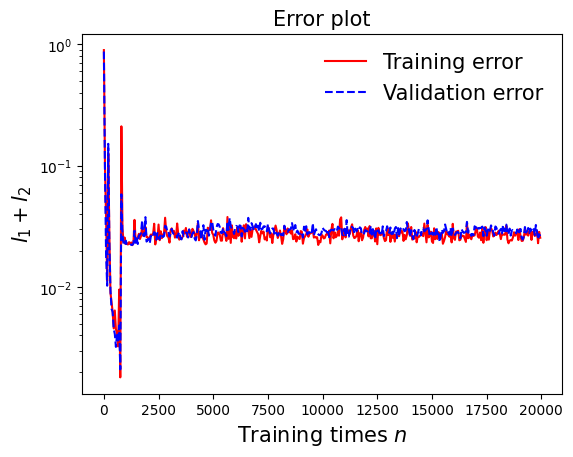

In [121]:
draw_loss(model8)

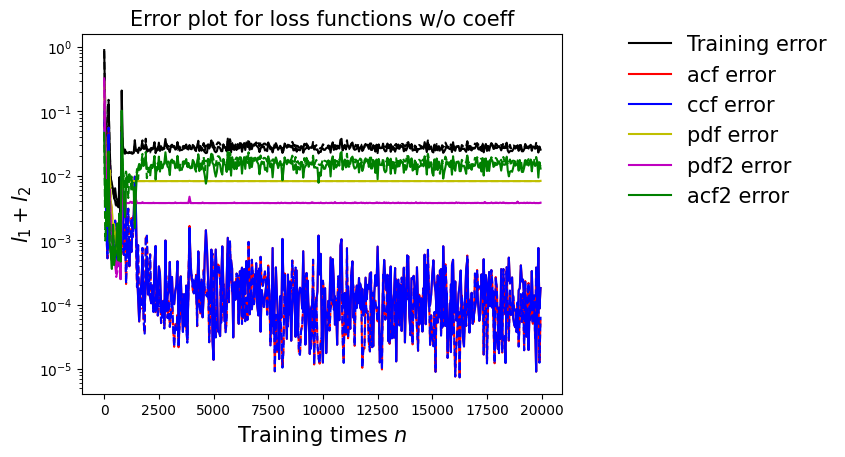

In [122]:
draw_errors(model8)

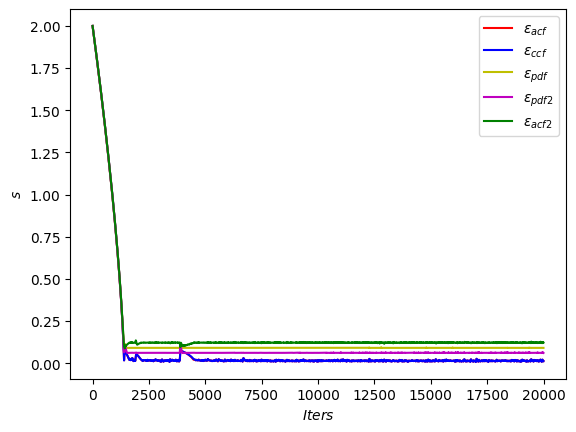

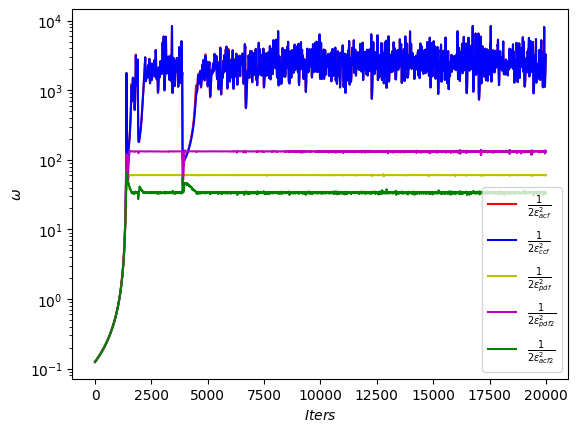

In [123]:
draw_adaptive_w(model8)
draw_epoch_w(model8)

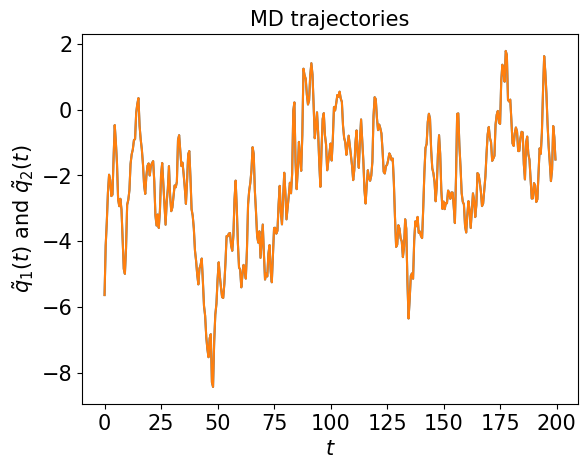

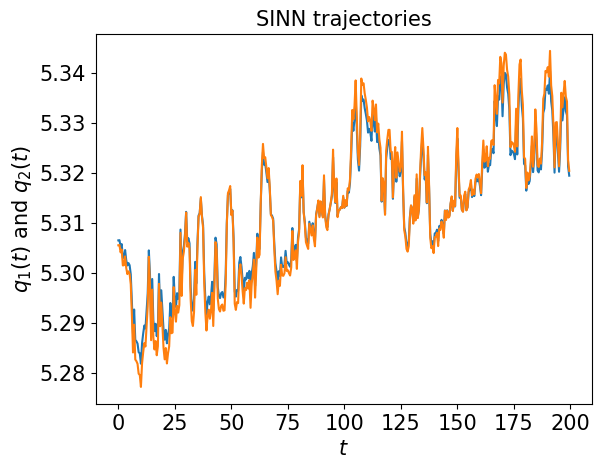

In [124]:
test1(model8)

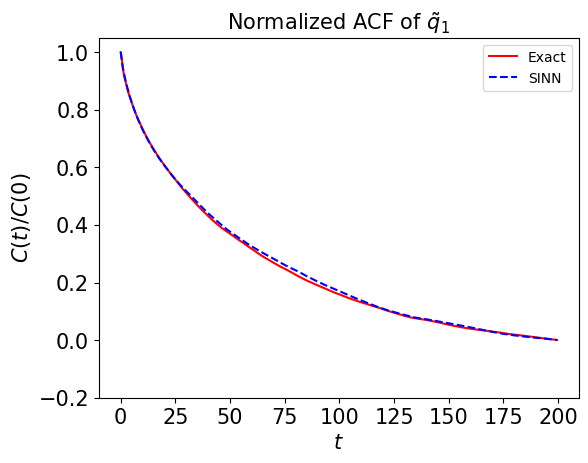

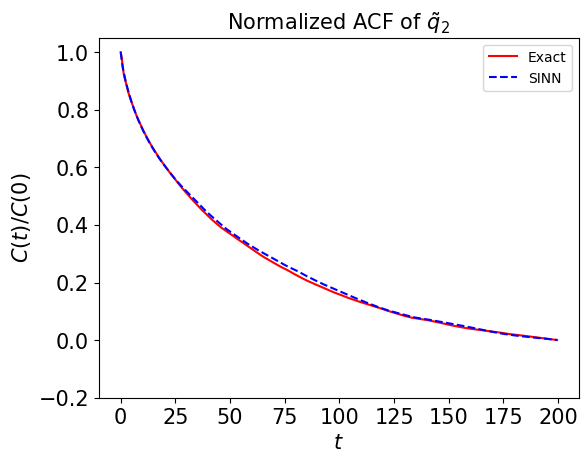

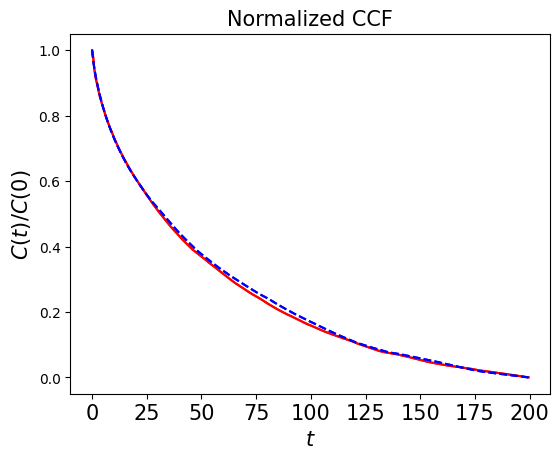

In [125]:
test2(model8)

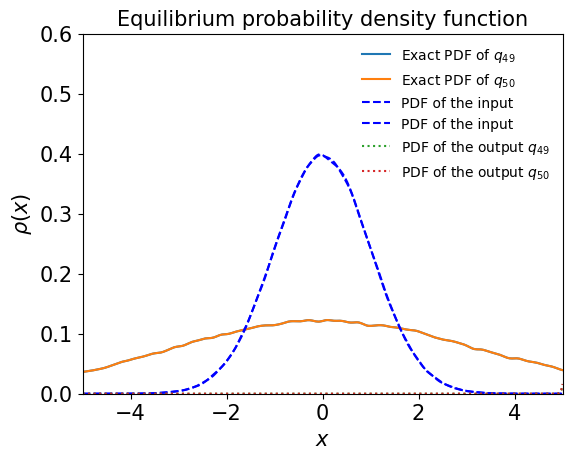

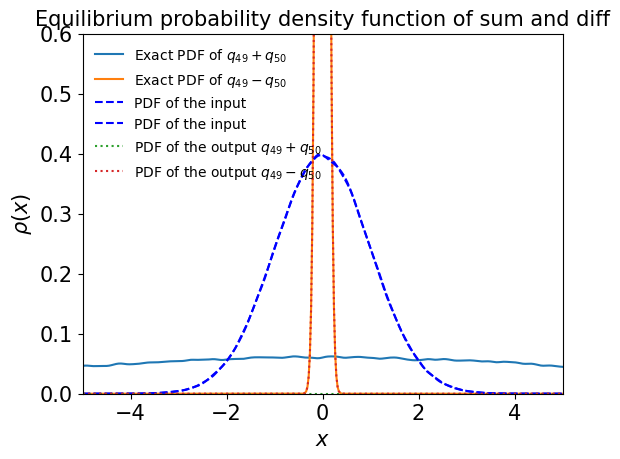

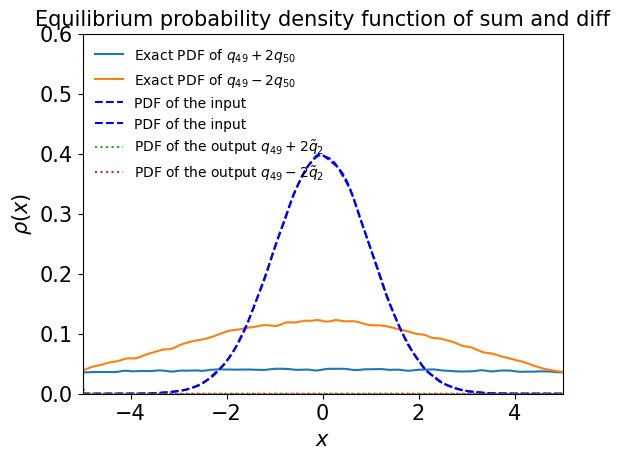

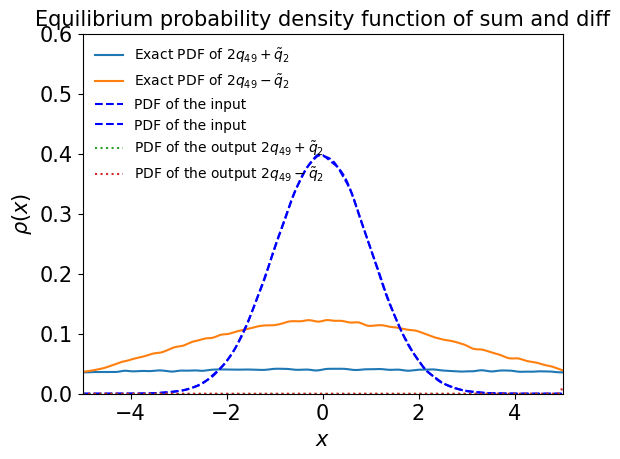

In [126]:
test3(model8)

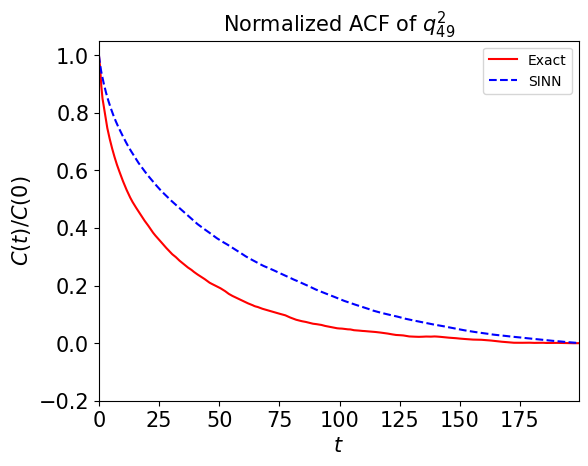

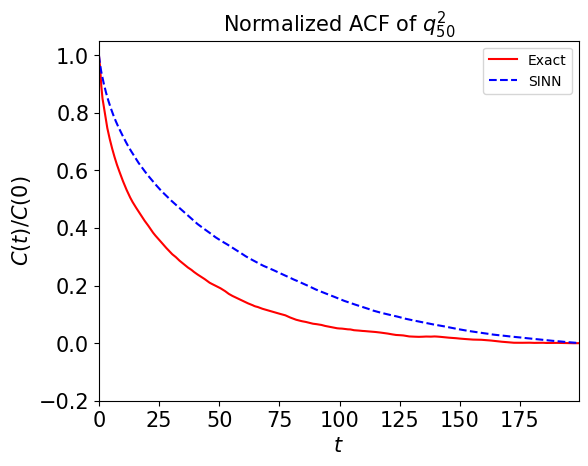

In [127]:
test4(model8)

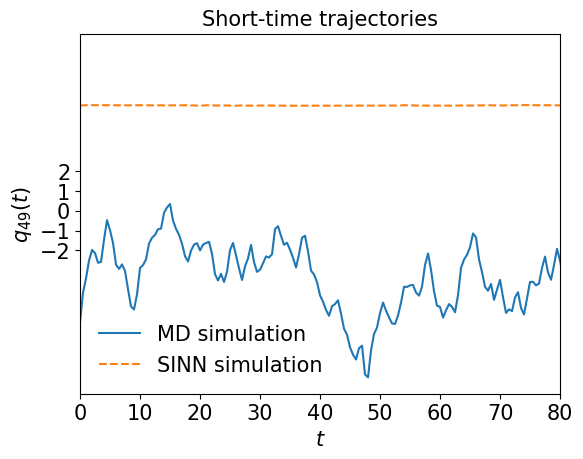

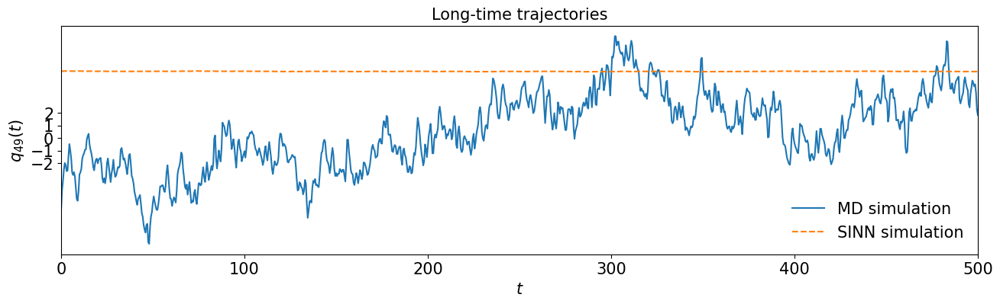

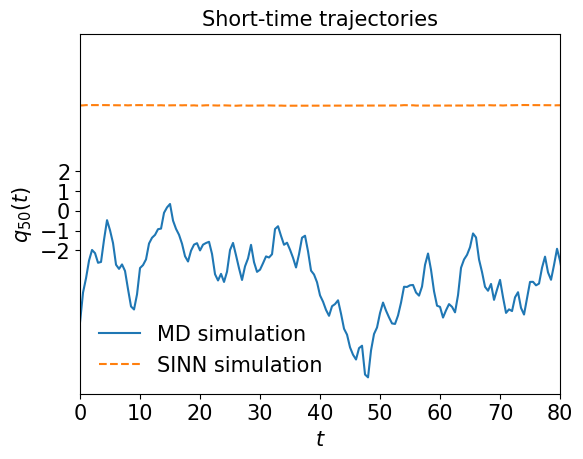

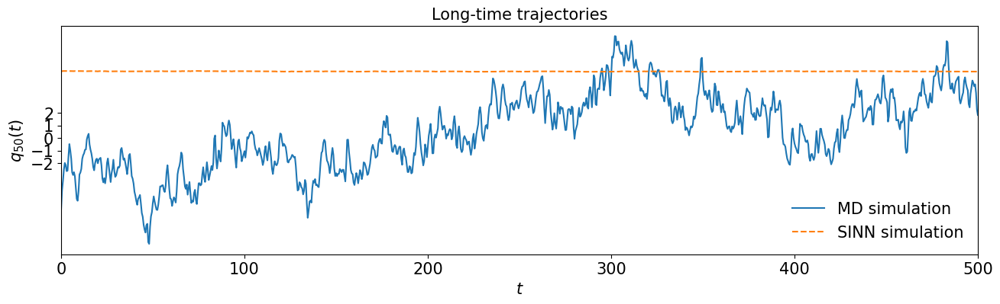

In [128]:
test5(model8)

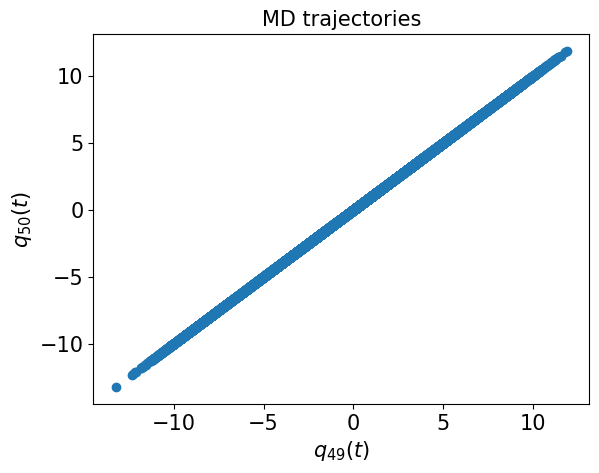

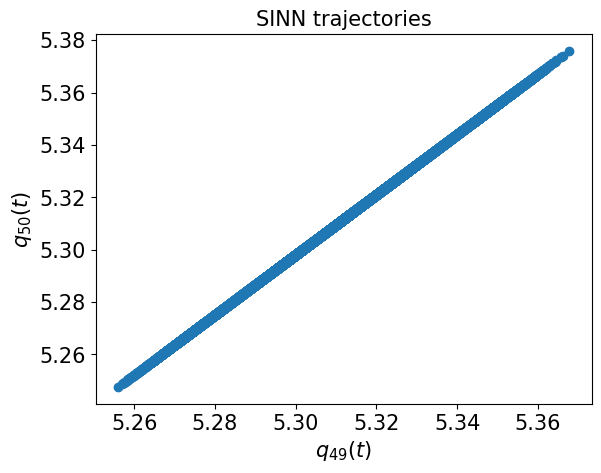

In [129]:
test6(model8)

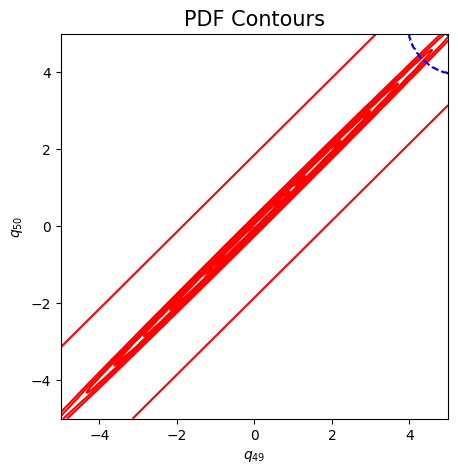

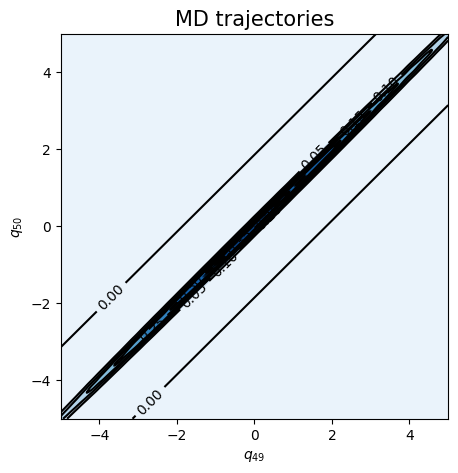

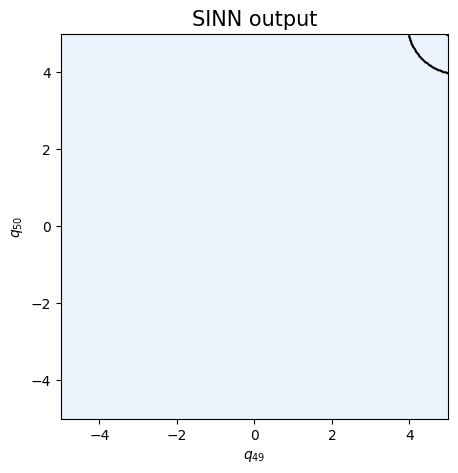

In [130]:
test7(model8)

In [131]:
### Defining SINN model
net9 = SINN(2, 50, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model9 = Model(net=net9)
model9.train()

[0]-th step loss: 0.8187, 0.7999, acf: 0.10436, ccf: 0.10580, pdf: 0.29309, pdf2: 0.24953, acf2: 0.04715
[50]-th step loss: 0.2396, 0.2085, acf: 0.04052, ccf: 0.04052, pdf: 0.07217, pdf2: 0.04303, acf2: 0.01229
[100]-th step loss: 0.1755, 0.1748, acf: 0.06402, ccf: 0.06402, pdf: 0.01691, pdf2: 0.00843, acf2: 0.02145
[150]-th step loss: 0.0476, 0.0437, acf: 0.00233, ccf: 0.00233, pdf: 0.01840, pdf2: 0.00889, acf2: 0.01176
[200]-th step loss: 0.0234, 0.0148, acf: 0.00104, ccf: 0.00104, pdf: 0.00811, pdf2: 0.00366, acf2: 0.00092
[250]-th step loss: 0.0100, 0.0091, acf: 0.00065, ccf: 0.00064, pdf: 0.00509, pdf2: 0.00212, acf2: 0.00064
[300]-th step loss: 0.0066, 0.0066, acf: 0.00041, ccf: 0.00041, pdf: 0.00353, pdf2: 0.00146, acf2: 0.00082
[350]-th step loss: 0.0278, 0.0233, acf: 0.00314, ccf: 0.00314, pdf: 0.01100, pdf2: 0.00522, acf2: 0.00077
[400]-th step loss: 0.0111, 0.0199, acf: 0.00209, ccf: 0.00209, pdf: 0.00815, pdf2: 0.00304, acf2: 0.00456
[450]-th step loss: 0.0081, 0.0077, acf:

[3850]-th step loss: 0.0464, 0.0406, acf: 0.01435, ccf: 0.01435, pdf: 0.00813, pdf2: 0.00374, acf2: 0.00007
[3900]-th step loss: 0.0340, 0.0348, acf: 0.01239, ccf: 0.01239, pdf: 0.00383, pdf2: 0.00312, acf2: 0.00304
[3950]-th step loss: 0.0130, 0.0129, acf: 0.00273, ccf: 0.00273, pdf: 0.00397, pdf2: 0.00185, acf2: 0.00157
[4000]-th step loss: 0.0111, 0.0095, acf: 0.00124, ccf: 0.00124, pdf: 0.00363, pdf2: 0.00165, acf2: 0.00177
[4050]-th step loss: 0.0116, 0.0100, acf: 0.00183, ccf: 0.00183, pdf: 0.00333, pdf2: 0.00151, acf2: 0.00154
[4100]-th step loss: 0.0117, 0.0097, acf: 0.00177, ccf: 0.00177, pdf: 0.00293, pdf2: 0.00131, acf2: 0.00189
[4150]-th step loss: 0.0105, 0.0080, acf: 0.00123, ccf: 0.00123, pdf: 0.00310, pdf2: 0.00138, acf2: 0.00109
[4200]-th step loss: 0.0094, 0.0091, acf: 0.00196, ccf: 0.00196, pdf: 0.00273, pdf2: 0.00121, acf2: 0.00127
[4250]-th step loss: 0.0108, 0.0094, acf: 0.00101, ccf: 0.00101, pdf: 0.00349, pdf2: 0.00164, acf2: 0.00220
[4300]-th step loss: 0.0122,

[7650]-th step loss: 0.0037, 0.0043, acf: 0.00016, ccf: 0.00016, pdf: 0.00256, pdf2: 0.00115, acf2: 0.00024
[7700]-th step loss: 0.0042, 0.0047, acf: 0.00066, ccf: 0.00066, pdf: 0.00228, pdf2: 0.00101, acf2: 0.00012
[7750]-th step loss: 0.0042, 0.0040, acf: 0.00023, ccf: 0.00023, pdf: 0.00242, pdf2: 0.00108, acf2: 0.00004
[7800]-th step loss: 0.0038, 0.0043, acf: 0.00024, ccf: 0.00024, pdf: 0.00233, pdf2: 0.00104, acf2: 0.00043
[7850]-th step loss: 0.0051, 0.0055, acf: 0.00046, ccf: 0.00046, pdf: 0.00281, pdf2: 0.00128, acf2: 0.00048
[7900]-th step loss: 0.0053, 0.0041, acf: 0.00005, ccf: 0.00005, pdf: 0.00260, pdf2: 0.00118, acf2: 0.00021
[7950]-th step loss: 0.0037, 0.0031, acf: 0.00010, ccf: 0.00010, pdf: 0.00194, pdf2: 0.00085, acf2: 0.00007
[8000]-th step loss: 0.0050, 0.0042, acf: 0.00031, ccf: 0.00031, pdf: 0.00220, pdf2: 0.00099, acf2: 0.00039
[8050]-th step loss: 0.0034, 0.0026, acf: 0.00013, ccf: 0.00013, pdf: 0.00160, pdf2: 0.00069, acf2: 0.00002
[8100]-th step loss: 0.0029,

[11450]-th step loss: 0.0016, 0.0013, acf: 0.00004, ccf: 0.00004, pdf: 0.00082, pdf2: 0.00033, acf2: 0.00003
[11500]-th step loss: 0.0021, 0.0030, acf: 0.00051, ccf: 0.00051, pdf: 0.00097, pdf2: 0.00043, acf2: 0.00055
[11550]-th step loss: 0.0025, 0.0017, acf: 0.00023, ccf: 0.00023, pdf: 0.00082, pdf2: 0.00033, acf2: 0.00010
[11600]-th step loss: 0.0029, 0.0027, acf: 0.00024, ccf: 0.00024, pdf: 0.00110, pdf2: 0.00050, acf2: 0.00058
[11650]-th step loss: 0.0020, 0.0016, acf: 0.00014, ccf: 0.00014, pdf: 0.00076, pdf2: 0.00031, acf2: 0.00023
[11700]-th step loss: 0.0021, 0.0027, acf: 0.00038, ccf: 0.00038, pdf: 0.00123, pdf2: 0.00054, acf2: 0.00022
[11750]-th step loss: 0.0015, 0.0017, acf: 0.00024, ccf: 0.00024, pdf: 0.00061, pdf2: 0.00024, acf2: 0.00039
[11800]-th step loss: 0.0030, 0.0033, acf: 0.00085, ccf: 0.00085, pdf: 0.00077, pdf2: 0.00032, acf2: 0.00051
[11850]-th step loss: 0.0014, 0.0014, acf: 0.00021, ccf: 0.00021, pdf: 0.00061, pdf2: 0.00024, acf2: 0.00012
[11900]-th step los

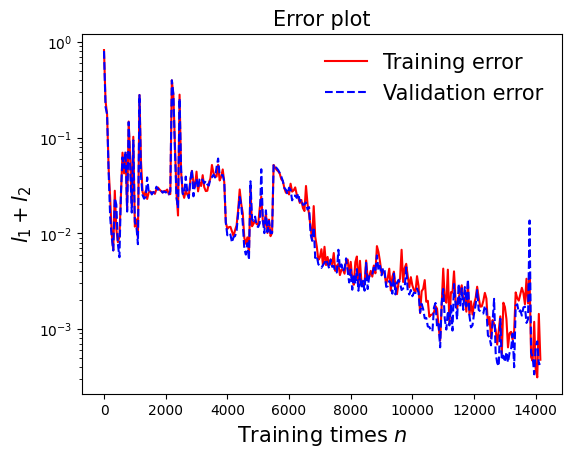

In [132]:
draw_loss(model9)

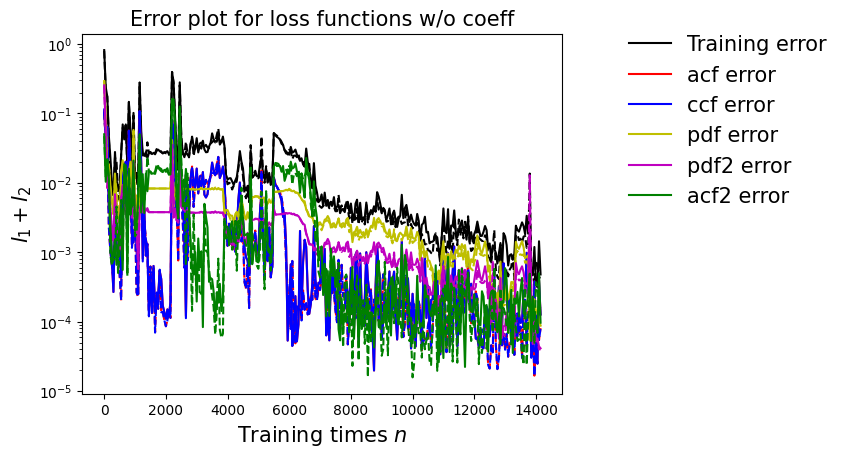

In [133]:
draw_errors(model9)

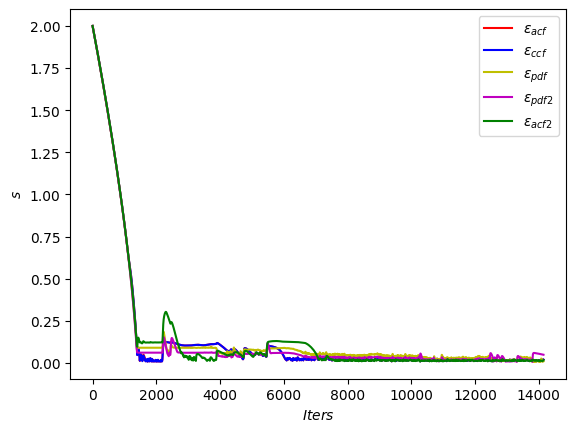

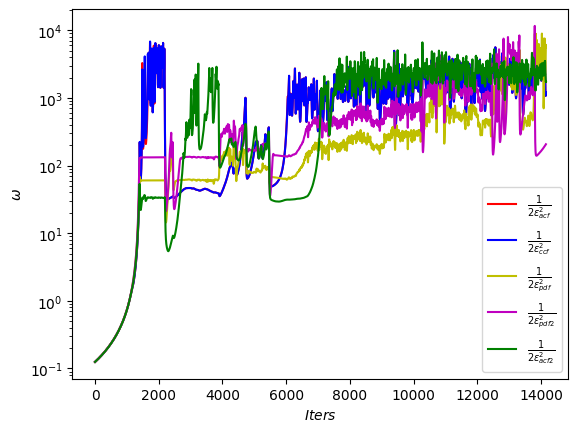

In [134]:
draw_adaptive_w(model9)
draw_epoch_w(model9)

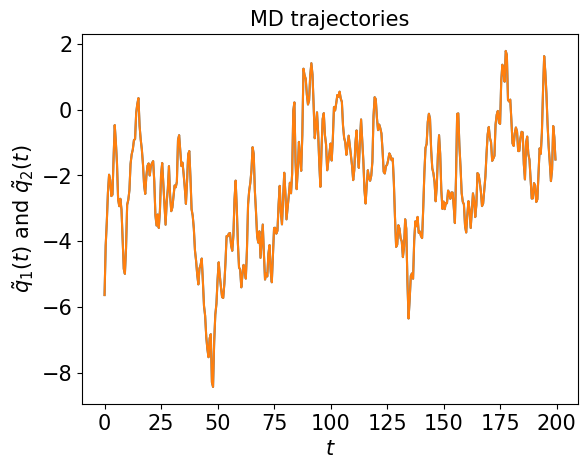

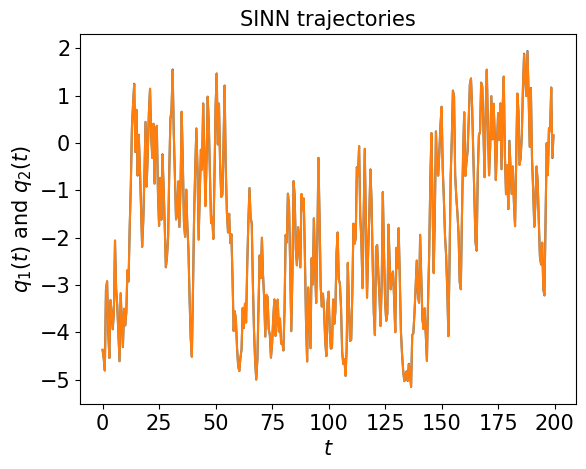

In [135]:
test1(model9)

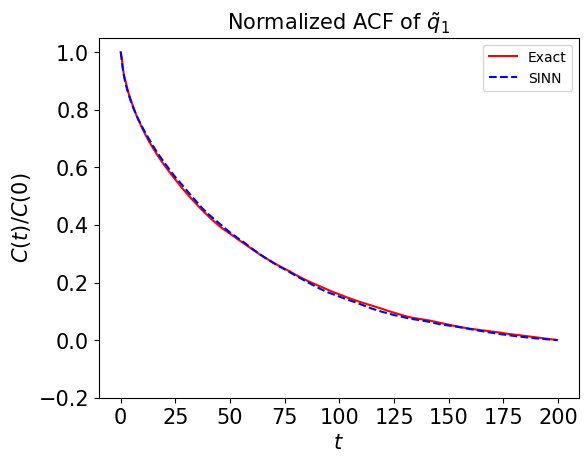

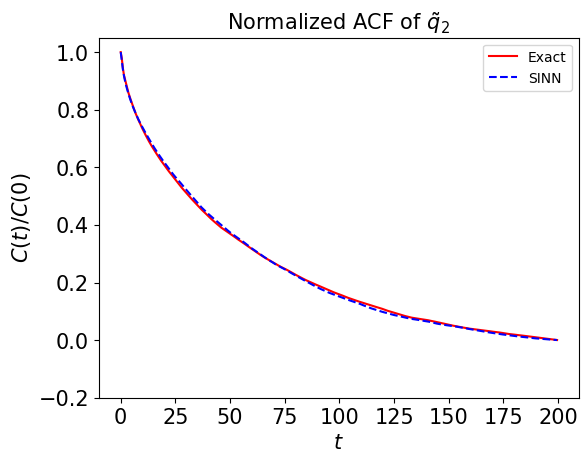

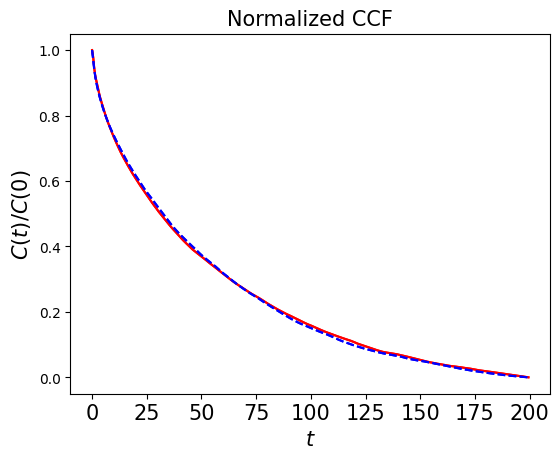

In [136]:
test2(model9)

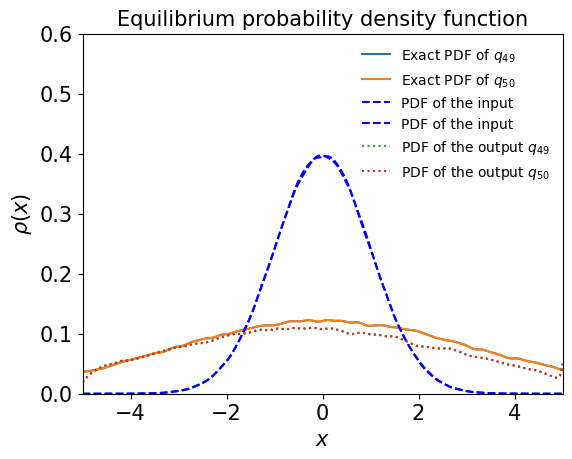

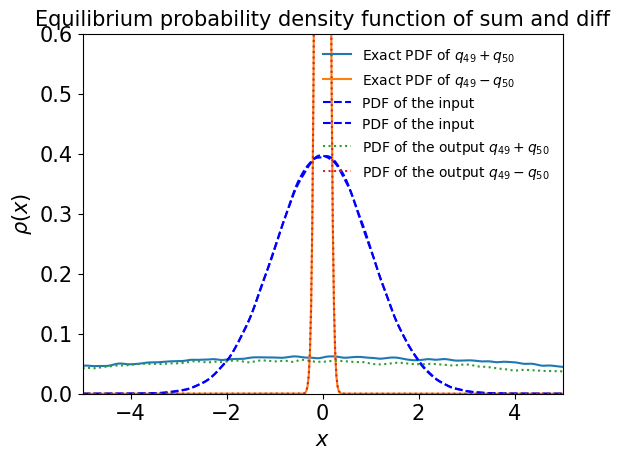

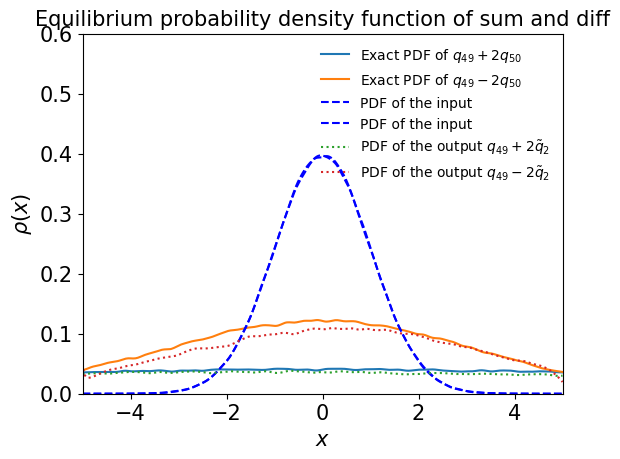

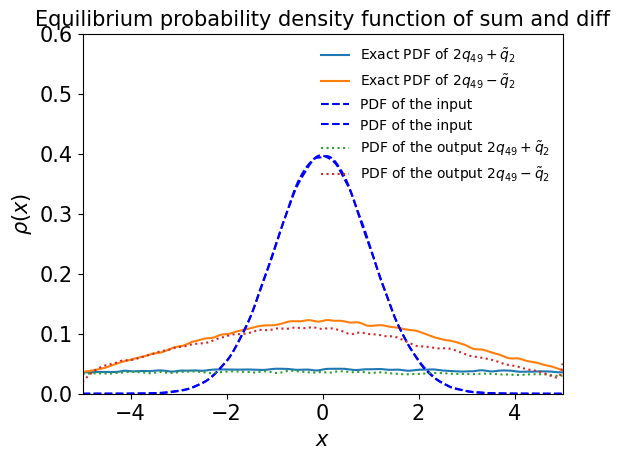

In [137]:
test3(model9)

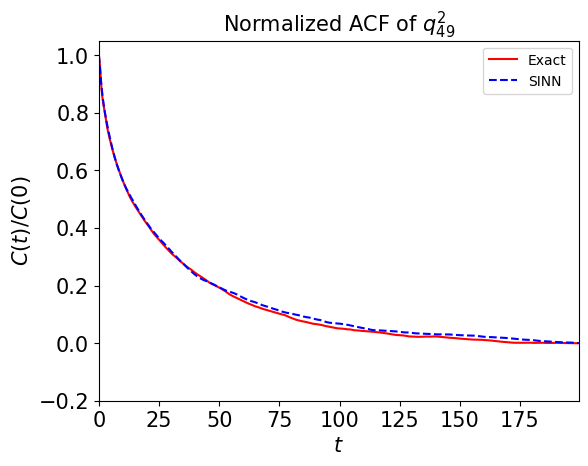

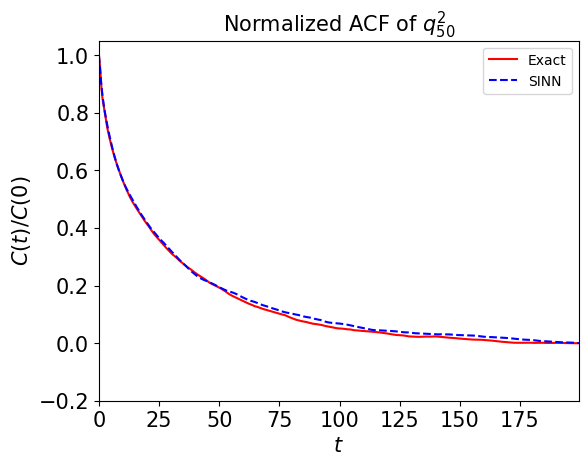

In [138]:
test4(model9)

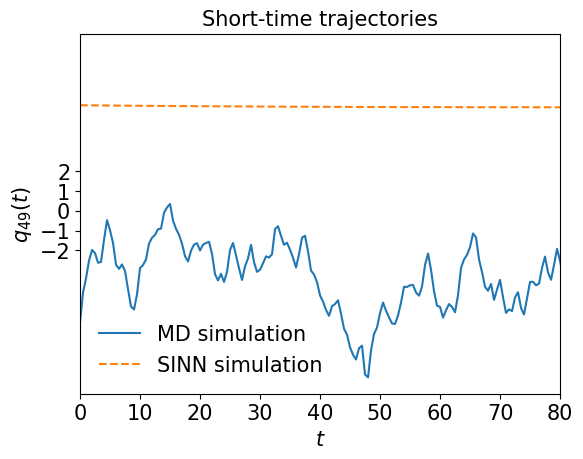

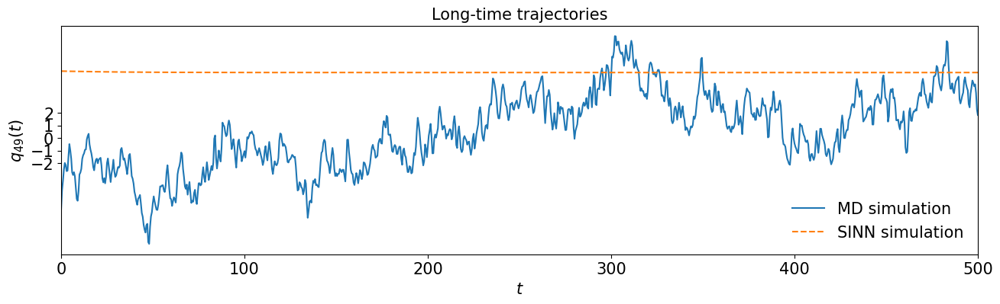

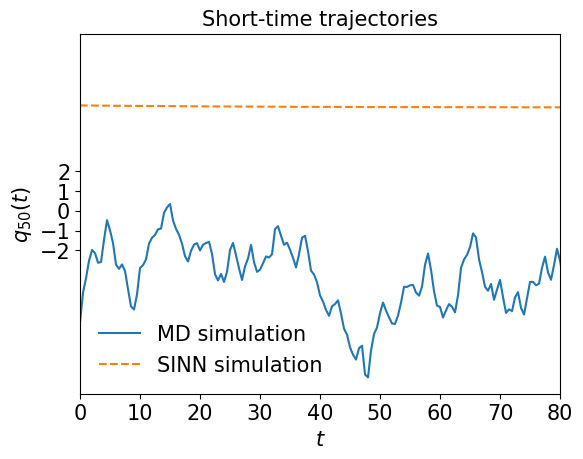

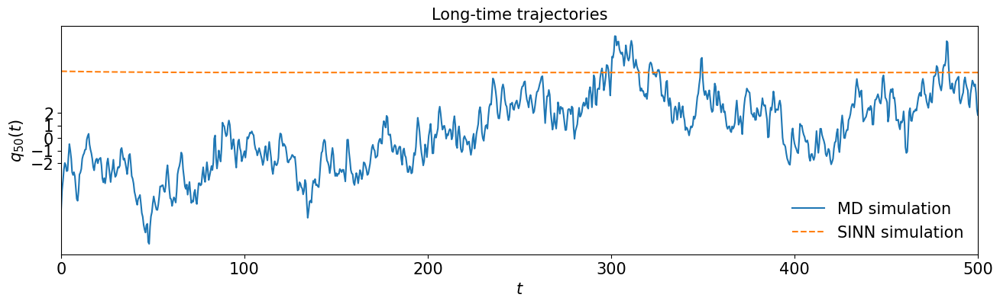

In [139]:
test5(model9)

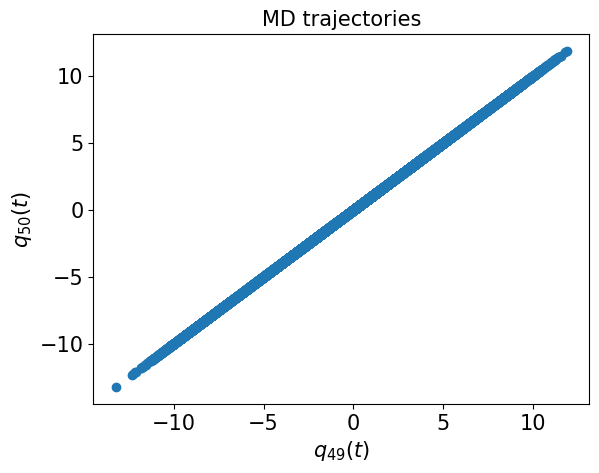

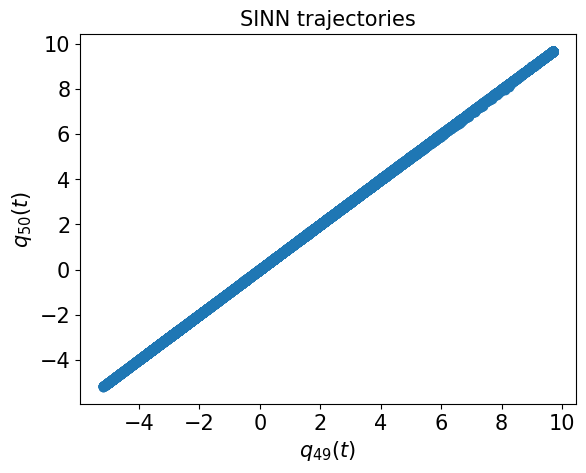

In [140]:
test6(model9)

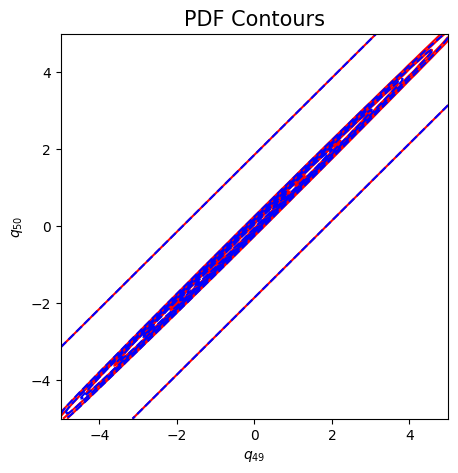

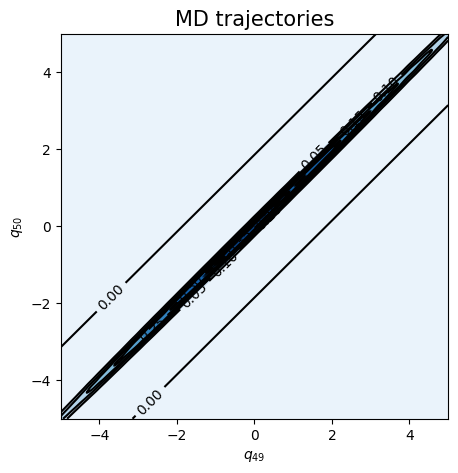

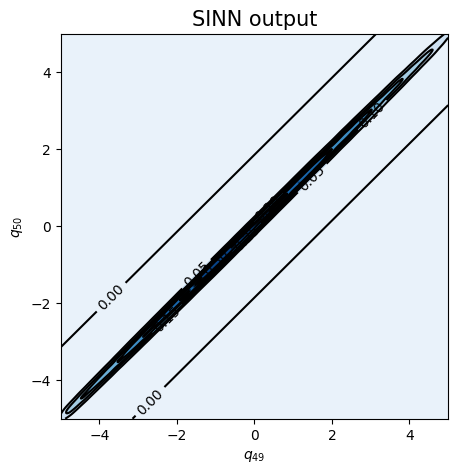

In [141]:
test7(model9)